In [1]:
#  Import necessary libraries and functions

import numpy as np
import astropy.units as u
import astropy.constants as c
from scipy.optimize import fsolve
from scipy.interpolate import UnivariateSpline, interp1d
import matplotlib.pyplot as plt
import lal
import lalsimulation as lalsim
import os
import sys
sys.path.append("./data/")
#from data import PACKAGE_FILENAMES

def compute_isco(chi_bh):
    '''
    This function takes as input the aligned spin component of the BH and
    returns the innermost stable circular orbit radius normalized by the mass
    of the BH.
    '''
    if not np.all([np.abs(chi_bh) <= 1.0]):
        raise ValueError('|chi1| must be less than 1.0')
    Z1 = 1.0 + ((1.0 - chi_bh**2)**(1. / 3.)) * ((1 + chi_bh)**(1. / 3.) +
                                             (1 - chi_bh)**(1. / 3.))
    Z2 = np.sqrt(3 * chi_bh**2 + Z1**2)
    r_isco = 3 + Z2 - np.sign(chi_bh) * np.sqrt((3 - Z1) * (3 + Z1 + 2 * Z2))
    return r_isco

def spins_to_chi_eff(m1, m2, chi1, chi2):
    '''
    This function returns the effective spin of the system
    '''
    chi_eff = (chi1*m1 + chi2*m2)/(m1 + m2)
    return chi_eff


def _lalsim_neutron_star_radius(m, max_mass, fam):
    '''Return neutron star radius in meters'''
    if m > max_mass:
        return m * 1500  # 1 solar mass = 1500m
    else:
        try:
            return lalsim.SimNeutronStarRadius(m * lal.MSUN_SI, fam)
        except RuntimeError:
            # FIXME handle RuntimeError for edge cases
            # Raised if m is close to max_mass
            # GSL function failed: interpolation error (errnum=1)
            # XLAL Error - <GSL function> (interp.c:150): Generic failure
            return m * 1500


def _r_ns_from_lal_simulation(m_ns, eosname):
    eos = lalsim.SimNeutronStarEOSByName(eosname)
    fam = lalsim.CreateSimNeutronStarFamily(eos)
    max_mass = lalsim.SimNeutronStarMaximumMass(fam) / c.M_sun.value
    try:
        iter(m_ns)
        R_ns = np.array([_lalsim_neutron_star_radius(m, max_mass, fam)
                        for m in m_ns])
    except TypeError:
        R_ns = _lalsim_neutron_star_radius(m_ns, max_mass, fam)
    return R_ns, max_mass


def _compactness_baryon_mass(m_ns, r_ns):
    C_ns = c.G * m_ns * c.M_sun / (r_ns * u.m * c.c**2)
    C_ns = C_ns.value

    d1 = 0.619
    d2 = 0.1359
    BE = (d1 * C_ns + d2 * C_ns * C_ns) * m_ns  # arXiv:1601.06083 (Eq: 21)
    m2_b = m_ns + BE  # Baryonic mass - Gravitational mass = Binding Energy
    return [C_ns, m2_b]


def max_mass_from_eosname(eosname):
    if eosname == "2H":
        max_mass = 2.834648092299807
    else:
        eos = lalsim.SimNeutronStarEOSByName(eosname)
        fam = lalsim.CreateSimNeutronStarFamily(eos)
        max_mass = lalsim.SimNeutronStarMaximumMass(fam) / c.M_sun.value
    return max_mass

def computeCompactness(M_ns, eosname='2H', max_mass=None):
    '''
    Return the neutron star compactness as a function of mass
    and equation of state or radius

    Parameters
    ----------
    M_ns : array_like
        Neutron star mass in solar masses
    eosname : str or interp1d
        Neutron star equation of state to be used
    max_mass : float
        Maximum mass of neutron star.

    Returns
    -------
    [C_ns, m2_b, max_mass]
        Compactness, baryon mass and maximum neutron star mass
        in solar masses.

    Notes
    -----
    The radius and maximum mass of the neutron star is
    inferred based on the equation of state supplied.
    Max mass only needs to be supplied for EoS marginalization.

    Examples
    --------
    >>> computeCompactness(2.8)
    [array(0.298), array(3.354), 2.834]
    >>> computeDiskMass.computeCompactness(2.9, eosname='AP4')
    [0.5, 0.0, 2.212]
    >>> m_ns = np.array([1.1, 1.2, 1.3])
    >>> computeDiskMass.computeCompactness(m_ns, eosname='AP4')
    [array([0.141, 0.154, 0.167]), array([1.199, 1.318, 1.439]), 2.212]
    '''
    if isinstance(eosname, interp1d):
        # find R as a function of M
        R_ns = eosname(M_ns)
        C_ns, m2_b = _compactness_baryon_mass(M_ns, R_ns)
    elif eosname != '2H':
        # infer radius and maximum mass based on lalsimulation EoS
        R_ns, max_mass = _r_ns_from_lal_simulation(M_ns, eosname)
        C_ns, m2_b = _compactness_baryon_mass(M_ns, R_ns)
    else:
        with open(PACKAGE_FILENAMES['equil_2H.dat'], 'rb') as f:
            M_g, M_b, Compactness = np.loadtxt(f, unpack=True)
        max_mass = max_mass_from_eosname("2H")
        s = UnivariateSpline(M_g, Compactness, k=5)
        s_b = UnivariateSpline(M_g, M_b, k=5)
        C_ns = s(M_ns)
        m2_b = s_b(M_ns)
    try:
        C_ns[M_ns > max_mass] = 0.5  # BH compactness set to 0.5
        m2_b[M_ns > max_mass] = 0.0  # BH baryon mass set to 0.0
    except TypeError:  # if C_ns is not an array
        if M_ns > max_mass:
            C_ns = 0.5
            m2_b = 0.0
    return [C_ns, m2_b, max_mass]

/tmp/ipykernel_16449/192373456.py:9: UserWarning: Wswiglal-redir-stdio:

SWIGLAL standard output/error redirection is enabled in IPython.
This may lead to performance penalties. To disable locally, use:

with lal.no_swig_redirect_standard_output_error():
    ...

To disable globally, use:

lal.swig_redirect_standard_output_error(False)

Note however that this will likely lead to error messages from
LAL functions being either misdirected or lost when called from
Jupyter notebooks.

To suppress this warning, use:

import warnings
warnings.filterwarnings("ignore", "Wswiglal-redir-stdio")
import lal

  import lal


In [2]:
# NMMA imports
import nmma.em.io as io
from nmma.em.model import SimpleKilonovaLightCurveModel, SVDLightCurveModel
from nmma.em import model_parameters


Install afterglowpy if you want to simulate afterglows.
Install wrapt_timeout_decorator if you want timeout simulations.


/home/liteul/anaconda3/envs/nmma_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# NMMA model setup

# Load model Bu2019lm
model_name = 'Bu2019lm'
svd_path = '/home/liteul/memoir_code/NMMA/svdmodels'

# Sample times for SVD model
tmin_svd, tmax_svd, dt_svd = 0.1, 10.0, 0.5
sample_times_svd = np.arange(tmin_svd, tmax_svd + dt_svd, dt_svd)

# Filters for SVD
filters_svd = ['ztfr','ztfi','ztfg']

try:
    svd_model = SVDLightCurveModel(
        model=model_name,
        sample_times=sample_times_svd,
        svd_path=svd_path,
        mag_ncoeff=10,
        lbol_ncoeff=10,
        filters=filters_svd
    )
    print(f"✓ SVD model '{model_name}' successfully loaded")
    print(f"  Filters: {filters_svd}")
    print(f"  Times: {len(sample_times_svd)} points")
except Exception as e:
    print(f"Error loading SVD model: {e}")

Loaded filter ztfr
Loaded filter ztfi
Loaded filter ztfg
✓ SVD model 'Bu2019lm' successfully loaded
  Filters: ['ztfr', 'ztfi', 'ztfg']
  Times: 21 points


In [4]:
# Fitting formula functions
def dyn_ej(a = -9.3335, b = 114.17, d = -337.56, n = 1.5465, M1 = 1.4, R1 = 10, M2 = 1.4, R2 = 10):
    C1 = 1.476625 * M1 / R1
    C2 = 1.476625 * M2 / R2
    x = (a/C1 + b*(M2**n/M1**n) + d*C1)*M1 + (a/C2 + b*(M1**n/M2**n) + d*C2)*M2
    if x < 0:
        return 0
    else:
        return x/1000
    
def wind_ej(M1, M2, a0=-1.581, deltaa=-2.439, b0=-0.538, deltab=-0.406, c=0.953, d=0.0417, beta=3.91, qtrans=0.9, Mtov=1.97, R16=11.137): 
    Mtresh = (2.38 - 3.606 * (Mtov/R16))*Mtov
    q = M2/M1
    xsi = 0.5 * np.tanh(beta * (q - qtrans))
    a = a0 + deltaa * xsi
    b = b0 + deltab * xsi
    mwind = a * (1 + b * np.tanh( (c - (M1+M2)/Mtresh)/d ))
    if -3 > mwind:
        return -3
    else:
        return mwind

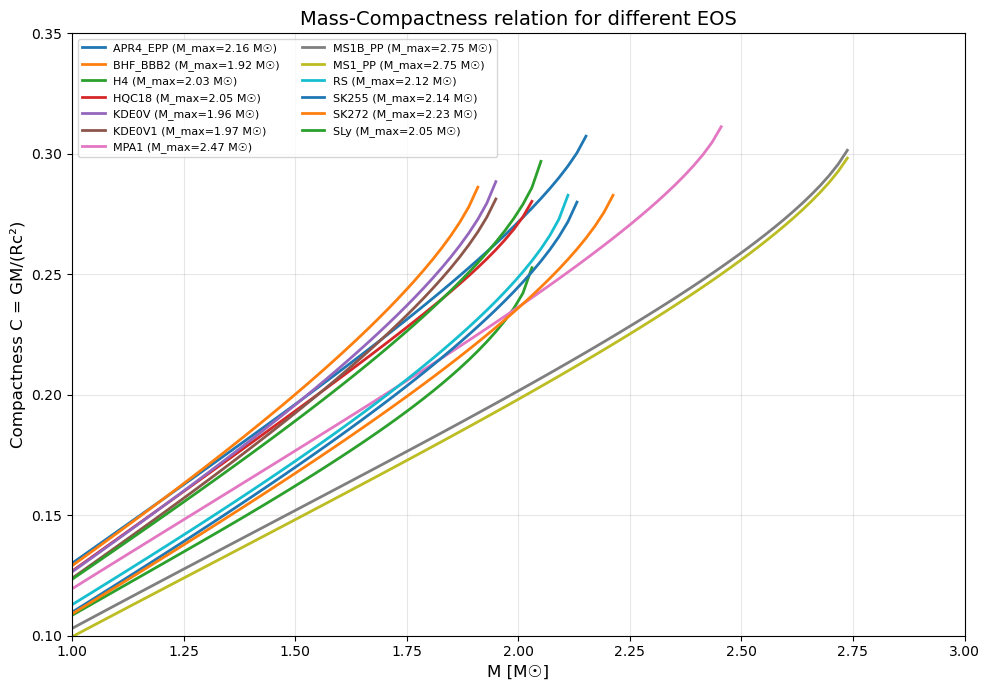

In [5]:
# Import the EOS  

# Define mass grid
M_ns_grid = np.linspace(1.0, 3.0, 100)  # Masses ranging from 1.0 to 3.0 M☉

# EOS names
eos_names = ['APR4_EPP', 'BHF_BBB2', 'H4', 'HQC18', 'KDE0V', 'KDE0V1', 
             'MPA1', 'MS1B_PP', 'MS1_PP', 'RS', 'SK255', 'SK272', 'SLy']

# Create figure
fig, ax = plt.subplots(figsize=(10, 7))

Compactness_dic = {}

# Calculate and plot compactness for each EOS
for eos_name in eos_names:
    try:
        C_ns, m2_b, max_mass = computeCompactness(M_ns_grid, eosname=eos_name)
        
        # Filter out values where mass exceeds maximum mass
        valid_mask = M_ns_grid <= max_mass

        # Dictionary to store results
        Compactness_dic[eos_name] = (M_ns_grid[valid_mask], C_ns[valid_mask], max_mass)
        
        ax.plot(M_ns_grid[valid_mask], C_ns[valid_mask], 
                label=f'{eos_name} (M_max={max_mass:.2f} M☉)', linewidth=2)
        
    except Exception as e:
        print(f"⚠ Erreur pour {eos_name}: {e}")

ax.set_xlabel('M [M☉]', fontsize=12)
ax.set_ylabel('Compactness C = GM/(Rc²)', fontsize=12)
ax.set_title('Mass-Compactness relation for different EOS', fontsize=14)
ax.legend(loc='best', fontsize=8, ncol=2)
ax.grid(True, alpha=0.3)
ax.set_xlim(1.0, 3.0)
ax.set_ylim(0.1, 0.35)

plt.tight_layout()
plt.show()

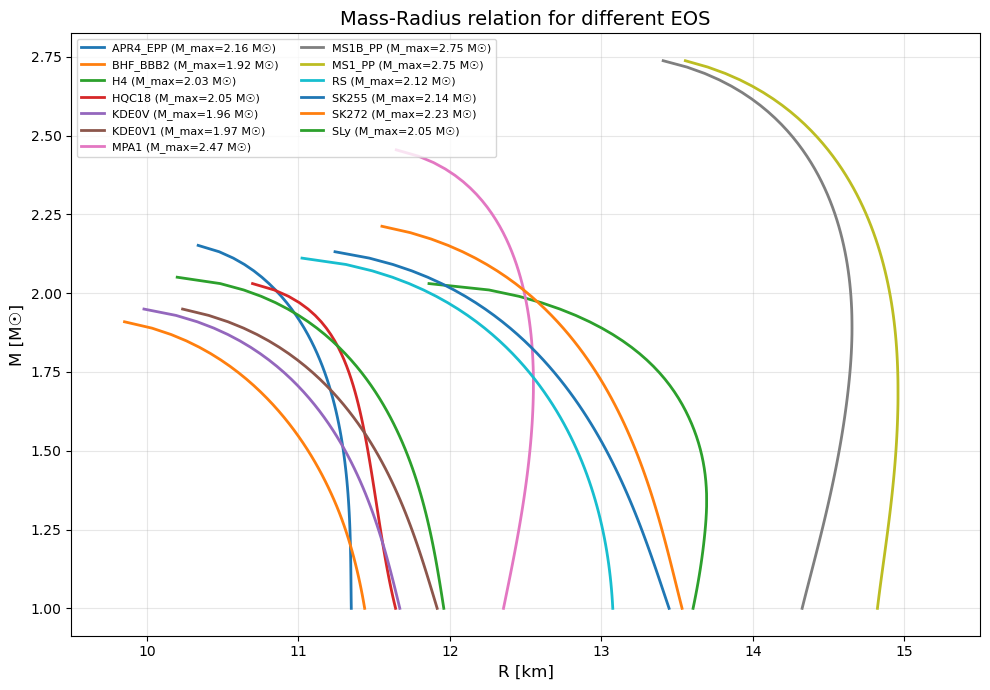

In [6]:
# Build the radius from the definition of compactness

fig, ax = plt.subplots(figsize=(10, 7))

for eos_name, (masses, compactness, max_mass) in Compactness_dic.items():
    # Compute radius in km
    radius_km = (c.G * masses * c.M_sun / (compactness * c.c**2)).to(u.km).value
    # Update the dictionary with the new column
    Compactness_dic[eos_name] = {
        'mass_solar': masses,
        'compactness': compactness,
        'radius_km': radius_km,
        'max_mass': max_mass
    }
    ax.plot(radius_km, masses, label=f'{eos_name} (M_max={max_mass:.2f} M☉)', linewidth=2)
ax.set_xlabel('R [km]', fontsize=12)
ax.set_ylabel('M [M☉]', fontsize=12)
ax.set_title('Mass-Radius relation for different EOS', fontsize=14)
ax.legend(loc='best', fontsize=8, ncol=2)
ax.grid(True, alpha=0.3)
ax.set_xlim(9.5, 15.5)

plt.tight_layout()
plt.show()

In [7]:
# Function to create mass pairs and compute ejecta masses for one EOS
import matplotlib.colors as colors
import matplotlib.pyplot as plt

def ejecta_plot(eos_name):
    d = Compactness_dic[eos_name]
    name = eos_name
    print(f"Processing EOS: {name}")
    
    # Create mass pairs
    Mr = d['mass_solar']
    Rr = d['radius_km']

    pair_mass = []
    for i, m1 in enumerate(Mr):
        for j, m2 in enumerate(Mr):
            if m1 > m2:
                pair_mass.append((m1,m2))
    pair_array = np.array(pair_mass)
    n_pairs = pair_array.shape[0]

    # Prepare arrays to store results
    fit_masses = np.zeros(n_pairs)
    wind_log = np.zeros(n_pairs)

    # Retrieve the radius for 1.6 M_solar NS
    target_mass = 1.6
    try:
        masses_eos = d['mass_solar']
        idx_eos = int(np.argmin(np.abs(masses_eos - target_mass)))
        mass_eos = masses_eos[idx_eos]
        radius16 = d['radius_km'][idx_eos]
    except Exception as e:
        print(f"  - {name}: erreur ->", e)

    # Compute ejecta masses for each pair
    for idx, (m1, m2) in enumerate(pair_array):
        idx1 = np.argmin(np.abs(Mr - m1))
        idx2 = np.argmin(np.abs(Mr - m2))
        R1 = Rr[idx1]
        R2 = Rr[idx2]
        fit_masses[idx] = dyn_ej(M1=m1, R1=R1, M2=m2, R2=R2)
        wind_log[idx] = wind_ej(m1, m2, Mtov=Mr.max(), R16=radius16)
    wind_linear = 0.3 * 10 ** (wind_log)
    total_mass = fit_masses +  wind_linear

    # Plotting

    # Convert to log scale for plotting and lightcurve calculation
    log_10wind = np.log10(0.3) + wind_log
    log_10dyn = np.zeros(n_pairs)
    for i, m in enumerate(fit_masses):
        if m > 0:
            log_10dyn[i] = np.log10(m)
        else:
            log_10dyn[i] = -5  
    log_10total = np.log10(total_mass)

    
    # Compute peak r-band magnitude using SVD model
    mags_r = np.zeros(n_pairs)
    for idx, param in enumerate(zip(log_10dyn, log_10wind)):
        params_svd = {
            "luminosity_distance": 40.0,         # Distance en Mpc
            "log10_mej_dyn": param[0],              # log10(Masse éjectée dynamique en M☉)
            "log10_mej_wind": param[1],              # log10(Masse éjectée par vent en M☉)
            "KNphi": 30.0,                       # Angle d'ouverture (degrés)
            "KNtheta": 30.0,                     # Angle de vue (degrés)
        }
        _, mag_svd = svd_model.generate_lightcurve(sample_times_svd, params_svd)
        mag_r = mag_svd['ztfr'].min()
        mags_r[idx] = mag_r

    fig, axes = plt.subplots(2, 2, figsize=(16, 16), sharey=True)

    # Top left: ejecta mass
    norm_ejecta = colors.LogNorm(vmin=total_mass.min(), vmax=total_mass.max())
    sc0 = axes[0,0].scatter(pair_array[:, 0], pair_array[:, 1], c=total_mass, cmap='inferno', s=300, edgecolors=None, linewidths=0.2, norm=norm_ejecta)
    axes[0,0].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=12)
    axes[0,0].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
    axes[0,0].set_title('Total mass')
    axes[0,0].grid(True, alpha=0.25)
    cbar0 = fig.colorbar(sc0, ax=axes[0,0], orientation='vertical', fraction=0.05)
    cbar0.set_label('$M_{total}$ [M$_\\odot$]')

    # text box for ejecta stats
    ejecta_stats = (f'Ejecta mass statistics:\n'
                f'  - min: {total_mass.min():.1%} M$_\\odot$\n'
                f'  - max: {total_mass.max():.1%} M$_\\odot$\n'
                f'  - mean: {total_mass.mean():.1%} M$_\\odot$')
    axes[0,0].text(0.03, 0.97, ejecta_stats, transform=axes[0,0].transAxes,
                fontsize=15, va='top', ha='left',
                bbox=dict(boxstyle='round,pad=0.4', facecolor='lightblue', alpha=0.85, edgecolor='0'))

    # Top right: peak r-band magnitude
    norm_mag = colors.Normalize(vmin=mags_r.min(), vmax=mags_r.max())
    sc1 = axes[0,1].scatter(pair_array[:, 0], pair_array[:, 1], c=mags_r, cmap='inferno_r', s=300, edgecolors=None, linewidths=0.2, norm=norm_mag)
    axes[0,1].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=12)
    axes[0,1].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
    axes[0,1].set_title('Peak r-band absolute magnitude')
    axes[0,1].grid(True, alpha=0.25)
    cbar1 = fig.colorbar(sc1, ax=axes[0,1], orientation='vertical', fraction=0.05)
    cbar1.set_label('$M_{r,peak}$ [mag] using Bu2019lm')

    # text box for mag
    mag_stats = (f'$r$-band magnitude statistics:\n'
                f'  - min: {mags_r.min():.2f}\n'
                f'  - max: {mags_r.max():.2f}\n'
                f'  - mean: {mags_r.mean():.2f}')
    axes[0,1].text(0.03, 0.97, mag_stats, transform=axes[0,1].transAxes,
                fontsize=15, va='top', ha='left',
                bbox=dict(boxstyle='round,pad=0.4', facecolor='lightblue', alpha=0.85, edgecolor='0'))

    # text box for model parameters
    model_params = (f'SVD Model: {model_name}\n'
                    f'Distance: 40 Mpc\n'
                    f'KNphi: 30°\n'
                    f'KNtheta: 30°')
    axes[0,1].text(0.03, 0.8, model_params, transform=axes[0,1].transAxes,
                fontsize=15, va='top', ha='left',
                bbox=dict(boxstyle='round,pad=0.4', facecolor='pink', alpha=0.85, edgecolor='0'))

    # Bottom left: dyn ejecta mass
    norm_dyn = colors.SymLogNorm(vmin=0, vmax=fit_masses.max(), linthresh=1e-4, linscale=0.5)
    sc2 = axes[1,0].scatter(pair_array[:, 0], pair_array[:, 1], c=fit_masses, cmap='inferno', s=300, edgecolors=None, linewidths=0.2, norm=norm_dyn)
    axes[1,0].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=12) 
    axes[1,0].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
    axes[1,0].set_title('Dynamical ejecta mass')
    axes[1,0].grid(True, alpha=0.25)
    cbar2 = fig.colorbar(sc2, ax=axes[1,0], orientation='vertical', fraction=0.05)
    cbar2.set_label('$M_{dyn}$ [M$_\\odot$]')

    # text box for dyn ejecta stats
    dyn_stats = (f'Dynamical ejecta mass statistics:\n'
                f'  - min: {fit_masses.min():.1%} M$_\\odot$\n'
                f'  - max: {fit_masses.max():.1%} M$_\\odot$\n'
                f'  - mean: {fit_masses.mean():.1%} M$_\\odot$')
    axes[1,0].text(0.03, 0.97, dyn_stats, transform=axes[1,0].transAxes,
                fontsize=15, va='top', ha='left',
                bbox=dict(boxstyle='round,pad=0.4', facecolor='lightblue', alpha=0.85, edgecolor='0'))

    # Bottom right: wind ejecta mass
    norm_wind = colors.LogNorm(vmin=10e-5, vmax=wind_linear.max())
    sc3 = axes[1,1].scatter(pair_array[:, 0], pair_array[:, 1], c=wind_linear, cmap='inferno', s=300, edgecolors=None, linewidths=0.2, norm=norm_wind)
    axes[1,1].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=12) 
    axes[1,1].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
    axes[1,1].set_title('Wind ejecta mass')
    axes[1,1].grid(True, alpha=0.25)
    cbar3 = fig.colorbar(sc3, ax=axes[1,1], orientation='vertical', fraction=0.05)
    cbar3.set_label('$M_{wind}$ [M$_\\odot$]')
    
    # text box for wind ejecta stats
    wind_stats = (f'Wind ejecta mass statistics:\n'
                f'  - min: {wind_linear.min():.2%} M$_\\odot$\n'
                f'  - max: {wind_linear.max():.1%} M$_\\odot$\n'
                f'  - mean: {wind_linear.mean():.1%} M$_\\odot$')
    axes[1,1].text(0.03, 0.97, wind_stats, transform=axes[1,1].transAxes,
                fontsize=15, va='top', ha='left',
                bbox=dict(boxstyle='round,pad=0.4', facecolor='lightblue', alpha=0.85, edgecolor='0'))

    plt.tight_layout()
    plt.show()

In [10]:
# V2 of the function 
import matplotlib.colors as colors
import matplotlib.pyplot as plt

def ejecta_plot_v2(eos_name, model_name='Bu2019lm', model_param={"luminosity_distance": 40.0, "KNphi": 30.0, "KNtheta": 30.0}, filters=['ztfr', 'ztfi', 'ztfg'], plot=True, title=None):
    '''Plot the ejecta properties for a given EOS model.
    Parameters
    ----------
    eos_name : str
        Name of the equation of state (EOS) to be used.
    title : str
        Title for the plots.
    model_name : str, optional
        Name of the SVD model to be used (default is 'Bu2019lm'). Attention: : the model must have parameters "log10_mej_dyn" and "log10_mej_wind".
    model_param : dict, optional
        Parameters for the SVD model (default is {"luminosity_distance": 40.0, "KNphi": 30.0, "KNtheta": 30.0}).
    filters : list, optional
        Filters to be used for the light curve.
    plot : bool, optional
        Whether to display the plots (default is True).
    Returns a dictionary with ejecta masses and magnitudes.
    -----------
    '''
    d = Compactness_dic[eos_name]
    name = eos_name
    print(f"Processing EOS: {name}")
    
    # Create mass pairs
    Mr = d['mass_solar']
    Rr = d['radius_km']

    pair_mass = []
    for i, m1 in enumerate(Mr):
        for j, m2 in enumerate(Mr):
            if m1 > m2:
                pair_mass.append((m1,m2))
    pair_array = np.array(pair_mass)
    n_pairs = pair_array.shape[0]

    # Prepare arrays to store results
    fit_masses = np.zeros(n_pairs)
    wind_log = np.zeros(n_pairs)

    # Retrieve the radius for 1.6 M_solar NS
    target_mass = 1.6
    try:
        masses_eos = d['mass_solar']
        idx_eos = int(np.argmin(np.abs(masses_eos - target_mass)))
        mass_eos = masses_eos[idx_eos]
        radius16 = d['radius_km'][idx_eos]
    except Exception as e:
        print(f"  - {name}: erreur ->", e)

    # Compute ejecta masses for each pair
    for idx, (m1, m2) in enumerate(pair_array):
        idx1 = np.argmin(np.abs(Mr - m1))
        idx2 = np.argmin(np.abs(Mr - m2))
        R1 = Rr[idx1]
        R2 = Rr[idx2]
        fit_masses[idx] = dyn_ej(M1=m1, R1=R1, M2=m2, R2=R2)
        wind_log[idx] = wind_ej(m1, m2, Mtov=Mr.max(), R16=radius16)
    wind_linear = 0.3 * 10 ** (wind_log)
    total_mass = fit_masses +  wind_linear

    # Setup SVD model
    svd_path = '/home/liteul/memoir_code/NMMA/svdmodels'
    tmin_svd, tmax_svd, dt_svd = 0.1, 10.0, 0.5
    sample_times_svd = np.arange(tmin_svd, tmax_svd + dt_svd, dt_svd)
    svd_model = SVDLightCurveModel(
        model=model_name,
        sample_times=sample_times_svd,
        svd_path=svd_path,
        mag_ncoeff=10,
        lbol_ncoeff=10,
        filters=filters
    )
    print(f"✓ SVD model '{model_name}' successfully loaded")
    print(f"  Filters: {filter}")
    print(f"  Times: {len(sample_times_svd)} points")

    # Plotting

    # Convert to log scale for plotting and lightcurve calculation
    log_10wind = np.log10(0.3) + wind_log
    log_10dyn = np.zeros(n_pairs)
    for i, m in enumerate(fit_masses):
        if m > 0:
            log_10dyn[i] = np.log10(m)
        else:
            log_10dyn[i] = -5  
    log_10total = np.log10(total_mass)

    
    # Compute magnitude using SVD model
    mags= np.zeros(n_pairs)
    for idx, param in enumerate(zip(log_10dyn, log_10wind)):
        model_param.update({
            "log10_mej_dyn": param[0],              # log10(Masse éjectée dynamique en M☉)
            "log10_mej_wind": param[1],              # log10(Masse éjectée par vent en M☉)
        })
        _, mag_svd = svd_model.generate_lightcurve(sample_times_svd, model_param)
        mag = np.min(mag_svd[filters[0]])
        mags[idx] = mag

    if plot:
        if title is None:
            title = f'Ejecta properties for EOS: {eos_name}'

        fig, axes = plt.subplots(2, 2, figsize=(16, 16), sharey=True)

        # Top left: ejecta mass
        norm_ejecta = colors.LogNorm(vmin=total_mass.min(), vmax=total_mass.max())
        sc0 = axes[0,0].scatter(pair_array[:, 0], pair_array[:, 1], c=total_mass, cmap='viridis', s=300, edgecolors=None, linewidths=0.2, norm=norm_ejecta)
        axes[0,0].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=12)
        axes[0,0].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
        axes[0,0].set_title('Total mass')
        axes[0,0].grid(True, alpha=0.25)
        cbar0 = fig.colorbar(sc0, ax=axes[0,0], orientation='vertical', fraction=0.05)
        cbar0.set_label('$M_{total}$ [M$_\\odot$]')

        # text box for ejecta stats
        ejecta_stats = (f'Ejecta mass statistics:\n'
                    f'  - min: {total_mass.min():.1%} M$_\\odot$\n'
                    f'  - max: {total_mass.max():.1%} M$_\\odot$\n'
                    f'  - mean: {total_mass.mean():.1%} M$_\\odot$')
        axes[0,0].text(0.03, 0.97, ejecta_stats, transform=axes[0,0].transAxes,
                    fontsize=15, va='top', ha='left',
                    bbox=dict(boxstyle='round,pad=0.4', facecolor='lightblue', alpha=0.85, edgecolor='0'))

        # Top right: peak magnitude
        norm_mag = colors.Normalize(vmin=mags.min(), vmax=mags.max())
        sc1 = axes[0,1].scatter(pair_array[:, 0], pair_array[:, 1], c=mags, cmap='viridis_r', s=300, edgecolors=None, linewidths=0.2, norm=norm_mag)
        axes[0,1].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=12)
        axes[0,1].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
        axes[0,1].set_title(f'Peak absolute magnitude (filter: {filters[0]})')
        axes[0,1].grid(True, alpha=0.25)
        cbar1 = fig.colorbar(sc1, ax=axes[0,1], orientation='vertical', fraction=0.05)
        cbar1.set_label(f'$M_{{peak}}$ [mag] using {model_name}')

        # text box for mag
        mag_stats = (f'Magnitude statistics:\n'
                    f'  - min: {mags.min():.2f}\n'
                    f'  - max: {mags.max():.2f}\n'
                    f'  - mean: {mags.mean():.2f}')
        axes[0,1].text(0.03, 0.97, mag_stats, transform=axes[0,1].transAxes,
                    fontsize=15, va='top', ha='left',
                    bbox=dict(boxstyle='round,pad=0.4', facecolor='lightblue', alpha=0.85, edgecolor='0'))

        # Bottom left: dyn ejecta mass
        norm_dyn = colors.SymLogNorm(vmin=0, vmax=fit_masses.max(), linthresh=1e-4, linscale=0.5)
        sc2 = axes[1,0].scatter(pair_array[:, 0], pair_array[:, 1], c=fit_masses, cmap='viridis', s=300, edgecolors=None, linewidths=0.2, norm=norm_dyn)
        axes[1,0].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=12) 
        axes[1,0].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
        axes[1,0].set_title('Dynamical ejecta mass')
        axes[1,0].grid(True, alpha=0.25)
        cbar2 = fig.colorbar(sc2, ax=axes[1,0], orientation='vertical', fraction=0.05)
        cbar2.set_label('$M_{dyn}$ [M$_\\odot$]')

        # text box for dyn ejecta stats
        dyn_stats = (f'Dynamical ejecta mass statistics:\n'
                    f'  - min: {fit_masses.min():.1%} M$_\\odot$\n'
                    f'  - max: {fit_masses.max():.1%} M$_\\odot$\n'
                    f'  - mean: {fit_masses.mean():.1%} M$_\\odot$')
        axes[1,0].text(0.03, 0.97, dyn_stats, transform=axes[1,0].transAxes,
                    fontsize=15, va='top', ha='left',
                    bbox=dict(boxstyle='round,pad=0.4', facecolor='lightblue', alpha=0.85, edgecolor='0'))

        # Bottom right: wind ejecta mass
        norm_wind = colors.LogNorm(vmin=10e-5, vmax=wind_linear.max())
        sc3 = axes[1,1].scatter(pair_array[:, 0], pair_array[:, 1], c=wind_linear, cmap='viridis', s=300, edgecolors=None, linewidths=0.2, norm=norm_wind)
        axes[1,1].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=12) 
        axes[1,1].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
        axes[1,1].set_title('Wind ejecta mass')
        axes[1,1].grid(True, alpha=0.25)
        cbar3 = fig.colorbar(sc3, ax=axes[1,1], orientation='vertical', fraction=0.05)
        cbar3.set_label('$M_{wind}$ [M$_\\odot$]')
        
        # text box for wind ejecta stats
        wind_stats = (f'Wind ejecta mass statistics:\n'
                    f'  - min: {wind_linear.min():.2%} M$_\\odot$\n'
                    f'  - max: {wind_linear.max():.1%} M$_\\odot$\n'
                    f'  - mean: {wind_linear.mean():.1%} M$_\\odot$')
        axes[1,1].text(0.03, 0.97, wind_stats, transform=axes[1,1].transAxes,
                    fontsize=15, va='top', ha='left',
                    bbox=dict(boxstyle='round,pad=0.4', facecolor='lightblue', alpha=0.85, edgecolor='0'))
        
        plt.suptitle(title, fontsize=16, y=1.0002)

        plt.tight_layout()
        plt.show()

    return {
        "model_param": model_param,
        "magnitude": mags,
        "fit_masses": fit_masses,
        "wind_linear": wind_linear,
        "pair_array": pair_array,
        "filter": filters
    }

Processing EOS: H4


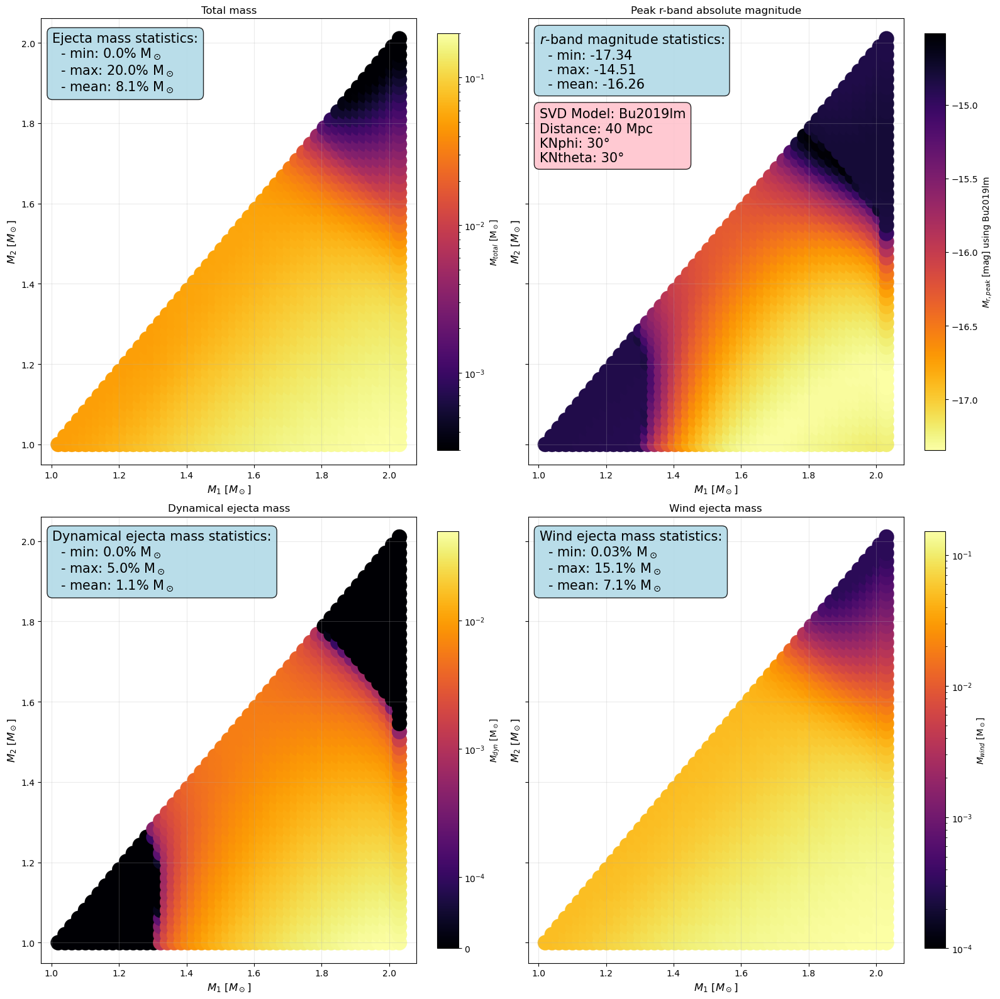

In [8]:
# Test the function with one EOS
%matplotlib inline
ejecta_plot('H4')

Summary of the nb so far,
- Loaded the different EOS from ``lal_simulations`` and reversed compactness to get the radius.
- Loaded a model from NMMA to compute the light-curve.
- Created a function to compute and visualise the ejecta mass and the peak r-mag.

To do:
- Add choice of filter and model inside the function.
- Compare different EOS (stiff vs soft).

***
### Stiff vs Soft EOS results


In [7]:
# Choice the EOS based on the max compactness 
soft_EOS = 'H4'
stiff_EOS = 'MPA1'
H4_max = Compactness_dic[soft_EOS]['compactness'].max()
MPA1_max = Compactness_dic[stiff_EOS]['compactness'].max()
print(f"Soft EOS: {soft_EOS}, Max Compactness: {H4_max :.2f}, Stiff EOS: {stiff_EOS}, Max Compactness: {MPA1_max :.2f}")

Soft EOS: H4, Max Compactness: 0.25, Stiff EOS: MPA1, Max Compactness: 0.31


Processing EOS: H4


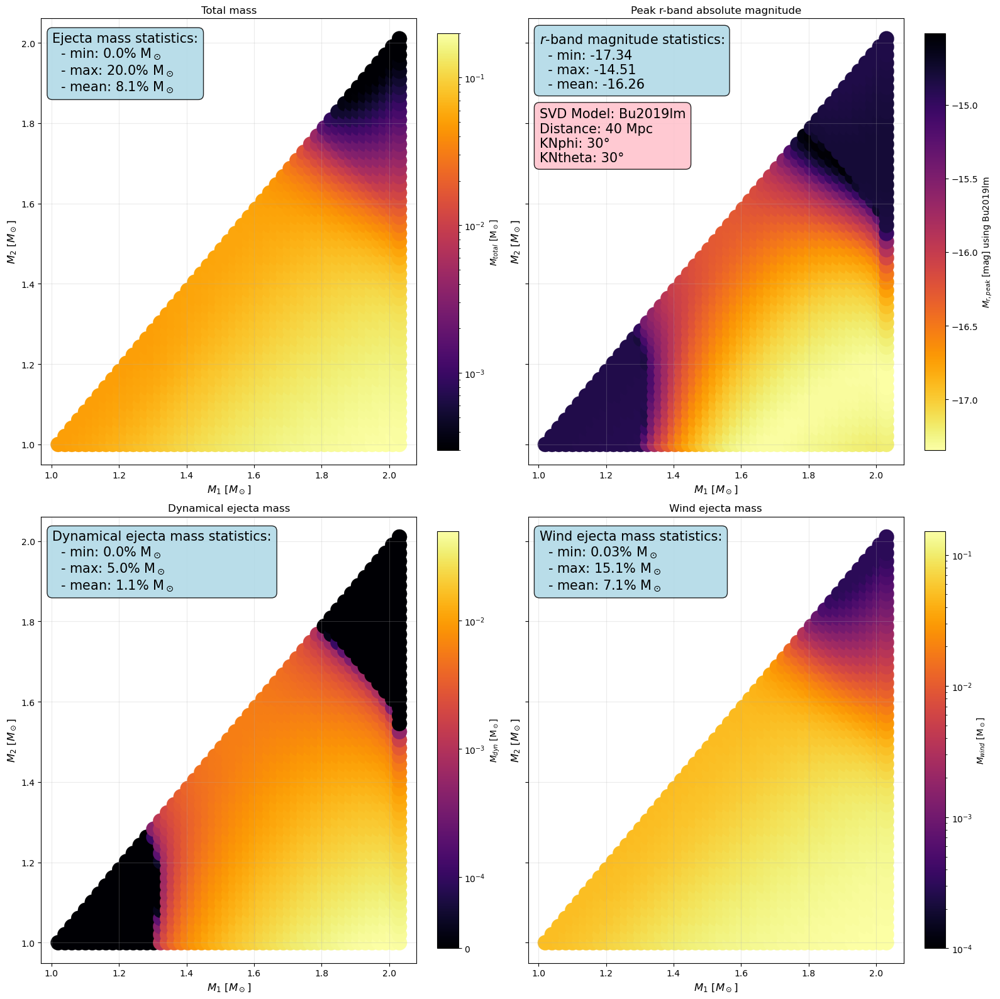

Processing EOS: MPA1


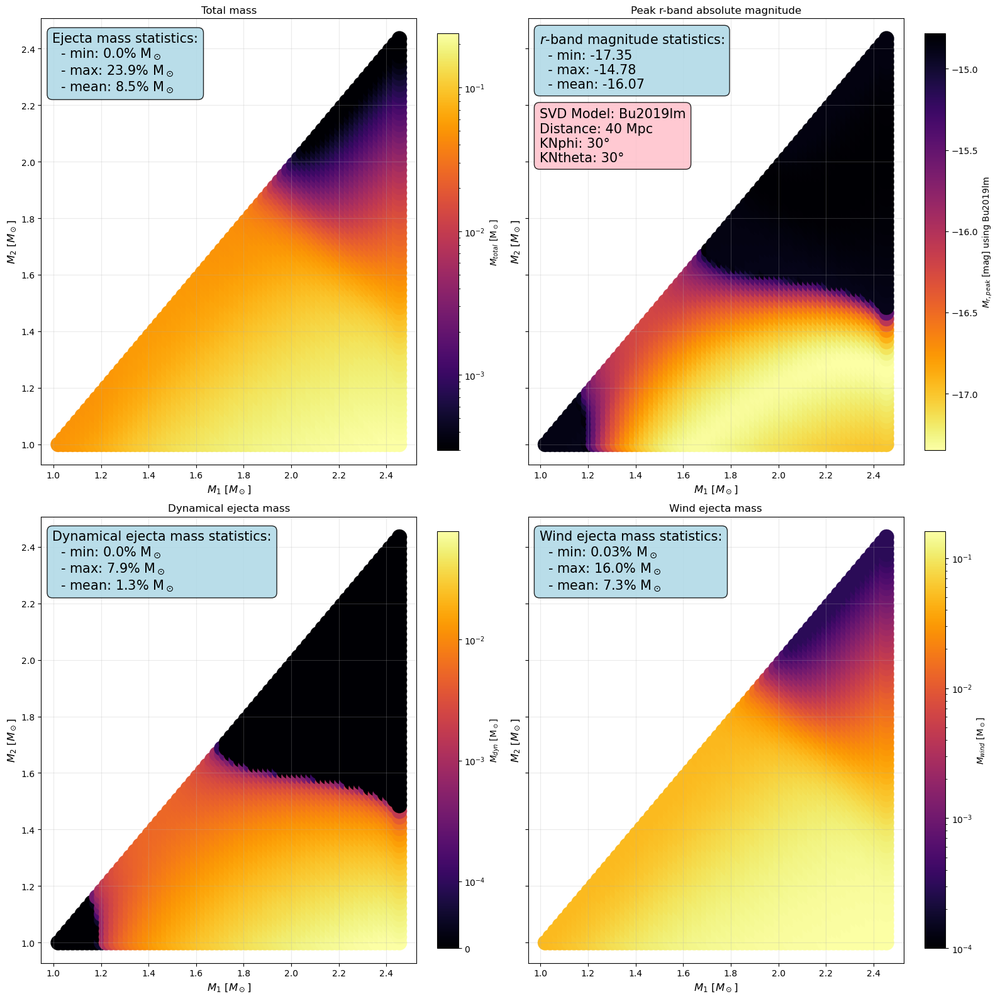

In [11]:
# Plot the results for the two EOS
ejecta_plot(soft_EOS)
ejecta_plot(stiff_EOS)

Processing EOS: H4
Loaded filter ztfg


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


✓ SVD model 'Bu2019lm' successfully loaded
  Filters: <class 'filter'>
  Times: 21 points
Processing EOS: H4
Loaded filter ztfr
✓ SVD model 'Bu2019lm' successfully loaded
  Filters: <class 'filter'>
  Times: 21 points


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


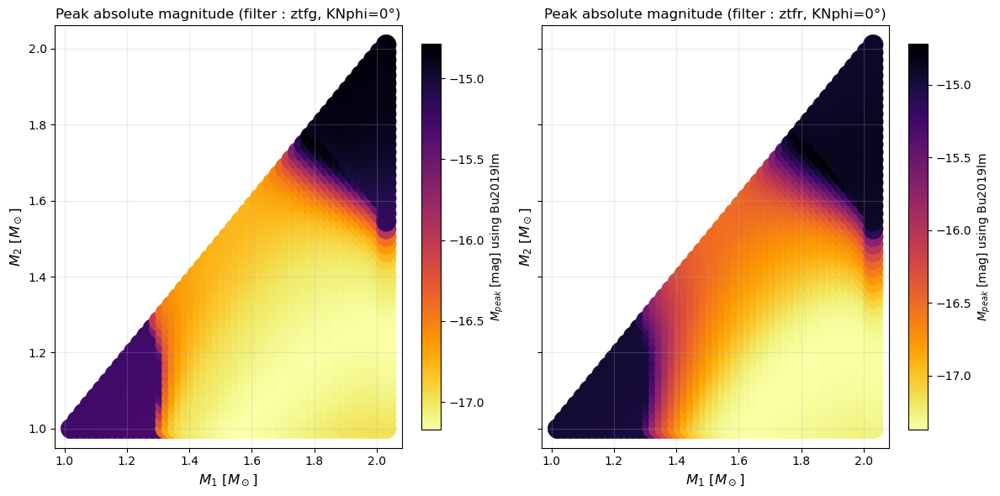

In [9]:
# test the V2 of the function 
green_0 = ejecta_plot_v2('H4', model_name='Bu2019lm', model_param={"luminosity_distance": 40.0, "KNphi": 0.0, "KNtheta": 30.0}, filters=['ztfg'], plot=0)
red_0 = ejecta_plot_v2('H4', filters=['ztfr'], title='Testing influence of KNphi or filter', model_param={"luminosity_distance": 40.0, "KNphi": 0.0, "KNtheta": 30.0}, plot=0)

fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(12, 6), sharey=True)

sc0 = ax[0].scatter(green_0['pair_array'][:, 0], green_0['pair_array'][:, 1], c=green_0['magnitude'], cmap='inferno_r', s=300, edgecolors=None, linewidths=0.2)
ax[0].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=12)
ax[0].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
ax[0].set_title(f'Peak absolute magnitude (filter : ztfg, KNphi=0°)')
ax[0].grid(True, alpha=0.25)
cbar0 = fig.colorbar(sc0, ax=ax[0], orientation='vertical', fraction=0.05)
cbar0.set_label(f'$M_{{peak}}$ [mag] using Bu2019lm')   
sc1 = ax[1].scatter(red_0['pair_array'][:, 0], red_0['pair_array'][:, 1], c=red_0['magnitude'], cmap='inferno_r', s=300, edgecolors=None, linewidths=0.2)
ax[1].set_xlabel('$M_1$ [$M_\\odot$]',  fontsize=12)
ax[1].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
ax[1].set_title(f'Peak absolute magnitude (filter : ztfr, KNphi=0°)')
ax[1].grid(True, alpha=0.25)
cbar1 = fig.colorbar(sc1, ax=ax[1], orientation='vertical', fraction=0.05)
cbar1.set_label(f'$M_{{peak}}$ [mag] using Bu2019lm')

plt.tight_layout()
plt.show()

Processing EOS: H4
Loaded filter ztfr
✓ SVD model 'Bu2019lm' successfully loaded
  Filters: <class 'filter'>
  Times: 21 points


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Processing EOS: H4
Loaded filter ztfr
✓ SVD model 'Bu2019lm' successfully loaded
  Filters: <class 'filter'>
  Times: 21 points


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


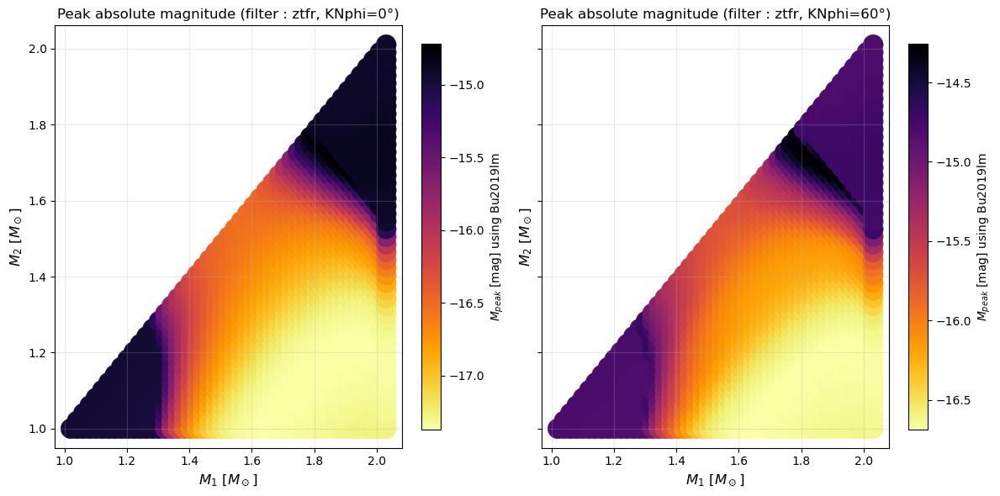

In [10]:
phi_0 = ejecta_plot_v2('H4', model_name='Bu2019lm', model_param={"luminosity_distance": 40.0, "KNphi": 0.0, "KNtheta": 30.0}, filters=['ztfr'], plot=0)
phi_60 = ejecta_plot_v2('H4', filters=['ztfr'], model_param={"luminosity_distance": 40.0, "KNphi": 60.0, "KNtheta": 30.0}, plot=0)

fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(12, 6), sharey=True)

sc0 = ax[0].scatter(phi_0['pair_array'][:, 0], phi_0['pair_array'][:, 1], c=phi_0['magnitude'], cmap='inferno_r', s=300, edgecolors=None, linewidths=0.2)
ax[0].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=12)
ax[0].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
ax[0].set_title(f'Peak absolute magnitude (filter : ztfr, KNphi=0°)')
ax[0].grid(True, alpha=0.25)
cbar0 = fig.colorbar(sc0, ax=ax[0], orientation='vertical', fraction=0.05)
cbar0.set_label(f'$M_{{peak}}$ [mag] using Bu2019lm')   
sc1 = ax[1].scatter(phi_60['pair_array'][:, 0], phi_60['pair_array'][:, 1], c=phi_60['magnitude'], cmap='inferno_r', s=300, edgecolors=None, linewidths=0.2)
ax[1].set_xlabel('$M_1$ [$M_\\odot$]',  fontsize=12)
ax[1].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
ax[1].set_title(f'Peak absolute magnitude (filter : ztfr, KNphi=60°)')
ax[1].grid(True, alpha=0.25)
cbar1 = fig.colorbar(sc1, ax=ax[1], orientation='vertical', fraction=0.05)
cbar1.set_label(f'$M_{{peak}}$ [mag] using Bu2019lm')

plt.tight_layout()
plt.show()

After this quick comparison when can see that (as expected) the choice of filter and the half-opening angle affect the magnitude a lot. 

This quick analysis should be done for each parameter of the model. 

Some strange features can also be spotted notably on the right plot just above. 

It could be useful to have a function to quickly diagnostic a mass pair.
***
## Interactive extraction of a mass pair

In [11]:
# Interactive plot to select points and get their parameters

def get_indices(dic):
    """Return the list of selected indices for a mag-mass plot.
    Parameters
    ----------
    dic : dict
        Dictionary containing 'pair_array' and 'magnitude' keys (returned by ejecta_plot_v2).
    ----------
    Returns
        selected_indices : list
            List of selected indices.
    """

    import matplotlib
    matplotlib.use('TkAgg')  # Use TkAgg backend as fallback
    %matplotlib widget 
    # Use widget backend for interactivity in Jupyter
    import matplotlib.pyplot as plt
    import matplotlib.colors as colors

    def onclick(event):
        """Function to handle click events on the plot."""
        if event.inaxes is None:
            return

        # Get click coordinates
        m1_click = event.xdata
        m2_click = event.ydata

        # Find the closest point in the scatter plot
        distances = np.sqrt((dic['pair_array'][:, 0] - m1_click)**2 + (dic['pair_array'][:, 1] - m2_click)**2)
        closest_idx = np.argmin(distances)
        
        # Add the index to the list if not already selected
        if closest_idx in selected_indices:
            print(f"Point {closest_idx} already selected.")
            return
        else:
            selected_indices.append(closest_idx)

        # Mark the selected point
        event.inaxes.scatter(dic['pair_array'][closest_idx, 0], dic['pair_array'][closest_idx, 1], 
                            c='cyan', s=400, marker='*', linewidths=2,
                            zorder=10)
        event.inaxes.text(dic['pair_array'][closest_idx, 0], dic['pair_array'][closest_idx, 1], 
                        f'  {len(selected_indices)}', fontsize=12, fontweight='bold',
                        color='cyan', zorder=11)
        plt.draw()
        

    selected_indices = []

    # Create interactive plot
    fig, ax = plt.subplots(figsize=(12, 10))

    norm_mag = colors.Normalize(vmin=dic['magnitude'].min(), vmax=dic['magnitude'].max())
    sc = ax.scatter(dic['pair_array'][:, 0], dic['pair_array'][:, 1], c=dic['magnitude'], cmap='inferno_r', 
                    s=300, edgecolors=None, linewidths=0.2, norm=norm_mag)
    ax.set_xlabel('$M_1$ [$M_\\odot$]', fontsize=14)
    ax.set_ylabel('$M_2$ [$M_\\odot$]', fontsize=14)
    ax.set_title('Peak magnitude - Click to select points', fontsize=16)
    ax.grid(True, alpha=0.25)

    cbar = fig.colorbar(sc, ax=ax, orientation='vertical', fraction=0.05)
    cbar.set_label('$M_{{peak}}$ [mag]', fontsize=12)

    # Connect the click event to the handler
    cid = fig.canvas.mpl_connect('button_press_event', onclick)

    plt.tight_layout()
    plt.show()

    %matplotlib inline  
    # Switch back to inline backend

    return selected_indices


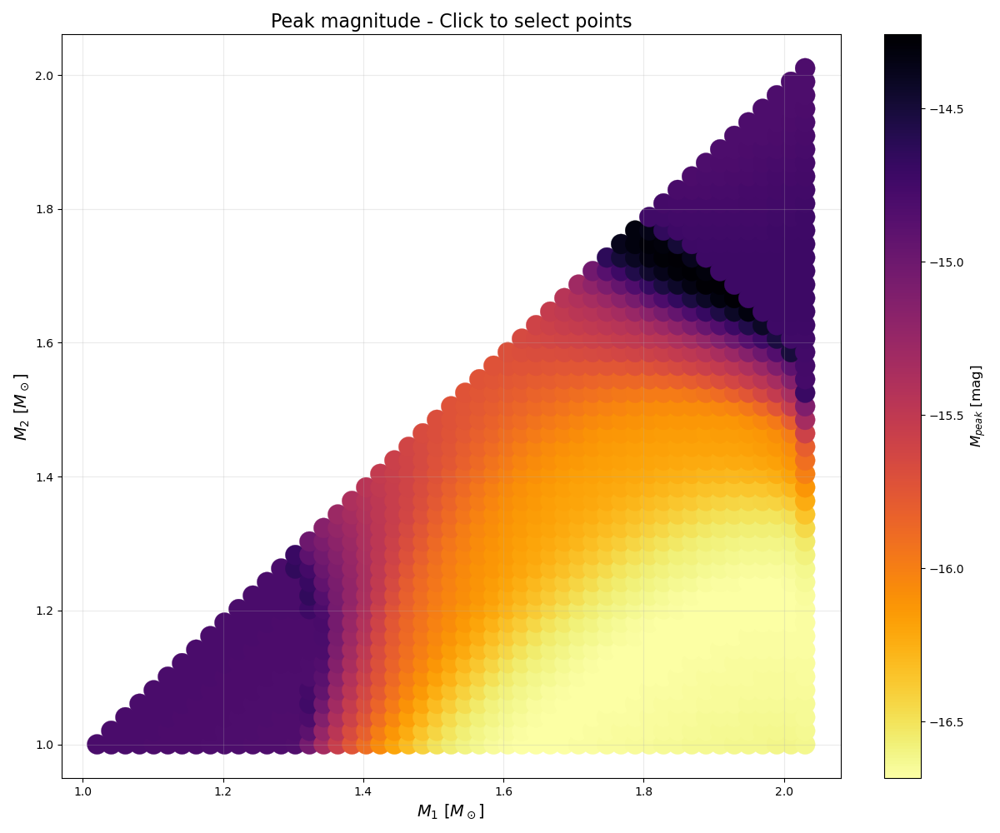

In [35]:
# test the function to get indices
selected_indices = get_indices(dic=phi_60)

In [36]:
# Test plotting the lightcurves for the selected points

def plot_lc_for_indices(selected_indices, dic, model_name='Bu2019lm'):
    """Plot the lightcurves for the selected indices and print their parameters.
    Parameters
    ----------
    selected_indices : list
        List of selected indices.
    dic : dict
        Dictionary containing 'pair_array', 'magnitude', 'fit_masses', 'wind_linear', and 'model_param' keys (returned by ejecta_plot_v2).
    model_name : str, optional
        Name of the SVD model to be used (default is 'Bu2019lm') Ideally the same model used in ejecta_plot_v2.
    ----------
    """
    %matplotlib inline
    import matplotlib.pyplot as plt
    import matplotlib.colors as colors

    for idx in selected_indices:
        print(f"Selected point (index {idx}):")
        print(f"  M1: {dic['pair_array'][idx, 0]:.3f} M☉")
        print(f"  M2: {dic['pair_array'][idx, 1]:.3f} M☉")
        print(f"  Magnitude: {dic['magnitude'][idx]:.2f}")
        print(f"  M_dyn: {dic['fit_masses'][idx]:.4f} M☉")
        print(f"  M_wind: {dic['wind_linear'][idx]:.4f} M☉")

        print()

    # Setup SVD model
    svd_path = '/home/liteul/memoir_code/NMMA/svdmodels'
    tmin_svd, tmax_svd, dt_svd = 0.1, 10.0, 0.5
    sample_times_svd = np.arange(tmin_svd, tmax_svd + dt_svd, dt_svd)
    svd_model = SVDLightCurveModel(
        model=model_name,
        sample_times=sample_times_svd,
        svd_path=svd_path,
        mag_ncoeff=10,
        lbol_ncoeff=10,
        filters=['ztfr', 'ztfi', 'ztfg']
        )

    # Extract data from dictionary
    log_10dyn = np.zeros(len(dic['fit_masses']))
    for i, m in enumerate(dic['fit_masses']):
        if m > 0:
            log_10dyn[i] = np.log10(m)
        else:
            log_10dyn[i] = -5  
    log_10wind = np.log10(0.3) + np.log10(dic['wind_linear'])
    pair_array = dic['pair_array']
    mags = dic['magnitude']
    n_points = len(selected_indices)
    model_param = dic['model_param']
    filter = dic['filter']

    # Plot lc in g r i bands
    # 2 col per point: lc + position on the grid

    fig, axes = plt.subplots(n_points, 2, figsize=(12, 6*n_points))
    # Ensure axes is always 2D
    if n_points == 1:
        axes = axes.reshape(1, -1)

    for i, idx in enumerate(selected_indices):

        model_param.update({
            "log10_mej_dyn": log_10dyn[idx],              # log10(Masse éjectée dynamique en M☉)
            "log10_mej_wind": log_10wind[idx],              # log10(Masse éjectée par vent en M☉)
            })
        _, mag_svd = svd_model.generate_lightcurve(sample_times_svd, model_param)
            
        axes[i,0].plot(sample_times_svd, mag_svd['ztfr'], marker='o', label='ztfr (r)', color='#fa3970')
        #axes[i,0].plot(sample_times_svd, mag_svd['ztfi'], marker='o', label='ztfi (i)', color='darkred')
        #axes[i,0].plot(sample_times_svd, mag_svd['ztfg'], marker='o', label='ztfg (g)', color='green')
        axes[i,0].invert_yaxis()
        axes[i,0].set_xlabel('Time [days]', fontsize=10)
        axes[i,0].set_ylabel('Absolute Magnitude', fontsize=10)
        axes[i,0].set_title(f'Point {i+1}: M1={pair_array[idx, 0]:.2f}, M2={pair_array[idx, 1]:.2f} M☉', fontsize=11)
        axes[i,0].legend(fontsize=8)
        axes[i,0].grid(True, alpha=0.3)

        # Show position on the grid
        norm_mag = colors.Normalize(vmin=mags.min(), vmax=mags.max())
        sc = axes[i,1].scatter(pair_array[:, 0], pair_array[:, 1], c=mags, cmap='inferno_r', 
                            s=100, edgecolors=None, linewidths=0.2, norm=norm_mag)
        cbar = fig.colorbar(sc, ax=axes[i,1], orientation='vertical', fraction=0.05)
        cbar.set_label('peak $M_{AB}$', fontsize=10)
        axes[i,1].scatter(pair_array[idx, 0], pair_array[idx, 1], 
                        c='cyan', s=200, marker='*', linewidths=2,
                        zorder=10)
        axes[i,1].text(pair_array[idx, 0], pair_array[idx, 1], f'  {i+1}', fontsize=12, fontweight='bold', color='cyan')
        axes[i,1].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=10)
        axes[i,1].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=10)
        axes[i,1].set_title(f'Position on the grid (Peak Magnitude in {filter} band)', fontsize=11)
        axes[i,1].grid(True, alpha=0.25)
    plt.show()

Selected point (index 777):
  M1: 1.788 M☉
  M2: 1.727 M☉
  Magnitude: -14.40
  M_dyn: 0.0020 M☉
  M_wind: 0.0081 M☉

Selected point (index 896):
  M1: 1.848 M☉
  M2: 1.707 M☉
  Magnitude: -14.29
  M_dyn: 0.0013 M☉
  M_wind: 0.0066 M☉

Selected point (index 856):
  M1: 1.828 M☉
  M2: 1.727 M☉
  Magnitude: -14.28
  M_dyn: 0.0012 M☉
  M_wind: 0.0053 M☉

Selected point (index 1024):
  M1: 1.909 M☉
  M2: 1.687 M☉
  Magnitude: -14.27
  M_dyn: 0.0005 M☉
  M_wind: 0.0064 M☉

Selected point (index 937):
  M1: 1.869 M☉
  M2: 1.687 M☉
  Magnitude: -14.34
  M_dyn: 0.0015 M☉
  M_wind: 0.0083 M☉

Selected point (index 779):
  M1: 1.788 M☉
  M2: 1.768 M☉
  Magnitude: -14.32
  M_dyn: 0.0010 M☉
  M_wind: 0.0034 M☉

Loaded filter ztfr


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Loaded filter ztfi
Loaded filter ztfg


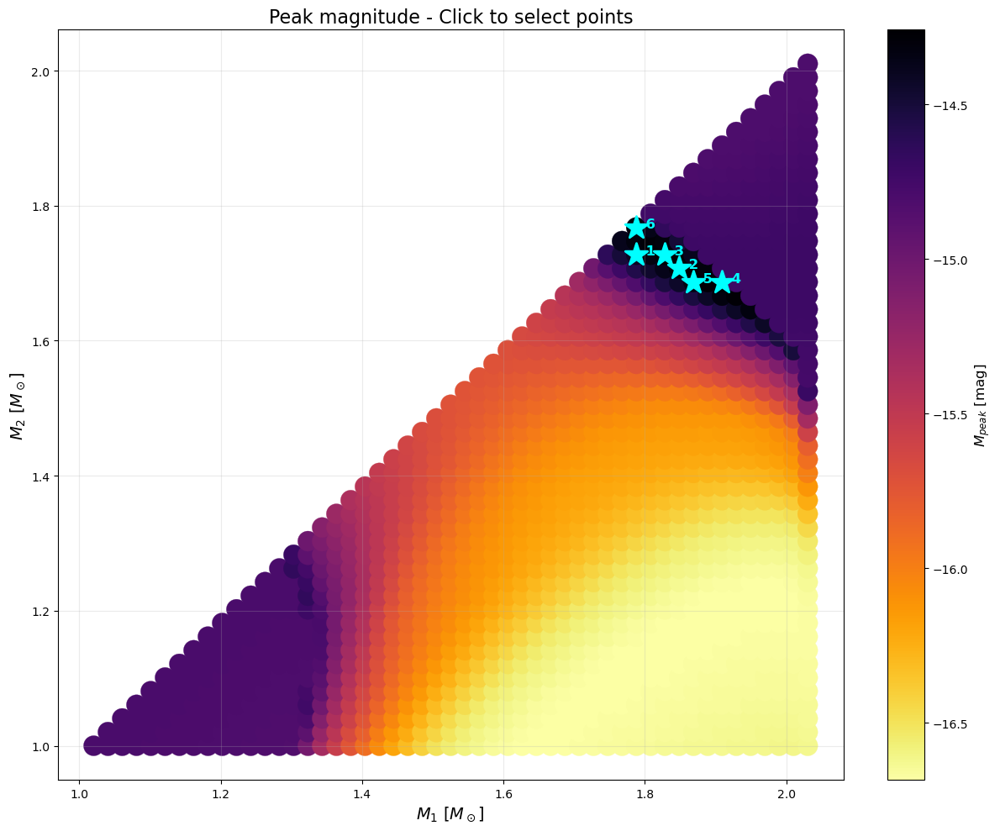

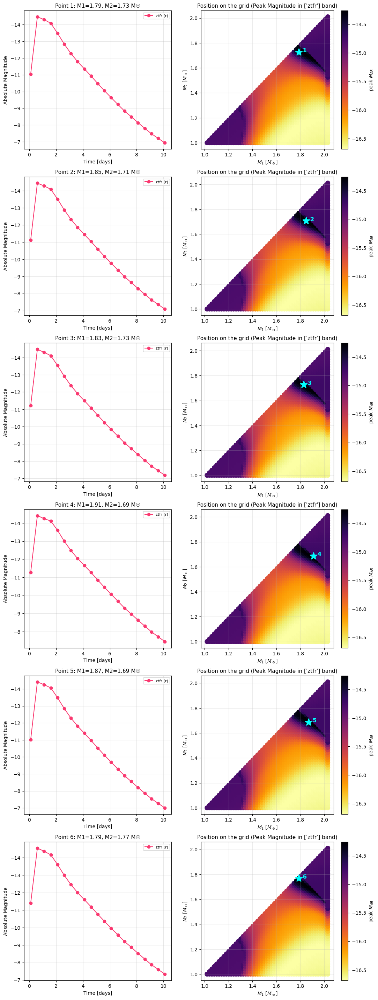

In [37]:
# Test of the plot_lc_for_indices function
%matplotlib inline
plot_lc_for_indices(selected_indices, dic=phi_60, model_name='Bu2019lm')

This diagnostic tool is easy to use and this short test already shows that the darker, anormal region in the plot in r band as a lightcurve showing a strange dip, not seen in any other case (for the red band). This oddness could be attributed to intra-model variability.
***
## Exploring Bulla original dataset

In [4]:
class BullaDataset:
    """
    Class to load and manage the Bulla 2019 dataset files.
    """
    
    def __init__(self, folder_path):
        """
        Initialize the BullaDataset.
        
        Parameters:
        -----------
        folder_path : str
            Path to the folder containing the Bulla 2019 files
        """
        self.folder_path = folder_path
        self.files = []
        self.params_list = []
        self.data_dict = {}
        
        # Load all files 
        self._load_all_files()
        
        # Compute parameter ranges
        self._compute_param_ranges()
    
    def _load_all_files(self):
        """Load all .dat files from the folder."""
        import glob
        import os
        
        all_files = sorted([f for f in glob.glob(os.path.join(self.folder_path, '*.dat')) 
                           if not f.endswith('Zone.Identifier')])
        
        print(f"Loading {len(all_files)} Bulla 2019 files...")
        
        for filepath in all_files:
            filename = os.path.basename(filepath)
            params = self.Bulla_get_param(filename)

            # Create a unique key based on the parameters
            key = self._params_to_key(params)
            
            self.files.append(filepath)
            self.params_list.append(params)
            self.data_dict[key] = {
                'filepath': filepath,
                'filename': filename,
                'params': params,
                'data': None,  # Loaded on demand
                'filters': None    # Loaded on demand
            }

        print(f"✓ {len(self.data_dict)} files indexed")

    def Bulla_get_param(self, filename):
        '''
        Extract parameters from Bulla 2019 filename.
        '''

        # Get rid of the .dat extension
        name_without_ext = filename.replace('.dat', '')

        # cut the file by '_'
        parts = name_without_ext.split('_')

        params = {}
        for part in parts:
            if 'nph' in part:
                params['nph'] = part.replace('nph', '')
            elif 'mejdyn' in part:
                params['mejdyn'] = float(part.replace('mejdyn', ''))
            elif 'mejwind' in part:
                params['mejwind'] = float(part.replace('mejwind', ''))
            elif 'phi' in part:
                params['phi'] = float(part.replace('phi', ''))
            elif 'theta' in part:
                params['theta'] = float(part.replace('theta', ''))
            elif 'dMpc' in part:
                params['dMpc'] = float(part.replace('dMpc', ''))

        return params

    def _params_to_key(self, params):
        """Convert a parameter dictionary to a unique key."""
        return (
            params.get('mejdyn', 0),
            params.get('mejwind', 0),
            params.get('phi', 0),
            params.get('theta', 0),
            params.get('dMpc', 0)
        )
    
    def _compute_param_ranges(self):
        """Compute the ranges and unique values for each parameter."""
        import numpy as np
        
        self.param_ranges = {}

        # Collect all values for each parameter
        param_values = {
            'mejdyn': [],
            'mejwind': [],
            'phi': [],
            'theta': [],
            'dMpc': []
        }
        
        for params in self.params_list:
            for key in param_values.keys():
                if key in params:
                    param_values[key].append(params[key])
        
        # Compute statistics
        for param_name, values in param_values.items():
            unique_vals = sorted(set(values))
            self.param_ranges[param_name] = {
                'min': min(values) if values else None,
                'max': max(values) if values else None,
                'unique': unique_vals,
                'n_unique': len(unique_vals),
                'count': len(values)
            }

    def _extract_filters(self, filepath):
        """Extract filter names from file header."""
        try:
            with open(filepath, 'r') as f:
                first_line = f.readline().strip()
                if first_line.startswith('#'):
                    # Parse header: # time filter1 filter2 ...
                    return first_line.split()[2:] # Skip '#' and 'time'
                else:
                    # No header, count columns from data
                    data = np.loadtxt(filepath, max_rows=1)
                    return ['time'] + [f'filter_{i}' for i in range(1, len(data))]
        except Exception as e:
            print(f"Warning: Could not extract filters from {filepath}: {e}")
            return None
    
    def get_file(self, mejdyn=None, mejwind=None, phi=None, theta=None, dMpc=None, load_data=True):
        """
        Retrieve a file based on its parameters.
        
        Parameters:
        -----------
        mejdyn, mejwind, phi, theta, dMpc : float
            Parameters of the requested file
        load_data : bool
            If True, load the data from the file

        Returns:
        --------
        dict : Information about the file (filepath, params, data)
        """
        key = (mejdyn or 0, mejwind or 0, phi or 0, theta or 0, dMpc or 0)
        
        if key not in self.data_dict:
            print(f"⚠ No file found for these parameters:")
            print(f"  mejdyn={mejdyn}, mejwind={mejwind}, phi={phi}, theta={theta}, dMpc={dMpc}")
            return None
        
        file_info = self.data_dict[key]
        
        # Load the data if requested and not yet loaded
        if load_data and file_info['data'] is None:
            file_info['data'] = np.loadtxt(file_info['filepath'])
            file_info['filters'] = self._extract_filters(file_info['filepath'])
        
        return file_info
    
    def find_files(self, mejdyn=None, mejwind=None, phi=None, theta=None, dMpc=None):
        """
        Find all files matching the criteria (None = all).
        
        Returns:
        --------
        list : List of matching files
        """
        results = []
        
        for key, file_info in self.data_dict.items():
            params = file_info['params']
            
            # Check each criterion
            if mejdyn is not None and params.get('mejdyn') != mejdyn:
                continue
            if mejwind is not None and params.get('mejwind') != mejwind:
                continue
            if phi is not None and params.get('phi') != phi:
                continue
            if theta is not None and params.get('theta') != theta:
                continue
            if dMpc is not None and params.get('dMpc') != dMpc:
                continue
            
            results.append(file_info)
        
        return results
    
    def print_param_ranges(self):
        """Display the ranges of all parameters."""
        print("\n" + "="*80)
        print("RANGES OF PARAMETERS IN THE BULLA 2019 DATASET")
        print("="*80)
        
        for param_name, stats in self.param_ranges.items():
            print(f"\n{param_name.upper()}:")
            print(f"  • Range: [{stats['min']:.3f}, {stats['max']:.3f}]")
            print(f"  • Number of unique values: {stats['n_unique']}")
            print(f"  • Values: {stats['unique']}")
        
        print("\n" + "="*80)
        print(f"TOTAL: {len(self.data_dict)} files in the dataset")
        print("="*80)
    
    def get_param_grid(self):
        """
        Return a grid of all unique parameters.
        
        Returns:
        --------
        dict : Dictionary with unique values of each parameter
        """
        return {
            param: stats['unique'] 
            for param, stats in self.param_ranges.items()
        }
    
    def __len__(self):
        """Number of files in the dataset."""
        return len(self.data_dict)
    
    def __repr__(self):
        return f"BullaDataset({len(self)} files)"

In [5]:
# Initialize the dataset
bulla_dataset = BullaDataset('/home/liteul/memoir_code/lcs_bulla_2019_bns')

# Display the parameter ranges
bulla_dataset.print_param_ranges()

Loading 1596 Bulla 2019 files...
✓ 1596 files indexed

RANGES OF PARAMETERS IN THE BULLA 2019 DATASET

MEJDYN:
  • Range: [0.001, 0.020]
  • Number of unique values: 4
  • Values: [0.001, 0.005, 0.01, 0.02]

MEJWIND:
  • Range: [0.010, 0.130]
  • Number of unique values: 7
  • Values: [0.01, 0.03, 0.05, 0.07, 0.09, 0.11, 0.13]

PHI:
  • Range: [0.000, 90.000]
  • Number of unique values: 7
  • Values: [0.0, 15.0, 30.0, 45.0, 60.0, 75.0, 90.0]

THETA:
  • Range: [0.000, 90.000]
  • Number of unique values: 11
  • Values: [0.0, 25.84, 36.87, 45.57, 53.13, 60.0, 66.42, 72.54, 78.46, 84.26, 90.0]

DMPC:
  • Range: [0.000, 0.000]
  • Number of unique values: 1
  • Values: [0.0]

TOTAL: 1596 files in the dataset


The dataset has a sparse range of parameters values. While for the distance it does not matter as the model based on the data set gives out the absolute magnitude. For the other parameters, especially the ejecta components it means the model relies a lot on inter/extrapolation. Coupled to the small size of the dataset (just a little over 1k) this could produce some 'artifacts' in the model-generated lightcurves.

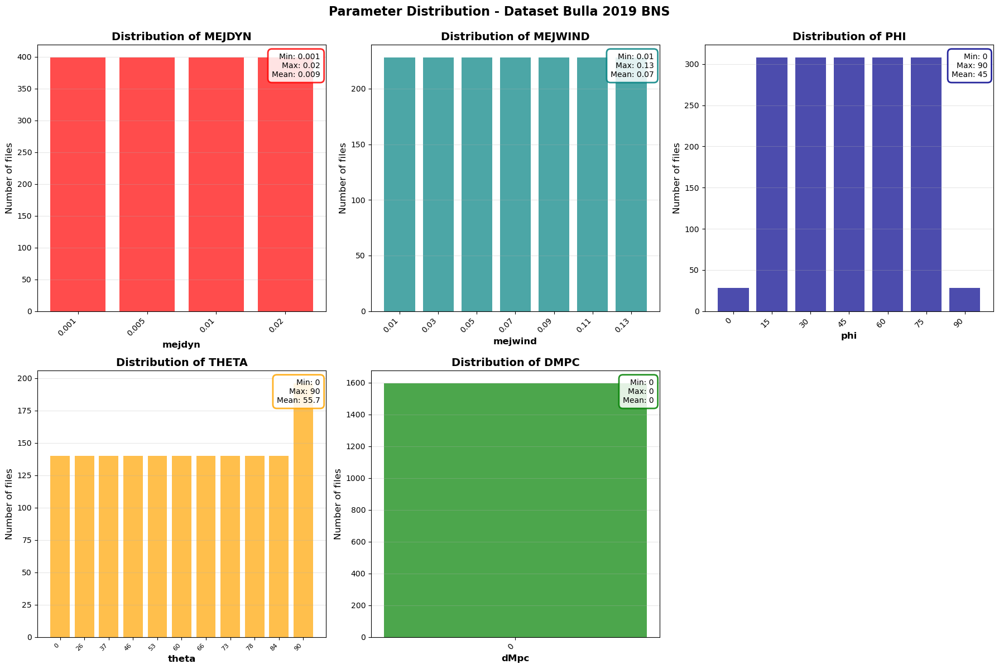

In [20]:
# Plot the distribution of a parameter

import matplotlib.pyplot as plt
import numpy as np

# Get the parameter grid
param_grid = bulla_dataset.get_param_grid()

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

param_names = ['mejdyn', 'mejwind', 'phi', 'theta', 'dMpc']
colors_plot = ['red', 'teal', 'darkblue', 'orange', 'green']

for idx, (param_name, color) in enumerate(zip(param_names, colors_plot)):
    values = param_grid[param_name]
    counts = [len(bulla_dataset.find_files(**{param_name: v})) for v in values]
    
    axes[idx].bar(range(len(values)), counts, color=color, alpha=0.7, linewidth=1.5)
    axes[idx].set_xlabel(f'{param_name}', fontsize=12, fontweight='bold')
    axes[idx].set_ylabel('Number of files', fontsize=12)
    axes[idx].set_title(f'Distribution of {param_name.upper()}', fontsize=14, fontweight='bold')
    axes[idx].grid(True, alpha=0.3, axis='y')
    
    # Add value labels on x-axis
    axes[idx].set_xticks(range(len(values)))
    if len(values) > 10:
        axes[idx].set_xticklabels([f'{v:.2g}' for v in values], rotation=45, ha='right', fontsize=8)
    else:
        axes[idx].set_xticklabels([f'{v:.3g}' for v in values], rotation=45, ha='right')
    
    # Add statistics box
    stats = bulla_dataset.param_ranges[param_name]
    info_text = f"Min: {stats['min']:.3g}\nMax: {stats['max']:.3g}\nMean: {np.mean(values):.3g}"
    axes[idx].text(0.98, 0.97, info_text, transform=axes[idx].transAxes,
                   fontsize=10, va='top', ha='right',
                   bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.85, edgecolor=color, linewidth=2))

# Mask last unused subplot
axes[-1].axis('off')

plt.suptitle('Parameter Distribution - Dataset Bulla 2019 BNS', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

While most of the parameters are uniformaly distributed, the angles are not. The distribution of $\theta$ is particularly strange, probably leading to a bias towards larger value (close to 90°) while for $\phi$, the distribution disfavors extreme value which is odd.

File found:
  Name: nph1.0e+06_mejdyn0.010_mejwind0.030_phi45_theta45.57_dMpc0.dat
  Path: /home/liteul/memoir_code/lcs_bulla_2019_bns/nph1.0e+06_mejdyn0.010_mejwind0.030_phi45_theta45.57_dMpc0.dat
  Parameters: {'nph': '1.0e+06', 'mejdyn': 0.01, 'mejwind': 0.03, 'phi': 45.0, 'theta': 45.57, 'dMpc': 0.0}
  Data loaded: (100, 27)
  Available filters: ['bessellux', 'bessellb', 'bessellv', 'bessellr', 'besselli', 'sdssu', 'ps1::g', 'ps1::r', 'ps1::i', 'ps1::z', 'ps1::y', 'uvot::b', 'uvot::u', 'uvot::uvm2', 'uvot::uvw1', 'uvot::uvw2', 'uvot::v', 'uvot::white', 'atlasc', 'atlaso', '2massj', '2massh', '2massks', 'ztfg', 'ztfr', 'ztfi']


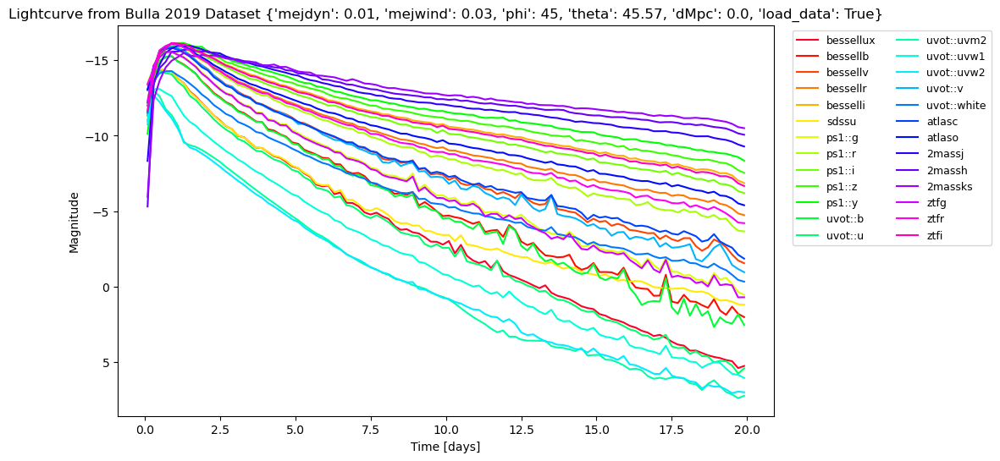

In [21]:


# Utilisation example: retrieve a specific file

parameters = {
    'mejdyn': 0.01,
    'mejwind': 0.03,
    'phi': 45,
    'theta': 45.57,
    'dMpc': 0.0,
    'load_data': True
}

file_info = bulla_dataset.get_file(**parameters)


if file_info:
    print(f"File found:")
    print(f"  Name: {file_info['filename']}")
    print(f"  Path: {file_info['filepath']}")
    print(f"  Parameters: {file_info['params']}")
    print(f"  Data loaded: {file_info['data'].shape if file_info['data'] is not None else 'No'}")
    print(f"  Available filters: {file_info['filters']}")

    # Example plot of the lightcurve data
    n_filters = len(file_info['filters']) 
    colors = plt.cm.gist_rainbow(np.linspace(0, 1, n_filters))  
    data = file_info['data']
    fig, ax = plt.subplots(figsize=(10, 6))
    times = data[:, 0]  # Assuming first column is time
    for i, filter_name in enumerate(file_info['filters']):  
        ax.plot(times, data[:, i+1], label=filter_name, color=colors[i]) # data[:, i+1] for filter columns, would have time in column 0 otherwise
    ax.set_xlabel('Time [days]')
    ax.set_ylabel('Magnitude')
    ax.set_title(f'Lightcurve from Bulla 2019 Dataset {parameters}')
    ax.invert_yaxis()
    ax.legend(ncol=2, fontsize=9, bbox_to_anchor=(1.02, 1), loc='upper left')
    plt.show()

In [22]:
# Other example : find all files with specific mejdyn and mejwind
matching_files = bulla_dataset.find_files(mejdyn=0.01, mejwind=0.03)
print(f"\nFound {len(matching_files)} files with mejdyn=0.01 and mejwind=0.03:")
for file_info in matching_files:
    print(f"  - {file_info['filename']} with params {file_info['params']}")



Found 57 files with mejdyn=0.01 and mejwind=0.03:
  - nph1.0e+06_mejdyn0.010_mejwind0.030_phi0_theta90.00_dMpc0.dat with params {'nph': '1.0e+06', 'mejdyn': 0.01, 'mejwind': 0.03, 'phi': 0.0, 'theta': 90.0, 'dMpc': 0.0}
  - nph1.0e+06_mejdyn0.010_mejwind0.030_phi15_theta0.00_dMpc0.dat with params {'nph': '1.0e+06', 'mejdyn': 0.01, 'mejwind': 0.03, 'phi': 15.0, 'theta': 0.0, 'dMpc': 0.0}
  - nph1.0e+06_mejdyn0.010_mejwind0.030_phi15_theta25.84_dMpc0.dat with params {'nph': '1.0e+06', 'mejdyn': 0.01, 'mejwind': 0.03, 'phi': 15.0, 'theta': 25.84, 'dMpc': 0.0}
  - nph1.0e+06_mejdyn0.010_mejwind0.030_phi15_theta36.87_dMpc0.dat with params {'nph': '1.0e+06', 'mejdyn': 0.01, 'mejwind': 0.03, 'phi': 15.0, 'theta': 36.87, 'dMpc': 0.0}
  - nph1.0e+06_mejdyn0.010_mejwind0.030_phi15_theta45.57_dMpc0.dat with params {'nph': '1.0e+06', 'mejdyn': 0.01, 'mejwind': 0.03, 'phi': 15.0, 'theta': 45.57, 'dMpc': 0.0}
  - nph1.0e+06_mejdyn0.010_mejwind0.030_phi15_theta53.13_dMpc0.dat with params {'nph': '1.

With these functions I should be abble to easily search and manipulate the dataset.

In the next cell I will : 
- Plot a random subset of lc and try to compute the "variance" 
- Look the extreme cases (all 0 or maxed parameters)
- Compare a lc from the data set to one made with NMMA for the same parameters to examine the "recall" of the model.

***
## Random subset of lc from the dataset

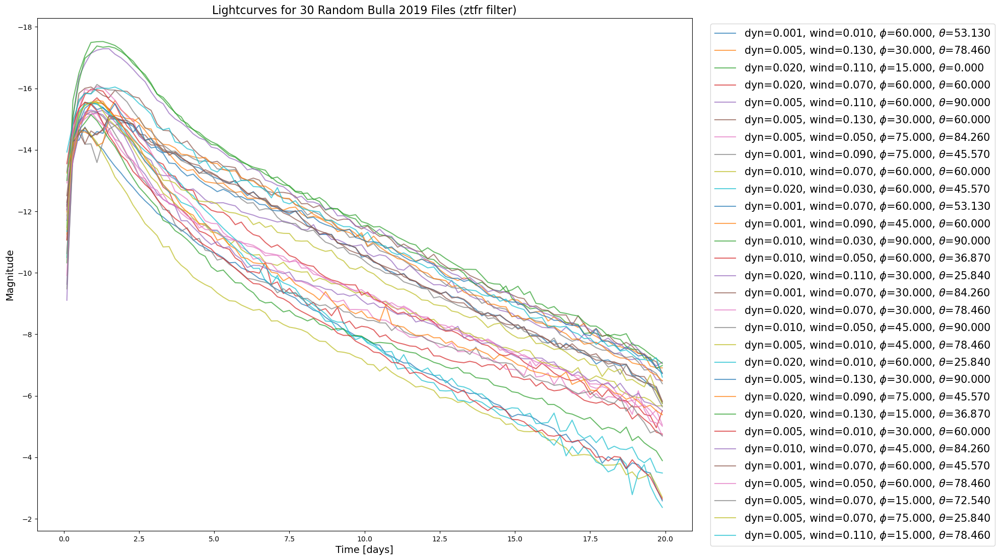

In [26]:
# Pick 30 random files and plot their lightcurves for one filter
import random
random_files = random.sample(list(bulla_dataset.data_dict.values()), 30)

fig, ax = plt.subplots(figsize=(20, 12))

for file_info in random_files:
    # Load data if not already loaded
    if file_info['data'] is None:
        file_info['data'] = np.loadtxt(file_info['filepath'])
        file_info['filters'] = bulla_dataset._extract_filters(file_info['filepath'])
    
    data = file_info['data']
    times = data[:, 0]  # Assuming first column is time
    if 'ztfr' in file_info['filters']:
        filter_idx = file_info['filters'].index('ztfr')
        # Create a label from parameters
        params = file_info['params']
        label = f"dyn={params.get('mejdyn', '?'):.3f}, wind={params.get('mejwind', '?'):.3f}, $\\phi$={params.get('phi', '?'):.3f}, $\\theta$={params.get('theta', '?'):.3f}"
        ax.plot(times, data[:, filter_idx + 1], label=label, alpha=0.7)  # +1 to account for time column
ax.set_xlabel('Time [days]', fontsize=14)
ax.set_ylabel('Magnitude', fontsize=14)
ax.set_title('Lightcurves for 30 Random Bulla 2019 Files (ztfr filter)', fontsize=16)
ax.invert_yaxis()
ax.legend(fontsize=15, bbox_to_anchor=(1.02, 1), loc='upper left')

plt.tight_layout()
plt.show()

This plot indicates that even if the parameter grid is quite sparse the resulting lightcurves can have significant differences. Moreover, we can see some strangness throughout the lc themselves.

Now I'll compute the standard deviation of the whole dataset 

In [27]:
# Compute variance of lc for one filter across the whole dataset
random_files = list(bulla_dataset.data_dict.values()) # Named random_files bc I first tried with a random sample but switched to all files after

# Stock all magnitudes and times for variance calculation
all_magnitudes = []
all_times = []

for file_info in random_files:
    # Load data if not already loaded
    if file_info['data'] is None:
        file_info['data'] = np.loadtxt(file_info['filepath'])
        file_info['filters'] = bulla_dataset._extract_filters(file_info['filepath'])
    
    data = file_info['data']
    times = data[:, 0]
    
    if 'ztfr' in file_info['filters']:
        filter_idx = file_info['filters'].index('ztfr')
        magnitudes = data[:, filter_idx+1]  # +1 because filters does not include time column
        
        # Stock for variance calculation
        all_magnitudes.append(magnitudes)
        all_times.append(times)

In [28]:
# Define a common time grid 
common_times = np.linspace(0.1, 19.9, 100)

# Calculate mean and std deviation at each time point
std_per_time = np.std(all_magnitudes, axis=0)
mean_per_time = np.mean(all_magnitudes, axis=0)
global_std = np.mean(std_per_time)

print(f"Mean standard deviation: {global_std:.2f} mag")

Mean standard deviation: 1.31 mag


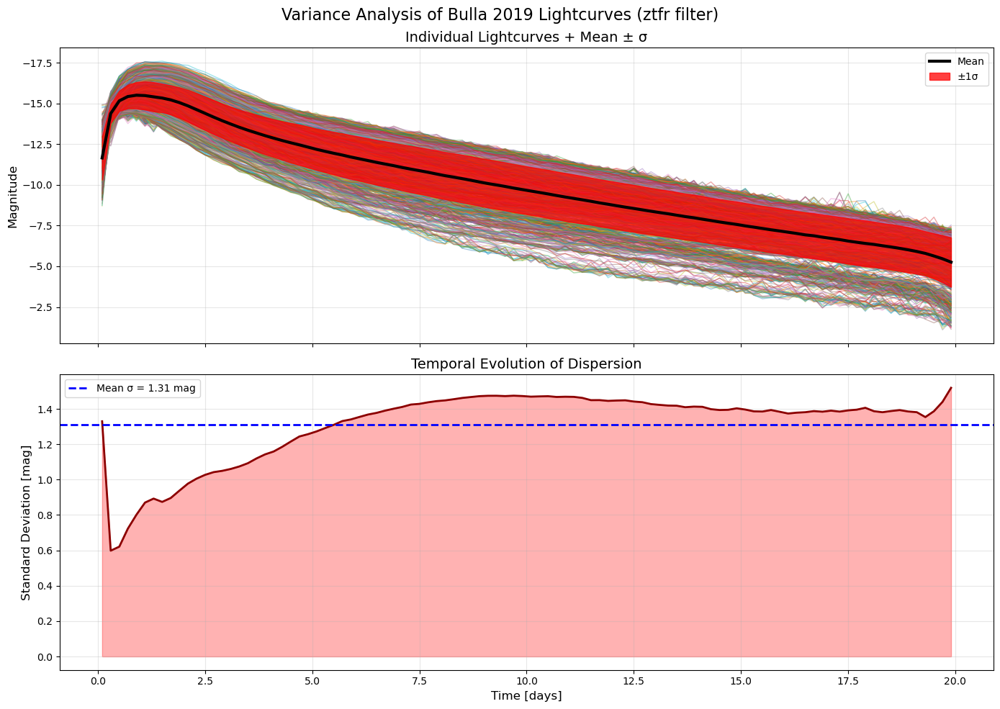

In [29]:
# Plotting
fig, axes = plt.subplots(2, 1, figsize=(14, 10), sharex=True)

# Subplot 1: Lc
for i, (times, mags) in enumerate(zip(all_times, all_magnitudes)):
    axes[0].plot(times, mags, alpha=0.4, linewidth=1)
axes[0].plot(common_times, mean_per_time, 'k-', linewidth=3, label='Mean', zorder=10)
axes[0].fill_between(common_times, 
                     mean_per_time - std_per_time,
                     mean_per_time + std_per_time,
                     alpha=0.75, color='red', label='±1σ', zorder=5)
axes[0].invert_yaxis()
axes[0].set_ylabel('Magnitude', fontsize=12)
axes[0].set_title('Individual Lightcurves + Mean ± σ', fontsize=14)
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Subplot 2: Deviation over time
axes[1].plot(common_times, std_per_time, linewidth=2, color='darkred')
axes[1].fill_between(common_times, 0, std_per_time, alpha=0.3, color='red')
axes[1].axhline(global_std, color='blue', linestyle='--', linewidth=2, 
                label=f'Mean σ = {global_std:.2f} mag')
axes[1].set_xlabel('Time [days]', fontsize=12)
axes[1].set_ylabel('Standard Deviation [mag]', fontsize=12)
axes[1].set_title('Temporal Evolution of Dispersion', fontsize=14)
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.suptitle('Variance Analysis of Bulla 2019 Lightcurves (ztfr filter)', fontsize=16)
plt.tight_layout()
plt.show()

The parts where the deviation is the biggest is around the very start and the end (after a few days). While the high dispersion at the very start and end might be due to some kind of edge effect, the gradual rise of the deviation after the peak indicates that this portion of the lc are more sensitive to the kn properties while, surprisingly, the peaks are more uniform that the rest. (I can still see some oddness around the peak of some lc, I'll try to discriminate this "region" of parameter for "faulty" lc).

***
## Plot the extreme cases


In [30]:
# Plot the all 0 param value lc
low_params_file = bulla_dataset.get_file(mejdyn=0.0, mejwind=0.0, phi=0.0, theta=0.0, dMpc=0.0, load_data=True)

⚠ No file found for these parameters:
  mejdyn=0.0, mejwind=0.0, phi=0.0, theta=0.0, dMpc=0.0


In [31]:
# No all 0 param file found, try to loop over parameters to find closest to 0
if low_params_file is None:
    closest_file = None
    closest_distance = float('inf') # Initialize with infinity
    for file in bulla_dataset.data_dict.values():
        params = file['params']
        distance = sum(np.sqrt((params.get(key, 0) - 0.0)**2) for key in ['mejdyn', 'mejwind', 'phi', 'theta', 'dMpc']) #  Euclidean distance to zero point
        if distance < closest_distance:
            closest_distance = distance
            closest_file = file
    low_params_file = closest_file
    print(f"Using closest match: {low_params_file['filename']} with params {low_params_file['params']}")

Using closest match: nph1.0e+06_mejdyn0.001_mejwind0.010_phi15_theta0.00_dMpc0.dat with params {'nph': '1.0e+06', 'mejdyn': 0.001, 'mejwind': 0.01, 'phi': 15.0, 'theta': 0.0, 'dMpc': 0.0}


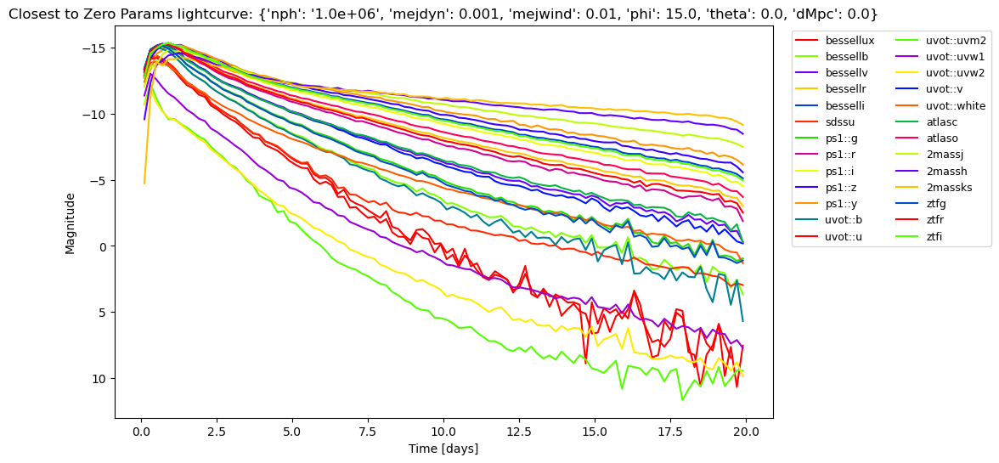

In [32]:
# Plot the lowest param lc
if low_params_file and low_params_file['data'] is not None:
    data = low_params_file['data']
    times = data[:, 0]  # Assuming first column is time

    fig, ax = plt.subplots(figsize=(10, 6))
    n_filters = len(low_params_file['filters'])
    colors = plt.cm.prism(np.linspace(0, 1, n_filters))

    for i, filter_name in enumerate(low_params_file['filters']):
        ax.plot(times, data[:, i+1], label=filter_name, color=colors[i]) # data[:, i+1] for filter columns, would have time in column 0 otherwise

    ax.set_xlabel('Time [days]')
    ax.set_ylabel('Magnitude')
    ax.set_title(f'Closest to Zero Params lightcurve: {low_params_file["params"]}', loc='center')
    ax.invert_yaxis()
    ax.legend(ncol=2, fontsize=9, bbox_to_anchor=(1.02, 1), loc='upper left')
    plt.show()

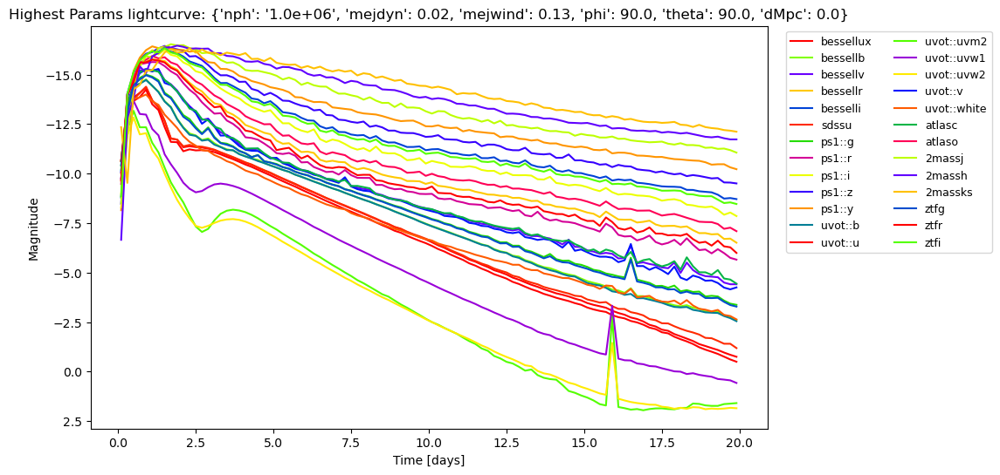

In [33]:
# Plot the lc with the highest param values
max_params = {key: stats['max'] for key, stats in bulla_dataset.param_ranges.items()}
high_params_file = bulla_dataset.get_file(**max_params, load_data=True)
if high_params_file and high_params_file['data'] is not None:
    data = high_params_file['data']
    times = data[:, 0]  # Assuming first column is time

    fig, ax = plt.subplots(figsize=(10, 6))
    n_filters = len(high_params_file['filters'])
    colors = plt.cm.prism(np.linspace(0, 1, n_filters))

    for i, filter_name in enumerate(high_params_file['filters']):
        ax.plot(times, data[:, i+1], label=filter_name, color=colors[i]) # data[:, i+1] for filter columns, would have time in column 0 otherwise

    ax.set_xlabel('Time [days]')
    ax.set_ylabel('Magnitude')
    ax.set_title(f'Highest Params lightcurve: {high_params_file["params"]}', loc='center')
    ax.invert_yaxis()
    ax.legend(ncol=2, fontsize=9, bbox_to_anchor=(1.02, 1), loc='upper left')
    plt.show()

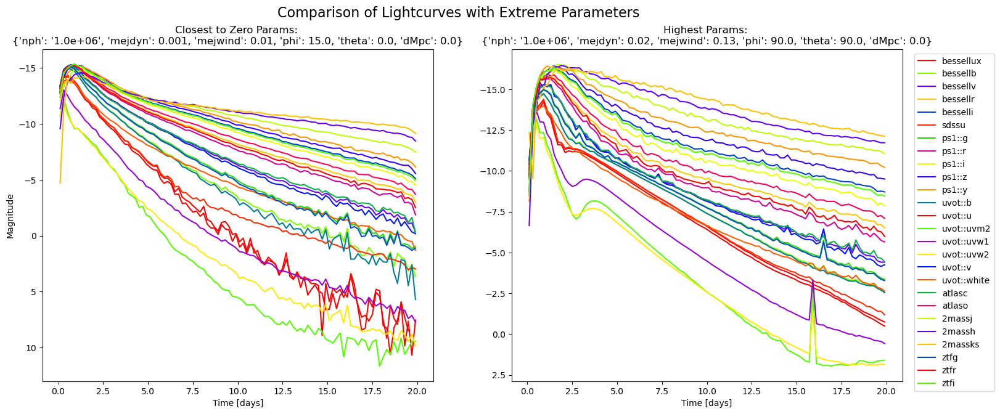

In [34]:
# Plot both lc next to each other for comparison
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
# Low params lc
data_low = low_params_file['data']
times_low = data_low[:, 0]  # Assuming first column is time
n_filters_low = len(low_params_file['filters'])
colors_low = plt.cm.prism(np.linspace(0, 1, n_filters_low))

for i, filter_name in enumerate(low_params_file['filters']):
    axes[0].plot(times_low, data_low[:, i+1], label=filter_name, color=colors_low[i])

axes[0].set_xlabel('Time [days]')
axes[0].set_ylabel('Magnitude')
axes[0].set_title(f'Closest to Zero Params: \n{low_params_file["params"]}', loc='center')
axes[0].invert_yaxis()
# High params lc
data_high = high_params_file['data']
times_high = data_high[:, 0]  # Assuming first column is time
n_filters_high = len(high_params_file['filters'])
colors_high = plt.cm.prism(np.linspace(0, 1, n_filters_high))
for i, filter_name in enumerate(high_params_file['filters']):
    axes[1].plot(times_high, data_high[:, i+1], label=filter_name, color=colors_high[i])
axes[1].set_xlabel('Time [days]')
axes[1].set_title(f'Highest Params: \n{high_params_file["params"]}', loc='center')
axes[1].invert_yaxis()
axes[1].legend(ncol=1, fontsize=10, bbox_to_anchor=(1.02, 1), loc='upper left')
plt.suptitle('Comparison of Lightcurves with Extreme Parameters', fontsize=16)
plt.show()

The lc are very distinct from each others in each filter, more ejecta mass seems to lead to brighter emission (which is completly normal as the ejecta is what powers the emission) but still, the difference is not strikingly high (around 2.5 mag). Another difference is the more rapid decay of the luminosity in the case of a low ejecta mass.

***
## Influence of each parameter

In [6]:
# Let's pick a "benchmark" file somewhere in the middle of the parameter space
median_params = {key: np.median(stats['unique']) for key, stats in bulla_dataset.param_ranges.items()}
benchmark_file = bulla_dataset.get_file(**median_params, load_data=True)
if benchmark_file is None:
    # Find closest match if exact median not found
    closest_file = None
    closest_distance = float('inf') # Initialize with infinity
    for file in bulla_dataset.data_dict.values():
        params = file['params']
        distance = sum(np.sqrt((params.get(key, 0) - median_params[key])**2) for key in ['mejdyn', 'mejwind', 'phi', 'theta', 'dMpc']) #  Euclidean distance to median point
        if distance < closest_distance:
            closest_distance = distance
            closest_file = file
    benchmark_file = closest_file
    print(f"Using closest match for benchmark: {benchmark_file['filename']} with params {benchmark_file['params']}")

⚠ No file found for these parameters:
  mejdyn=0.0075, mejwind=0.07, phi=45.0, theta=60.0, dMpc=0.0
Using closest match for benchmark: nph1.0e+06_mejdyn0.005_mejwind0.070_phi45_theta60.00_dMpc0.dat with params {'nph': '1.0e+06', 'mejdyn': 0.005, 'mejwind': 0.07, 'phi': 45.0, 'theta': 60.0, 'dMpc': 0.0}


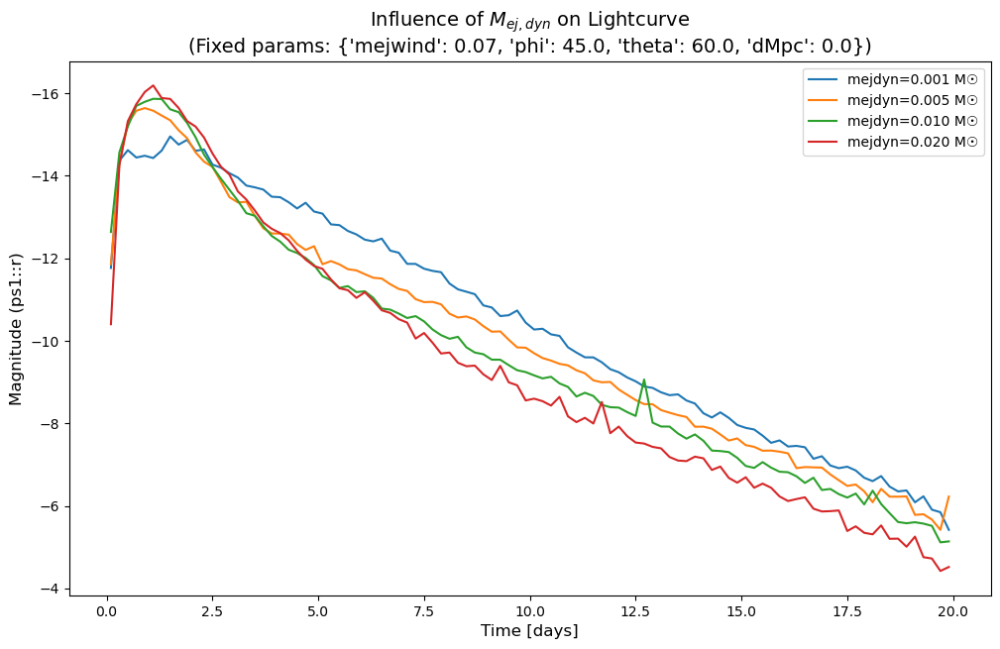

In [9]:
# Plot the influence of mejdyn on the lc, keeping other params fixed
fixed_params = benchmark_file['params'].copy()
fixed_params.pop('mejdyn')  # We will vary this parameter
fixed_params.pop('nph')    # Not in the find_files criteria
mejdyn_values = bulla_dataset.param_ranges['mejdyn']['unique']
fig, ax = plt.subplots(figsize=(12, 7))
for mejdyn in mejdyn_values:
    params = fixed_params.copy()
    params['mejdyn'] = mejdyn
    file_info = bulla_dataset.get_file(**params, load_data=True)
    if file_info and file_info['data'] is not None:
        data = file_info['data']
        times = data[:, 0]
        if 'ps1::r' in file_info['filters']:
            filter_idx = file_info['filters'].index('ps1::r')
            ax.plot(times, data[:, filter_idx + 1], label=f"mejdyn={mejdyn:.3f} M☉")
ax.set_xlabel('Time [days]', fontsize=12)
ax.set_ylabel('Magnitude (ps1::r)', fontsize=12)
ax.set_title(f'Influence of $M_{{ej,dyn}}$ on Lightcurve\n(Fixed params: { {k: v for k, v in fixed_params.items() if k != "mejdyn"} })', fontsize=14)
ax.invert_yaxis()
ax.legend(fontsize=10, loc='upper right')
plt.show()

As expected, a greater dynamical ejecta leads to a brighter KN and thus, a higher peak. $\textbf{BUT}$ also to a steeper decrease after it, it strangely does not seem to have any impact on the the time of the peak.

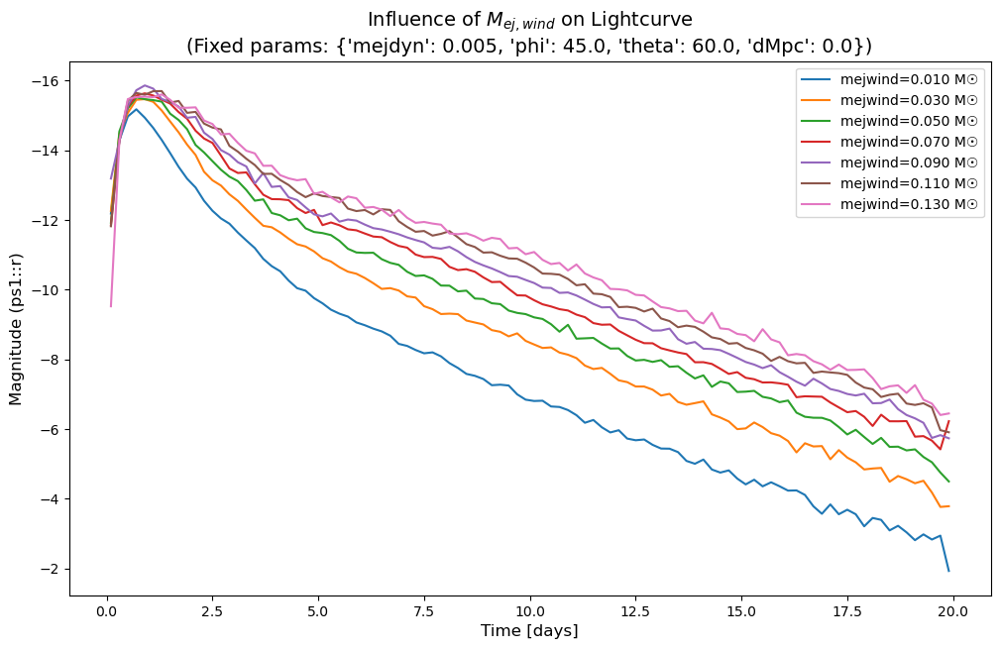

In [10]:
# Same for mejwind parameter
fixed_params = benchmark_file['params'].copy()
fixed_params.pop('mejwind')  # We will vary this parameter
fixed_params.pop('nph')    # Not in the find_files criteria
mejwind_values = bulla_dataset.param_ranges['mejwind']['unique']
fig, ax = plt.subplots(figsize=(12, 7))
for mejwind in mejwind_values:
    params = fixed_params.copy()
    params['mejwind'] = mejwind
    file_info = bulla_dataset.get_file(**params, load_data=True)
    if file_info and file_info['data'] is not None:
        data = file_info['data']
        times = data[:, 0]
        if 'ps1::r' in file_info['filters']:
            filter_idx = file_info['filters'].index('ps1::r')
            ax.plot(times, data[:, filter_idx + 1], label=f"mejwind={mejwind:.3f} M☉")
ax.set_xlabel('Time [days]', fontsize=12)
ax.set_ylabel('Magnitude (ps1::r)', fontsize=12)
ax.set_title(f'Influence of $M_{{ej,wind}}$ on Lightcurve\n(Fixed params: { {k: v for k, v in fixed_params.items() if k != "mejwind"} })', fontsize=14)
ax.invert_yaxis()
ax.legend(fontsize=10, loc='upper right')
plt.show()

Here again, a greater mass leads to brighter an overall KN but does not seem to affect the peak height (except for the lowest mass). Contrarly to $M_{dyn}$, a greater mass leads to a less steep decrease, probably because the dynamical ejecta is in the outer part of the total ejecta $\rightarrow$ it is "processed" first (that's why this quantity affects the peak) while the disc ejecta comes after and thus affects the later parts (even though the disk ejecta is expelled very quickly after the merger).

⚠ No file found for these parameters:
  mejdyn=0.005, mejwind=0.07, phi=0.0, theta=60.0, dMpc=0.0
⚠ No file found for these parameters:
  mejdyn=0.005, mejwind=0.07, phi=90.0, theta=60.0, dMpc=0.0


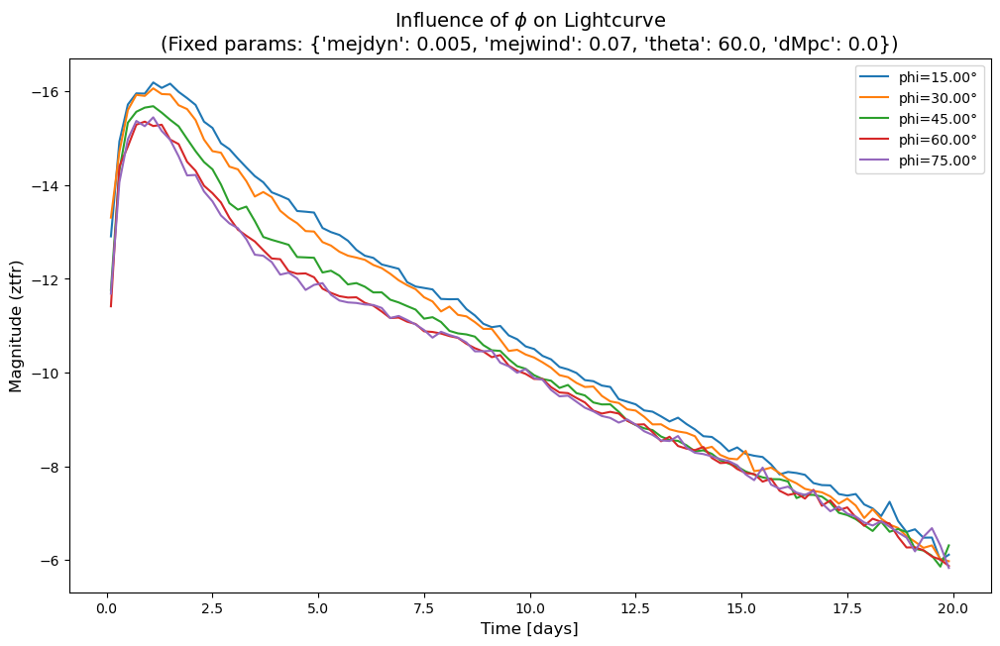

In [38]:
# Same for KNphi parameter
fixed_params = benchmark_file['params'].copy()
fixed_params.pop('phi')  # We will vary this parameter
fixed_params.pop('nph')    # Not in the find_files criteria
phi_values = bulla_dataset.param_ranges['phi']['unique']
fig, ax = plt.subplots(figsize=(12, 7))
for phi in phi_values:
    params = fixed_params.copy()
    params['phi'] = phi
    file_info = bulla_dataset.get_file(**params, load_data=True)
    if file_info and file_info['data'] is not None:
        data = file_info['data']
        times = data[:, 0]
        if 'ztfr' in file_info['filters']:
            filter_idx = file_info['filters'].index('ztfr')
            ax.plot(times, data[:, filter_idx + 1], label=f"phi={phi:.2f}°")
ax.set_xlabel('Time [days]', fontsize=12)
ax.set_ylabel('Magnitude (ztfr)', fontsize=12)
ax.set_title(f'Influence of $\\phi$ on Lightcurve\n(Fixed params: { {k: v for k, v in fixed_params.items() if k != "phi"} })', fontsize=14)
ax.invert_yaxis()
ax.legend(fontsize=10, loc='upper right')
plt.show()

It seems that a higher $\phi$ means a brighter KN but I am not sure why.

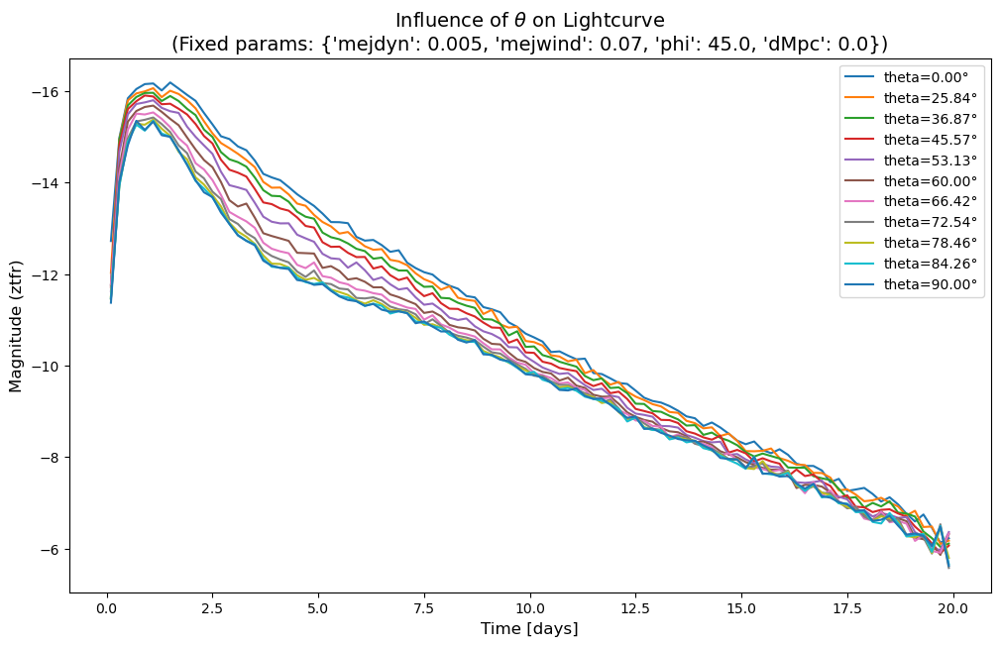

In [39]:
# Same for KN theta
fixed_params = benchmark_file['params'].copy()
fixed_params.pop('theta')  # We will vary this parameter
fixed_params.pop('nph')    # Not in the find_files criteria
theta_values = bulla_dataset.param_ranges['theta']['unique']
fig, ax = plt.subplots(figsize=(12, 7))
for theta in theta_values:
    params = fixed_params.copy()
    params['theta'] = theta
    file_info = bulla_dataset.get_file(**params, load_data=True)
    if file_info and file_info['data'] is not None:
        data = file_info['data']
        times = data[:, 0]
        if 'ztfr' in file_info['filters']:
            filter_idx = file_info['filters'].index('ztfr')
            ax.plot(times, data[:, filter_idx + 1], label=f"theta={theta:.2f}°")
ax.set_xlabel('Time [days]', fontsize=12)
ax.set_ylabel('Magnitude (ztfr)', fontsize=12)
ax.set_title(f'Influence of $\\theta$ on Lightcurve\n(Fixed params: { {k: v for k, v in fixed_params.items() if k != "theta"} })', fontsize=14)
ax.invert_yaxis()
ax.legend(fontsize=10, loc='upper right')
plt.show()

If I suppose $\theta =0$ means the LOS is aligned with the axis of rotation of the system we have brighter emission when the polar ejecta is facing toward us and decreasing brightness as we deviate our LOS from it. Logically, the polar ejecta should be more "red" so the luminosity in a bluer filter should be lower.

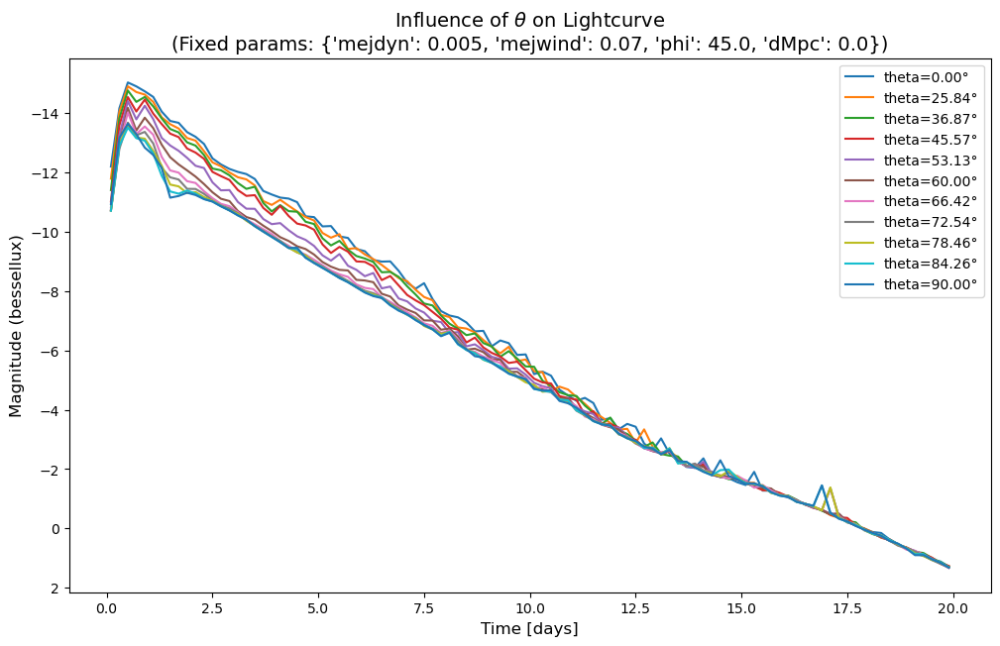

In [40]:
# Theta but with a bluer filter
fixed_params = benchmark_file['params'].copy()
fixed_params.pop('theta')  # We will vary this parameter
fixed_params.pop('nph')    # Not in the find_files criteria
theta_values = bulla_dataset.param_ranges['theta']['unique']
fig, ax = plt.subplots(figsize=(12, 7))
for theta in theta_values:
    params = fixed_params.copy()
    params['theta'] = theta
    file_info = bulla_dataset.get_file(**params, load_data=True)
    if file_info and file_info['data'] is not None:
        data = file_info['data']
        times = data[:, 0]
        if 'bessellux' in file_info['filters']:
            filter_idx = file_info['filters'].index('bessellux')
            ax.plot(times, data[:, filter_idx + 1], label=f"theta={theta:.2f}°")
ax.set_xlabel('Time [days]', fontsize=12)
ax.set_ylabel('Magnitude (bessellux)', fontsize=12)
ax.set_title(f'Influence of $\\theta$ on Lightcurve\n(Fixed params: { {k: v for k, v in fixed_params.items() if k != "theta"} })', fontsize=14)
ax.invert_yaxis()
ax.legend(fontsize=10, loc='upper right')
plt.show()

Indeed the brightness is lower but for all $\theta$ so I can't conclude anything from a theoretical viewpoint. Still a lower theta is favorable for a brighter emission.

⚠ No file found for these parameters:
  mejdyn=0.005, mejwind=0.07, phi=0.0, theta=0.0, dMpc=0.0
⚠ No file found for these parameters:
  mejdyn=0.005, mejwind=0.07, phi=0.0, theta=25.84, dMpc=0.0
⚠ No file found for these parameters:
  mejdyn=0.005, mejwind=0.07, phi=0.0, theta=36.87, dMpc=0.0
⚠ No file found for these parameters:
  mejdyn=0.005, mejwind=0.07, phi=0.0, theta=45.57, dMpc=0.0
⚠ No file found for these parameters:
  mejdyn=0.005, mejwind=0.07, phi=0.0, theta=53.13, dMpc=0.0
⚠ No file found for these parameters:
  mejdyn=0.005, mejwind=0.07, phi=0.0, theta=60.0, dMpc=0.0
⚠ No file found for these parameters:
  mejdyn=0.005, mejwind=0.07, phi=0.0, theta=66.42, dMpc=0.0
⚠ No file found for these parameters:
  mejdyn=0.005, mejwind=0.07, phi=0.0, theta=72.54, dMpc=0.0
⚠ No file found for these parameters:
  mejdyn=0.005, mejwind=0.07, phi=0.0, theta=78.46, dMpc=0.0
⚠ No file found for these parameters:
  mejdyn=0.005, mejwind=0.07, phi=0.0, theta=84.26, dMpc=0.0
⚠ No file fou

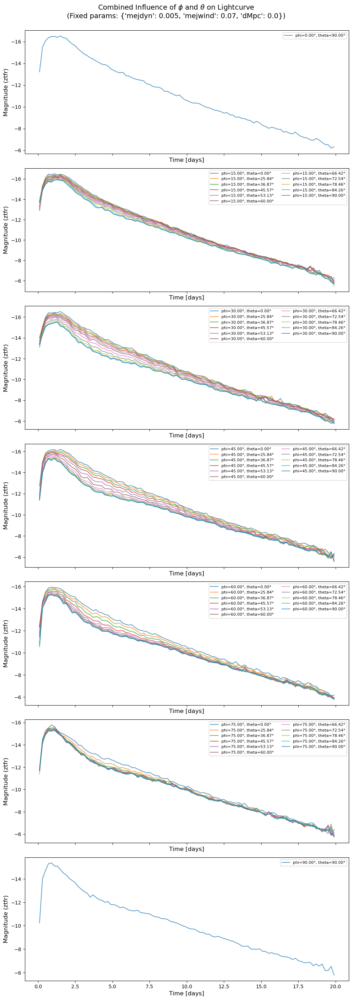

In [41]:
#Same but for combined influence of phi and theta
fixed_params = benchmark_file['params'].copy()
fixed_params.pop('phi')    # We will vary this parameter
fixed_params.pop('theta')  # We will vary this parameter
fixed_params.pop('nph')    # Not in the find_files criteria
phi_values = bulla_dataset.param_ranges['phi']['unique']
theta_values = bulla_dataset.param_ranges['theta']['unique']
fig, ax = plt.subplots(nrows=7, ncols=1, figsize=(10, 28), sharex=True)
for i, phi in enumerate(phi_values):
    for theta in theta_values:
        params = fixed_params.copy()
        params['phi'] = phi
        params['theta'] = theta
        file_info = bulla_dataset.get_file(**params, load_data=True)
        if file_info and file_info['data'] is not None:
            data = file_info['data']
            times = data[:, 0]
            if 'ztfr' in file_info['filters']:
                filter_idx = file_info['filters'].index('ztfr')
                ax[i].plot(times, data[:, filter_idx + 1], label=f"phi={phi:.2f}°, theta={theta:.2f}°", alpha=0.7)
                ax[i].invert_yaxis()
    ax[i].legend(fontsize=8, loc='upper right', ncol=2)
    ax[i].set_xlabel('Time [days]', fontsize=12)
    ax[i].set_ylabel('Magnitude (ztfr)', fontsize=12)
plt.suptitle(f'Combined Influence of $\\phi$ and $\\theta$ on Lightcurve\n(Fixed params: { {k: v for k, v in fixed_params.items() if k not in ["phi", "theta"]} })', fontsize=14, y=1.0001)
plt.tight_layout()
plt.show()

We keep the same trends for $\theta$ (lower angle, brighter KN) and the same apply for $\phi$ but it seems that for moderate values of $\phi$ (\~30-45) we have a broader distribution but I can't figure out why.

Globally, the takeaway is almost the same as for the comparison of the extreme cases : higher ejecta mass means brighter KN but now we know that the dynamical ejecta has morer impact on the peak luminosity while the disk mass influence most the magnitude post peak.

***
## Comparison between model and dataset lc

{'nph': '1.0e+06', 'mejdyn': 0.005, 'mejwind': 0.07, 'phi': 45.0, 'theta': 60.0, 'dMpc': 0.0}
Loaded filter ztfr
Loaded filter ztfi
Loaded filter ztfg


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


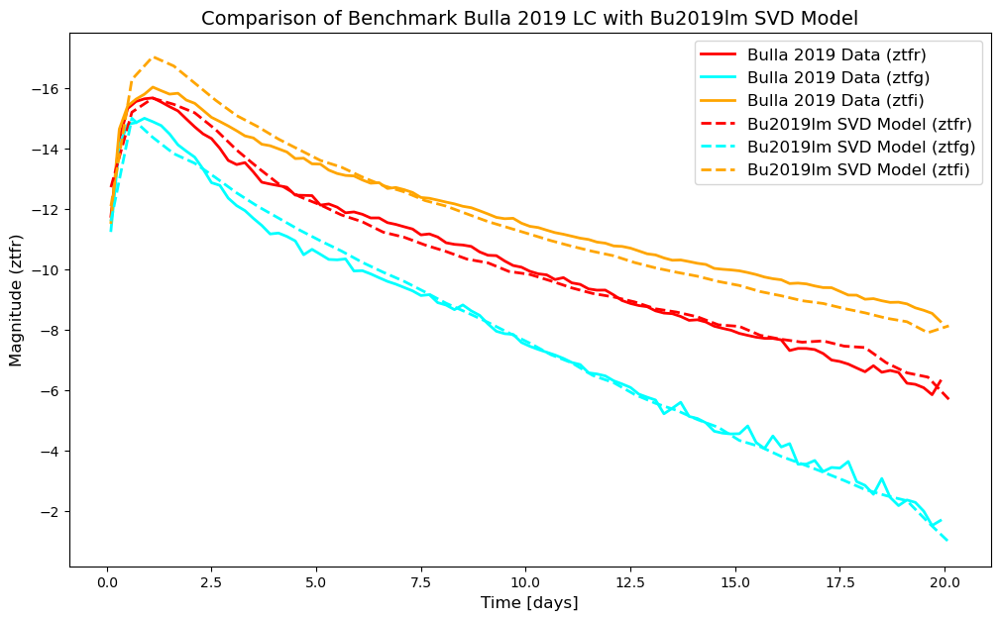

In [42]:
# Compare the median file lc to the Bu2019lm model lc with same parameters
print(benchmark_file['params'])
# Transform parameters to match Bu2019lm model input
model_param = {
    'log10_mej_dyn': np.log10(benchmark_file['params']['mejdyn']),
    'log10_mej_wind': np.log10(benchmark_file['params']['mejwind']),
    'KNphi': benchmark_file['params']['phi'],
    'KNtheta': benchmark_file['params']['theta'],
    'luminosity_distance': benchmark_file['params']['dMpc']
}

# Setup SVD model
svd_path = '/home/liteul/memoir_code/NMMA/svdmodels'
tmin_svd, tmax_svd, dt_svd = 0.1, 20.0, 0.5
sample_times_svd = np.arange(tmin_svd, tmax_svd + dt_svd, dt_svd)
svd_model = SVDLightCurveModel(
    model='Bu2019lm',
    sample_times=sample_times_svd,
    svd_path=svd_path,
    mag_ncoeff=10,
    lbol_ncoeff=10,
    filters=['ztfr', 'ztfi', 'ztfg']
    )

# Generate model lc
_, model_lc = svd_model.generate_lightcurve(sample_times_svd,model_param)
# Plot comparison
fig, ax = plt.subplots(figsize=(12, 7))
# Plot benchmark lc
data = benchmark_file['data']
times = data[:, 0]
if 'ztfr' in benchmark_file['filters']:
    filter_idx = benchmark_file['filters'].index('ztfr')
    ax.plot(times, data[:, filter_idx + 1], label='Bulla 2019 Data (ztfr)', color='red', linewidth=2)
if 'ztfg' in benchmark_file['filters']:
    filter_idx = benchmark_file['filters'].index('ztfg')
    ax.plot(times, data[:, filter_idx + 1], label='Bulla 2019 Data (ztfg)', color='cyan', linewidth=2)
if 'ztfi' in benchmark_file['filters']:
    filter_idx = benchmark_file['filters'].index('ztfi')
    ax.plot(times, data[:, filter_idx + 1], label='Bulla 2019 Data (ztfi)', color='orange', linewidth=2)
# Plot SVD model lc
ax.plot(sample_times_svd, model_lc['ztfr'], label='Bu2019lm SVD Model (ztfr)', color='red', linestyle='--', linewidth=2)
ax.plot(sample_times_svd, model_lc['ztfg'], label='Bu2019lm SVD Model (ztfg)', color='cyan', linestyle='--', linewidth=2)
ax.plot(sample_times_svd, model_lc['ztfi'], label='Bu2019lm SVD Model (ztfi)', color='orange', linestyle='--', linewidth=2)
ax.set_xlabel('Time [days]', fontsize=12)
ax.set_ylabel('Magnitude (ztfr)', fontsize=12)
ax.set_title('Comparison of Benchmark Bulla 2019 LC with Bu2019lm SVD Model', fontsize=14)
ax.invert_yaxis()
ax.legend(fontsize=12)
plt.show()

The model seems to follow the data quite well, it even "smooth" the end tail of the lc that were prone to some strange up and down variations. $\textbf{However}$, the model is not well aligned with the peak (especially in the i band)! 

This is maybe just for this file, I'll try to quantify this variation around the peak for the whole dataset.

In [43]:
from tqdm import tqdm

# Compute the mean difference between the benchmark lc and the SVD model lc in ztfr filter
all_files = list(bulla_dataset.data_dict.values()) 
differences = []
for file_info in tqdm(all_files, desc="Comparing files to SVD model", unit="file"):
    # Load data if not already loaded
    if file_info['data'] is None:
        file_info['data'] = np.loadtxt(file_info['filepath'])
        file_info['filters'] = bulla_dataset._extract_filters(file_info['filepath'])
    
    data = file_info['data']
    times = data[:, 0]
    
    if 'ztfr' in file_info['filters']:
        filter_idx = file_info['filters'].index('ztfr')
        magnitudes = data[:, filter_idx + 1]  # +1 because filters does not include time column
        
        # Generate SVD model lc for the same parameters (model already setup just above)
        params = file_info['params']
        model_param = {
            'log10_mej_dyn': np.log10(params['mejdyn']),
            'log10_mej_wind': np.log10(params['mejwind']),
            'KNphi': params['phi'],
            'KNtheta': params['theta'],
            'luminosity_distance': params['dMpc']
        }
        _, model_lc = svd_model.generate_lightcurve(times, model_param) # Generate on the same time grid as the data
        model_mags = model_lc['ztfr']
        
        # Compute mean absolute difference
        mean_diff = np.mean(np.abs(magnitudes - model_mags))
        differences.append(mean_diff)

print(f"Files processed: {len(differences)}")
print(f"Mean difference: {np.mean(differences):.3f} mag")

Comparing files to SVD model: 100%|██████████| 1596/1596 [00:33<00:00, 47.20file/s] 

Files processed: 1596
Mean difference: 0.189 mag


Overall the difference is not that much, however, I should inspect the difference peak to peak because this is where it seems the difference was the biggest.

In [44]:
# Same thing but for the peak magnitude difference only (ztfr filter)

all_files = list(bulla_dataset.data_dict.values()) 
differences = []
for file_info in tqdm(all_files, desc="Comparing files to SVD model", unit="file"):
    # Load data if not already loaded
    if file_info['data'] is None:
        file_info['data'] = np.loadtxt(file_info['filepath'])
        file_info['filters'] = bulla_dataset._extract_filters(file_info['filepath'])
    
    data = file_info['data']
    times = data[:, 0]
    
    if 'ztfr' in file_info['filters']:
        filter_idx = file_info['filters'].index('ztfr')
        magnitudes = data[:, filter_idx + 1]  # +1 because filters does not include time column
        
        # Generate SVD model lc for the same parameters (model already setup just above)
        params = file_info['params']
        model_param = {
            'log10_mej_dyn': np.log10(params['mejdyn']),
            'log10_mej_wind': np.log10(params['mejwind']),
            'KNphi': params['phi'],
            'KNtheta': params['theta'],
            'luminosity_distance': params['dMpc']
        }
        _, model_lc = svd_model.generate_lightcurve(times, model_param) # Generate on the same time grid as the data
        model_mags = model_lc['ztfr']
        
        # Compute mean absolute difference of peak magnitudes only
        peak_mag = np.min(magnitudes)
        peak_model_mag = np.min(model_mags)
        mean_diff = np.abs(peak_mag - peak_model_mag)
        differences.append(mean_diff)

print(f"Files processed: {len(differences)}")
print(f"Mean difference: {np.mean(differences):.3f} mag")

Comparing files to SVD model: 100%|██████████| 1596/1596 [00:33<00:00, 48.21file/s] 

Files processed: 1596
Mean difference: 0.187 mag


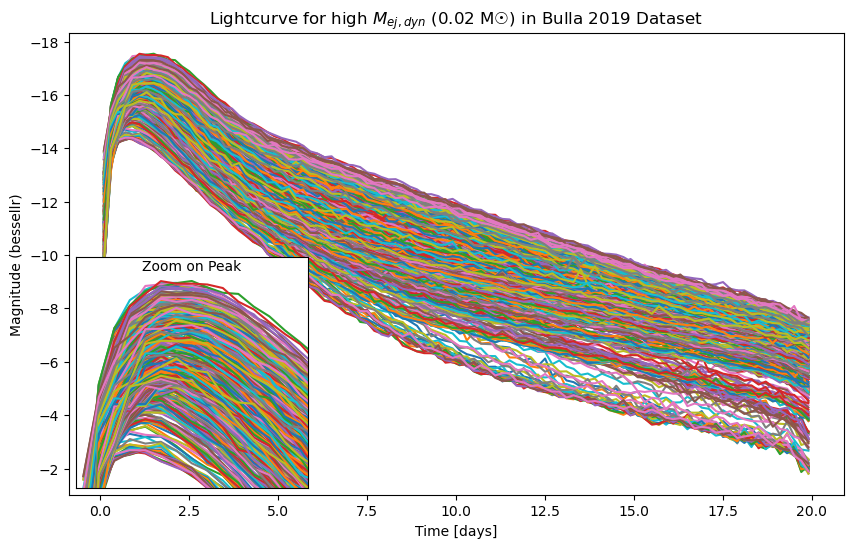

In [39]:
# plot low m_dyn lc 
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset

fig, ax = plt.subplots(figsize=(10, 6))
axins = inset_axes(ax, width="30%", height="50%", loc='lower left')
low_mdyn_files = bulla_dataset.find_files(mejdyn=0.02)
for file_name in low_mdyn_files:
    if file_name['data'] is None:
        file_name['data'] = np.loadtxt(file_name['filepath'])
        file_name['filters'] = bulla_dataset._extract_filters(file_name['filepath'])
    data = file_name['data']
    times = data[:, 0]  # Assuming first column is time
    if 'bessellr' in file_name['filters']:
        filter_idx = file_name['filters'].index('bessellr')
        ax.plot(times, data[:, filter_idx + 1], label=f"mejwind={file_name['params']['mejwind']:.3f} M☉") # data[:, 1] for first filter column, would have time in column 0 otherwise
        axins.plot(times, data[:, filter_idx + 1])
axins.set_xticks([])
axins.set_yticks([])
axins.set_xlim(0, 3.)
axins.set_ylim(-18, -13.7)
axins.invert_yaxis()
axins.set_title('Zoom on Peak', fontsize=10, pad=2, y=0.93)
mark_inset(ax, axins, loc1=2, loc2=1, ec='none', lw=1)
ax.set_xlabel('Time [days]')
ax.set_ylabel('Magnitude (bessellr)')
ax.set_title('Lightcurve for high $M_{ej,dyn}$ (0.02 M☉) in Bulla 2019 Dataset')
ax.invert_yaxis()
#ax.legend(fontsize=10, loc='upper right')
plt.show()

It is even lower than before, the divergence is likely minimal on most files. 
***


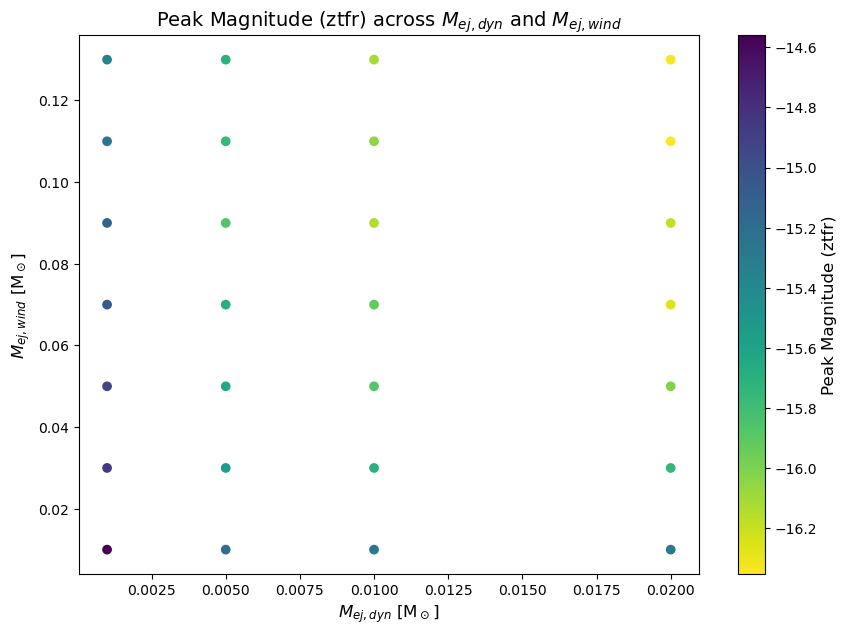

NameError: name 'selected_indices' is not defined

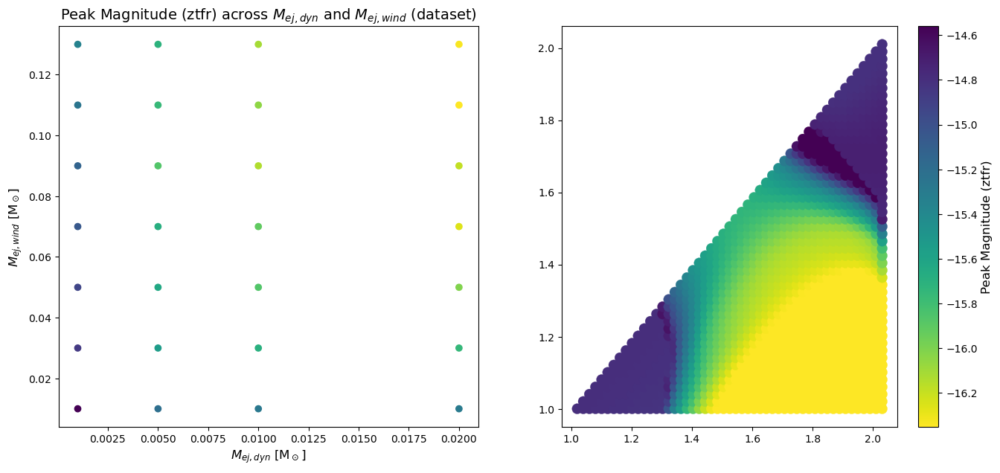

In [15]:
# Scatter plot of peak magnitude (mdyn vs mwind)
mejdyn_values = bulla_dataset.param_ranges['mejdyn']['unique']
mejwind_values = bulla_dataset.param_ranges['mejwind']['unique']
peak_magnitudes = np.full((len(mejdyn_values), len(mejwind_values)), np.nan)
for i, mejdyn in enumerate(mejdyn_values):
    for j, mejwind in enumerate(mejwind_values):
        file_info = bulla_dataset.get_file(mejdyn=mejdyn, mejwind=mejwind, phi=benchmark_file['params']['phi'], theta=benchmark_file['params']['theta'], dMpc=0, load_data=True)
        if file_info:
            if file_info['data'] is None:
                file_info['data'] = np.loadtxt(file_info['filepath'])
                file_info['filters'] = bulla_dataset._extract_filters(file_info['filepath'])
            data = file_info['data']
            if 'ztfr' in file_info['filters']:
                filter_idx = file_info['filters'].index('ztfr')
                magnitudes = data[:, filter_idx + 1]
                peak_magnitudes[i, j] = np.min(magnitudes)

# Compact the arrays for plotting with meshgrid
X, Y = np.meshgrid(mejdyn_values, mejwind_values)
Z = peak_magnitudes.T

# Plot
fig, ax = plt.subplots(figsize=(10, 7))
sc = ax.scatter(
    X,
    Y,
    c=Z,
    cmap='viridis_r',
)
ax.set_xlabel('$M_{ej,dyn}$ [M$_\odot$]', fontsize=12)
ax.set_ylabel('$M_{ej,wind}$ [M$_\odot$]', fontsize=12)
ax.set_title('Peak Magnitude (ztfr) across $M_{ej,dyn}$ and $M_{ej,wind}$', fontsize=14)
cbar = plt.colorbar(sc, ax=ax)
cbar.set_label('Peak Magnitude (ztfr)', fontsize=12)
plt.show()

# Plot but smooth
fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(16, 7))
sc = ax[0].scatter(
    X,
    Y,
    c=Z,
    cmap='viridis_r',
)
ax[0].set_xlabel('$M_{ej,dyn}$ [M$_\odot$]', fontsize=12)
ax[0].set_ylabel('$M_{ej,wind}$ [M$_\odot$]', fontsize=12)
ax[0].set_title('Peak Magnitude (ztfr) across $M_{ej,dyn}$ and $M_{ej,wind}$ (dataset)', fontsize=14)
cbar = plt.colorbar(sc, ax=ax[1])
cbar.set_label('Peak Magnitude (ztfr)', fontsize=12)

# add the faulty point
dic = phi_60
vmin, vmax = np.nanmin(Z), np.nanmax(Z)
norm = plt.Normalize(vmin, vmax)
mags = dic['magnitude']
ax[1].scatter(dic['pair_array'][:, 0], dic['pair_array'][:, 1], c=mags, cmap='viridis_r',
                            s=100, edgecolors=None, linewidths=0.2, norm=norm)

for i, idx in enumerate(selected_indices):
    rgba = plt.cm.viridis_r(norm(float(dic['magnitude'][idx])))
    print(f"Selected point (index {idx}):")
    print(f"  M1: {dic['pair_array'][idx, 0]:.3f} M☉")
    print(f"  M2: {dic['pair_array'][idx, 1]:.3f} M☉")
    print(f"  Magnitude: {dic['magnitude'][idx]:.2f}")
    ax[0].scatter(dic['fit_masses'][idx], dic['wind_linear'][idx], color=rgba, s=200, label='Selected Point', marker='*', edgecolors='white', linewidths=0.5)
    ax[0].text(dic['fit_masses'][idx], dic['wind_linear'][idx], f'  {i+1}', fontsize=12, fontweight='bold', color=rgba)

    # Plot position on grid mass
    ax[1].scatter(dic['pair_array'][idx, 0], dic['pair_array'][idx, 1], color='cyan', s=200, label='Selected Point', marker='*')
    ax[1].text(dic['pair_array'][idx, 0], dic['pair_array'][idx, 1], f'  {i+1}', fontsize=12, fontweight='bold', color='cyan')
plt.show()

## Plot Bulla lc closest to faulty points in "triangle" plot.

Selected point (index 856):
  M1: 1.828 M☉
  M2: 1.727 M☉
  Magnitude: -14.28
  M_dyn: 0.0012 M☉
  M_wind: 0.0053 M☉
⚠ No file found for these parameters:
  mejdyn=0.0011932433683134991, mejwind=0.0015927581410513122, phi=60.0, theta=30.0, dMpc=0
Using closest match: nph1.0e+06_mejdyn0.001_mejwind0.010_phi60_theta25.84_dMpc0.dat with params {'nph': '1.0e+06', 'mejdyn': 0.001, 'mejwind': 0.01, 'phi': 60.0, 'theta': 25.84, 'dMpc': 0.0}


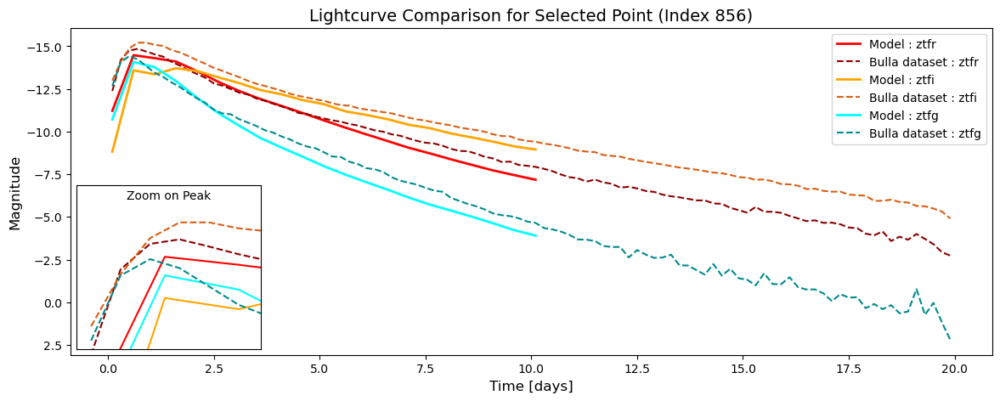

In [28]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset

# Faulty point info
dic=phi_60
idx = selected_indices[0]  
print(f"Selected point (index {idx}):")
print(f"  M1: {dic['pair_array'][idx, 0]:.3f} M☉")
print(f"  M2: {dic['pair_array'][idx, 1]:.3f} M☉")
print(f"  Magnitude: {dic['magnitude'][idx]:.2f}")
print(f"  M_dyn: {dic['fit_masses'][idx]:.4f} M☉")
print(f"  M_wind: {dic['wind_linear'][idx]:.4f} M☉")

# plot lc of that point

log_10dyn = np.zeros(len(dic['fit_masses']))
for i, m in enumerate(dic['fit_masses']):
    if m > 0:
        log_10dyn[i] = np.log10(m)
    else:
        log_10dyn[i] = -5  
log_10wind = np.log10(0.3) + np.log10(dic['wind_linear'])
pair_array = dic['pair_array']
mags = dic['magnitude']
n_points = len(selected_indices)
model_param = dic['model_param']
filter = dic['filter']

# Plot lc in g r i bands
# 2 col per point: lc + position on the grid

fig, axes = plt.subplots(figsize=(14,5))

model_param.update({
    "log10_mej_dyn": log_10dyn[idx],              # log10(Masse éjectée dynamique en M☉)
    "log10_mej_wind": log_10wind[idx],              # log10(Masse éjectée par vent en M☉)
    })
_, mag_svd = svd_model.generate_lightcurve(sample_times_svd, model_param)
Bulla_parameters = {
    'mejdyn': 10**log_10dyn[idx],
    'mejwind': 10**log_10wind[idx],
    'phi': model_param['KNphi'],
    'theta': model_param['KNtheta'],
    'dMpc': 0
}
low_params_file = bulla_dataset.get_file(**Bulla_parameters, load_data=True)
if low_params_file is None:
    closest_file = None
    closest_distance = float('inf') # Initialize with infinity
    for file in bulla_dataset.data_dict.values():
        params = file['params']
        distance = sum(np.sqrt((params.get(key, 0) - Bulla_parameters[key])**2) for key in ['mejdyn', 'mejwind', 'phi', 'theta', 'dMpc']) #  Euclidean distance 
        if distance < closest_distance:
            closest_distance = distance
            closest_file = file
    low_params_file = closest_file
    print(f"Using closest match: {low_params_file['filename']} with params {low_params_file['params']}")
    low_params_file['data'] = np.loadtxt(low_params_file['filepath'])
    low_params_file['filters'] = bulla_dataset._extract_filters(low_params_file['filepath'])
cols = [['red', 'darkred'], ['orange', '#d95f14'], ['cyan', 'darkcyan']]

for i, (filter_name, color) in enumerate(zip(['ztfr', 'ztfi', 'ztfg'], cols)):
    axes.plot(sample_times_svd, mag_svd[filter_name], label=f'Model : {filter_name}', linewidth=2, color=color[0])
    if filter_name in low_params_file['filters']:
        filter_idx = low_params_file['filters'].index(filter_name)
        data = low_params_file['data']
        times = data[:, 0]
        axes.plot(times, data[:, filter_idx + 1], ls='--', label=f'Bulla dataset : {filter_name}', markersize=6, color=color[1])
axes.set_xlabel('Time [days]', fontsize=12)
axes.set_ylabel('Magnitude', fontsize=12)
axes.set_title(f'Lightcurve Comparison for Selected Point (Index {idx})', fontsize=14)
axes.invert_yaxis()
axes.legend(fontsize=10)

# Zoom on peak
axins = inset_axes(axes, width="20%", height="50%", loc='lower left')
for i, (filter_name, color) in enumerate(zip(['ztfr', 'ztfi', 'ztfg'], cols)):
    axins.plot(sample_times_svd, mag_svd[filter_name], color=color[0])
    if filter_name in low_params_file['filters']:
        filter_idx = low_params_file['filters'].index(filter_name)
        data = low_params_file['data']
        times = data[:, 0]
        axins.plot(times, data[:, filter_idx + 1], ls='--', color=color[1])

# Set zoom limits
x1, x2, y1, y2 = 0, 1.25, -16, -12.5
axins.set_xlim(x1, x2)
axins.set_ylim(y1, y2)
axins.set_xticks([])
axins.set_yticks([])
axins.invert_yaxis()
axins.set_title('Zoom on Peak', fontsize=10, pad=2, y=0.9)

mark_inset(axes, axins, loc1=2, loc2=1, ec='none', lw=1)

plt.show()

In [30]:
# Modification of the plot_indices function

def plot_lc_for_indices_v2(selected_indices, dic, model_name='Bu2019lm'):
    """Plot the lightcurves for the selected indices and print their parameters.
    Parameters
    ----------
    selected_indices : list
        List of selected indices.
    dic : dict
        Dictionary containing 'pair_array', 'magnitude', 'fit_masses', 'wind_linear', and 'model_param' keys (returned by ejecta_plot_v2).
    model_name : str, optional
        Name of the SVD model to be used (default is 'Bu2019lm') Ideally the same model used in ejecta_plot_v2.
    ----------
    """
    %matplotlib inline
    import matplotlib.pyplot as plt
    import matplotlib.colors as colors

    for idx in selected_indices:
        print(f"Selected point (index {idx}):")
        print(f"  M1: {dic['pair_array'][idx, 0]:.3f} M☉")
        print(f"  M2: {dic['pair_array'][idx, 1]:.3f} M☉")
        print(f"  Magnitude: {dic['magnitude'][idx]:.2f}")
        print(f"  M_dyn: {dic['fit_masses'][idx]:.4f} M☉")
        print(f"  M_wind: {dic['wind_linear'][idx]:.4f} M☉")

        print()

    # Setup SVD model
    svd_path = '/home/liteul/memoir_code/NMMA/svdmodels'
    tmin_svd, tmax_svd, dt_svd = 0.1, 19.9, 0.1
    sample_times_svd = np.arange(tmin_svd, tmax_svd + dt_svd, dt_svd)
    svd_model = SVDLightCurveModel(
        model=model_name,
        sample_times=sample_times_svd,
        svd_path=svd_path,
        mag_ncoeff=10,
        lbol_ncoeff=10,
        filters=['ztfr', 'ztfi', 'ztfg']
        )

    # Extract data from dictionary
    log_10dyn = np.zeros(len(dic['fit_masses']))
    for i, m in enumerate(dic['fit_masses']):
        if m > 0:
            log_10dyn[i] = np.log10(m)
        else:
            log_10dyn[i] = -5  
    log_10wind = np.log10(0.3) + np.log10(dic['wind_linear'])
    pair_array = dic['pair_array']
    mags = dic['magnitude']
    n_points = len(selected_indices)
    model_param = dic['model_param']
    filter = dic['filter']

    # Plot lc in g r i bands
    # 2 col per point: lc + position on the grid

    fig, axes = plt.subplots(n_points, 2, figsize=(18, 6*n_points), gridspec_kw={'width_ratios': [2.25, 1]})
    # Ensure axes is always 2D
    if n_points == 1:
        axes = axes.reshape(1, -1)

    for i, idx in enumerate(selected_indices):

        model_param.update({
            "log10_mej_dyn": log_10dyn[idx],              # log10(Masse éjectée dynamique en M☉)
            "log10_mej_wind": log_10wind[idx],              # log10(Masse éjectée par vent en M☉)
            })
        _, mag_svd = svd_model.generate_lightcurve(sample_times_svd, model_param)

        # Get corresponding Bulla dataset file (closest match if exact not found)
        Bulla_parameters = {
            'mejdyn': 10**log_10dyn[idx],
            'mejwind': 10**log_10wind[idx],
            'phi': model_param['KNphi'],
            'theta': model_param['KNtheta'],
            'dMpc': 0
        }
        low_params_file = bulla_dataset.get_file(**Bulla_parameters, load_data=True)
        if low_params_file is None:
            closest_file = None
            closest_distance = float('inf') # Initialize with infinity
            for file in bulla_dataset.data_dict.values():
                params = file['params']
                distance = sum(np.sqrt((params.get(key, 0) - Bulla_parameters[key])**2) for key in ['mejdyn', 'mejwind', 'phi', 'theta', 'dMpc']) #  Euclidean distance 
                if distance < closest_distance:
                    closest_distance = distance
                    closest_file = file
            low_params_file = closest_file
            print(f"Using closest match: {low_params_file['filename']} with params {low_params_file['params']}")
            low_params_file['data'] = np.loadtxt(low_params_file['filepath'])
            low_params_file['filters'] = bulla_dataset._extract_filters(low_params_file['filepath'])

        # Plot
        cols = [['red', 'darkred'], ['orange', '#d95f14'], ['cyan', 'darkcyan']]

        for (filter_name, color) in zip(['ztfr', 'ztfi', 'ztfg'], cols):
            axes[i,0].plot(sample_times_svd, mag_svd[filter_name], label=f'Model : {filter_name}', linewidth=2, color=color[0])
            if filter_name in low_params_file['filters']:
                filter_idx = low_params_file['filters'].index(filter_name)
                data = low_params_file['data']
                times = data[:, 0]
                axes[i,0].plot(times, data[:, filter_idx + 1], ls='--', label=f'Bulla dataset : {filter_name}', markersize=6, color=color[1])
        axes[i,0].invert_yaxis()
        axes[i,0].set_xlabel('Time [days]', fontsize=10)
        axes[i,0].set_ylabel('Absolute Magnitude', fontsize=10)
        axes[i,0].set_title(f'Model parameter : $M_{{dyn}}$={10**log_10dyn[idx]:.4f} M☉, $M_{{wind}}$={10**log_10wind[idx]:.4f} M☉, $\\phi$={model_param["KNphi"]:.2f}, $\\theta$={model_param["KNtheta"]:.2f}\nDataset parameter : $M_{{dyn}}$={low_params_file["params"]["mejdyn"]:.4f} M☉, $M_{{wind}}$={low_params_file["params"]["mejwind"]:.4f} M☉, $\\phi$={low_params_file["params"]["phi"]:.2f}, $\\theta$={low_params_file["params"]["theta"]:.2f}', fontsize=11)
        axes[i,0].legend(fontsize=8)
        axes[i,0].grid(True, alpha=0.3)

        # Zoom on peak
        axins = inset_axes(axes[i,0], width="20%", height="50%", loc='lower left')
        for (filter_name, color) in zip(['ztfr', 'ztfi', 'ztfg'], cols):
            axins.plot(sample_times_svd, mag_svd[filter_name], color=color[0])
            if filter_name in low_params_file['filters']:
                filter_idx = low_params_file['filters'].index(filter_name)
                data = low_params_file['data']
                times = data[:, 0]
                axins.plot(times, data[:, filter_idx + 1], ls='--', color=color[1])

        # Set zoom limits
        ztfi_index = low_params_file['filters'].index('ztfi')
        ztfi_mags = low_params_file['data'][:, ztfi_index + 1]
        x1, x2, y1, y2 = times[np.argmin(ztfi_mags)]-1, times[np.argmin(ztfi_mags)]+1, np.min(ztfi_mags)-0.5, np.min(ztfi_mags)+3.5
        axins.set_xlim(x1, x2)
        axins.set_ylim(y1, y2)
        axins.set_xticks([])
        axins.set_yticks([])
        axins.invert_yaxis()
        axins.set_title('Zoom on Peak', fontsize=10, pad=2, y=0.9)

        mark_inset(axes[i,0], axins, loc1=2, loc2=1, ec='none', lw=1)

        # Show position on the grid
        norm_mag = colors.Normalize(vmin=mags.min(), vmax=mags.max())
        sc = axes[i,1].scatter(pair_array[:, 0], pair_array[:, 1], c=mags, cmap='viridis_r', 
                            s=100, edgecolors=None, linewidths=0.2, norm=norm_mag)
        cbar = fig.colorbar(sc, ax=axes[i,1], orientation='vertical', fraction=0.05)
        cbar.set_label('peak $M_{AB}$', fontsize=10)
        axes[i,1].scatter(pair_array[idx, 0], pair_array[idx, 1], 
                        c='cyan', s=200, marker='*', linewidths=2,
                        zorder=10)
        axes[i,1].text(pair_array[idx, 0], pair_array[idx, 1], f'  {i+1}', fontsize=12, fontweight='bold', color='cyan')
        axes[i,1].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=10)
        axes[i,1].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=10)
        axes[i,1].set_title(f'Position on the grid (Peak Magnitude in {filter} band)', fontsize=11)
        axes[i,1].grid(True, alpha=0.25)
    plt.tight_layout()
    plt.show()

Selected point (index 856):
  M1: 1.828 M☉
  M2: 1.727 M☉
  Magnitude: -14.28
  M_dyn: 0.0012 M☉
  M_wind: 0.0053 M☉

Selected point (index 941):
  M1: 1.869 M☉
  M2: 1.768 M☉
  Magnitude: -14.73
  M_dyn: 0.0000 M☉
  M_wind: 0.0017 M☉

Selected point (index 814):
  M1: 1.808 M☉
  M2: 1.687 M☉
  Magnitude: -14.68
  M_dyn: 0.0027 M☉
  M_wind: 0.0137 M☉

Selected point (index 773):
  M1: 1.788 M☉
  M2: 1.646 M☉
  Magnitude: -15.26
  M_dyn: 0.0040 M☉
  M_wind: 0.0266 M☉

Loaded filter ztfr
Loaded filter ztfi


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Loaded filter ztfg
⚠ No file found for these parameters:
  mejdyn=0.0011932433683134991, mejwind=0.0015927581410513122, phi=60.0, theta=30.0, dMpc=0
Using closest match: nph1.0e+06_mejdyn0.001_mejwind0.010_phi60_theta25.84_dMpc0.dat with params {'nph': '1.0e+06', 'mejdyn': 0.001, 'mejwind': 0.01, 'phi': 60.0, 'theta': 25.84, 'dMpc': 0.0}
⚠ No file found for these parameters:
  mejdyn=1e-05, mejwind=0.0004970734497908309, phi=60.0, theta=30.0, dMpc=0
Using closest match: nph1.0e+06_mejdyn0.001_mejwind0.010_phi60_theta25.84_dMpc0.dat with params {'nph': '1.0e+06', 'mejdyn': 0.001, 'mejwind': 0.01, 'phi': 60.0, 'theta': 25.84, 'dMpc': 0.0}
⚠ No file found for these parameters:
  mejdyn=0.002683429192761427, mejwind=0.004096846900260108, phi=60.0, theta=30.0, dMpc=0
Using closest match: nph1.0e+06_mejdyn0.001_mejwind0.010_phi60_theta25.84_dMpc0.dat with params {'nph': '1.0e+06', 'mejdyn': 0.001, 'mejwind': 0.01, 'phi': 60.0, 'theta': 25.84, 'dMpc': 0.0}
⚠ No file found for these parameters

/tmp/ipykernel_410197/3088526248.py:149: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


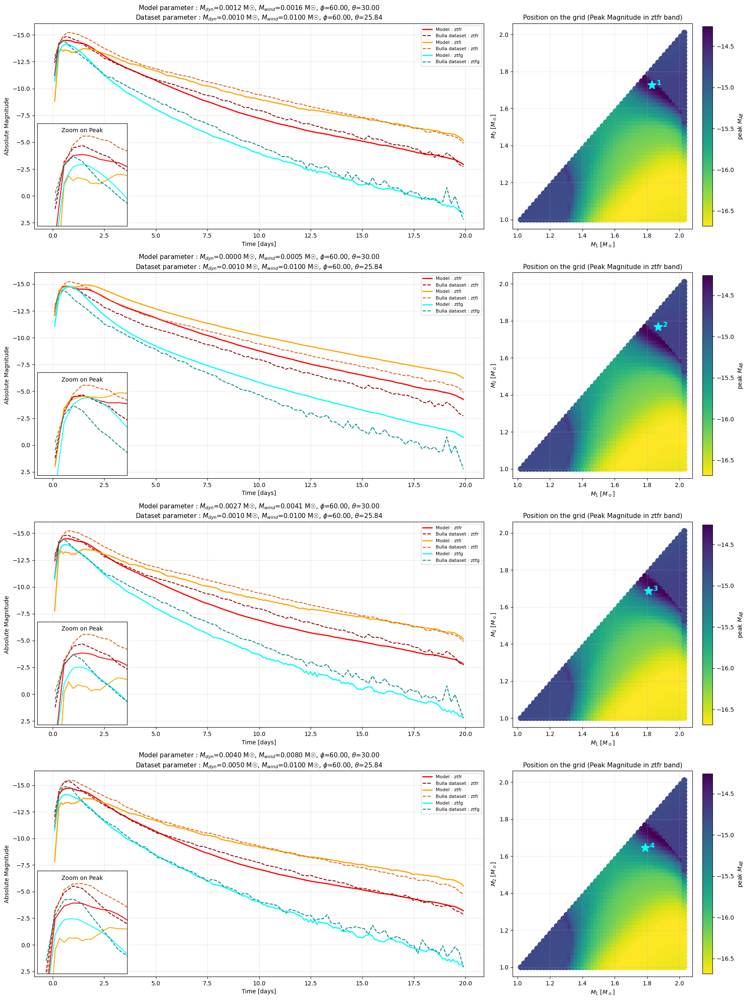

In [31]:
plot_lc_for_indices_v2(selected_indices, phi_60, model_name='Bu2019lm')

In [41]:
# Modification of the plot_indices function

def plot_lc_for_indices_v3(selected_indices, dic, title, filters_band, model_name='Bu2019lm'):
    """Plot the lightcurves for the selected indices and print their parameters.
    Parameters
    ----------
    selected_indices : list
        List of selected indices.
    dic : dict
        Dictionary containing 'pair_array', 'magnitude', 'fit_masses', 'wind_linear', and 'model_param' keys (returned by ejecta_plot_v2).
    title : str
        Title for the plot.
    filters_band : list
        List of filters to be used for the plot.
    model_name : str, optional
        Name of the SVD model to be used (default is 'Bu2019lm') Ideally the same model used in ejecta_plot_v2.
    ----------
    """
    %matplotlib inline
    import matplotlib.pyplot as plt
    import matplotlib.colors as colors
    from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset

    for idx in selected_indices:
        print(f"Selected point (index {idx}):")
        print(f"  M1: {dic['pair_array'][idx, 0]:.3f} M☉")
        print(f"  M2: {dic['pair_array'][idx, 1]:.3f} M☉")
        print(f"  Magnitude: {dic['magnitude'][idx]:.2f}")
        print(f"  M_dyn: {dic['fit_masses'][idx]:.4f} M☉")
        print(f"  M_wind: {dic['wind_linear'][idx]:.4f} M☉")

        print()

    # Setup SVD model
    svd_path = '/home/liteul/memoir_code/NMMA/svdmodels'
    tmin_svd, tmax_svd, dt_svd = 0.1, 19.9, 0.1
    sample_times_svd = np.arange(tmin_svd, tmax_svd + dt_svd, dt_svd)
    svd_model = SVDLightCurveModel(
        model=model_name,
        sample_times=sample_times_svd,
        svd_path=svd_path,
        mag_ncoeff=10,
        lbol_ncoeff=10,
        filters=filters_band
        )

    # Extract data from dictionary
    log_10dyn = np.zeros(len(dic['fit_masses']))
    for i, m in enumerate(dic['fit_masses']):
        if m > 0:
            log_10dyn[i] = np.log10(m)
        else:
            log_10dyn[i] = -5  
    log_10wind = np.log10(0.3) + np.log10(dic['wind_linear'])
    pair_array = dic['pair_array']
    mags = dic['magnitude']
    n_points = len(selected_indices)
    model_param = dic['model_param']
    filter = dic['filter']

    # Plot lc in g r i bands
    # 2 col per point: lc + position on the grid

    fig, axes = plt.subplots(n_points, 2, figsize=(18, 6*n_points), gridspec_kw={'width_ratios': [2.25, 1]})
    # Ensure axes is always 2D
    if n_points == 1:
        axes = axes.reshape(1, -1)

    for i, idx in enumerate(selected_indices):

        model_param.update({
            "log10_mej_dyn": log_10dyn[idx],              # log10(Masse éjectée dynamique en M☉)
            "log10_mej_wind": log_10wind[idx],              # log10(Masse éjectée par vent en M☉)
            })
        _, mag_svd = svd_model.generate_lightcurve(sample_times_svd, model_param)

        # Get corresponding Bulla dataset file (closest match if exact not found)
        Bulla_parameters = {
            'mejdyn': 10**log_10dyn[idx],
            'mejwind': 10**log_10wind[idx],
            'phi': model_param['KNphi'],
            'theta': model_param['KNtheta'],
            'dMpc': 0
        }
        low_params_file = bulla_dataset.get_file(**Bulla_parameters, load_data=True)
        if low_params_file is None:
            closest_file = None
            closest_distance = float('inf') # Initialize with infinity
            for file in bulla_dataset.data_dict.values():
                params = file['params']
                distance = sum(np.sqrt((params.get(key, 0) - Bulla_parameters[key])**2) for key in ['mejdyn', 'mejwind', 'phi', 'theta', 'dMpc']) #  Euclidean distance 
                if distance < closest_distance:
                    closest_distance = distance
                    closest_file = file
            low_params_file = closest_file
            print(f"Using closest match: {low_params_file['filename']} with params {low_params_file['params']}")
            low_params_file['data'] = np.loadtxt(low_params_file['filepath'])
            low_params_file['filters'] = bulla_dataset._extract_filters(low_params_file['filepath'])

        # Plot
        cols = [['red', 'darkred'], ['orange', '#d95f14'], ['cyan', 'darkcyan']]

        for (filter_name, color) in zip(filters_band, cols):
            axes[i,0].plot(sample_times_svd, mag_svd[filter_name], label=f'Model : {filter_name}', linewidth=2, color=color[0])
            if filter_name in low_params_file['filters']:
                filter_idx = low_params_file['filters'].index(filter_name)
                data = low_params_file['data']
                times = data[:, 0]
                axes[i,0].plot(times, data[:, filter_idx + 1], ls='--', label=f'Bulla dataset : {filter_name}', markersize=6, color=color[1])
        axes[i,0].invert_yaxis()
        axes[i,0].set_xlabel('Time [days]', fontsize=10)
        axes[i,0].set_ylabel('Absolute Magnitude', fontsize=10)
        axes[i,0].set_title(f'Model parameter : $M_{{dyn}}$={10**log_10dyn[idx]:.4f} M☉, $M_{{wind}}$={10**log_10wind[idx]:.4f} M☉, $\\phi$={model_param["KNphi"]:.2f}, $\\theta$={model_param["KNtheta"]:.2f}\nDataset parameter : $M_{{dyn}}$={low_params_file["params"]["mejdyn"]:.4f} M☉, $M_{{wind}}$={low_params_file["params"]["mejwind"]:.4f} M☉, $\\phi$={low_params_file["params"]["phi"]:.2f}, $\\theta$={low_params_file["params"]["theta"]:.2f}', fontsize=11)
        axes[i,0].legend(fontsize=8)
        axes[i,0].grid(True, alpha=0.3)

        # Zoom on peak
        axins = inset_axes(axes[i,0], width="20%", height="50%", loc='lower left')
        for (filter_name, color) in zip(filters_band, cols):
            axins.plot(sample_times_svd, mag_svd[filter_name], color=color[0])
            if filter_name in low_params_file['filters']:
                filter_idx = low_params_file['filters'].index(filter_name)
                data = low_params_file['data']
                times = data[:, 0]
                axins.plot(times, data[:, filter_idx + 1], ls='--', color=color[1])

        # Set zoom limits
        lowest_mag = float('inf')
        for filter in filters_band:
            data = low_params_file['data']
            filter_idx = low_params_file['filters'].index(filter)
            if np.min(data[:, filter_idx + 1]) < lowest_mag:
                lowest_mag = np.min(data[:, filter_idx + 1])
                low_time = times[np.argmin(data[:, filter_idx + 1])]
        x1, x2, y1, y2 = low_time-1, low_time+0.5, lowest_mag-0.5, lowest_mag+2.5
        axins.set_xlim(x1, x2)
        axins.set_ylim(y1, y2)
        axins.set_xticks([])
        axins.set_yticks([])
        axins.invert_yaxis()
        axins.set_title('Zoom on Peak', fontsize=10, pad=2, y=0.9)

        mark_inset(axes[i,0], axins, loc1=2, loc2=1, ec='none', lw=1)

        # Show position on the grid
        norm_mag = colors.Normalize(vmin=mags.min(), vmax=mags.max())
        sc = axes[i,1].scatter(pair_array[:, 0], pair_array[:, 1], c=mags, cmap='viridis_r', 
                            s=100, edgecolors=None, linewidths=0.2, norm=norm_mag)
        cbar = fig.colorbar(sc, ax=axes[i,1], orientation='vertical', fraction=0.05)
        cbar.set_label('peak $M_{AB}$', fontsize=10)
        axes[i,1].scatter(pair_array[idx, 0], pair_array[idx, 1], 
                        c='cyan', s=200, marker='*', linewidths=2,
                        zorder=10)
        axes[i,1].text(pair_array[idx, 0], pair_array[idx, 1], f'  {i+1}', fontsize=12, fontweight='bold', color='cyan')
        axes[i,1].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=10)
        axes[i,1].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=10)
        axes[i,1].set_title(f'Position on the grid (Peak Magnitude in {filters_band[0]} band)', fontsize=11)
        axes[i,1].grid(True, alpha=0.25)

    fig.suptitle(title, fontsize=16, y=1.0001)
    plt.tight_layout()
    plt.show()

Processing EOS: H4
Loaded filter bessellr


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Loaded filter besselli
Loaded filter bessellv
✓ SVD model 'Bu2019lm' successfully loaded
  Filters: <class 'filter'>
  Times: 21 points


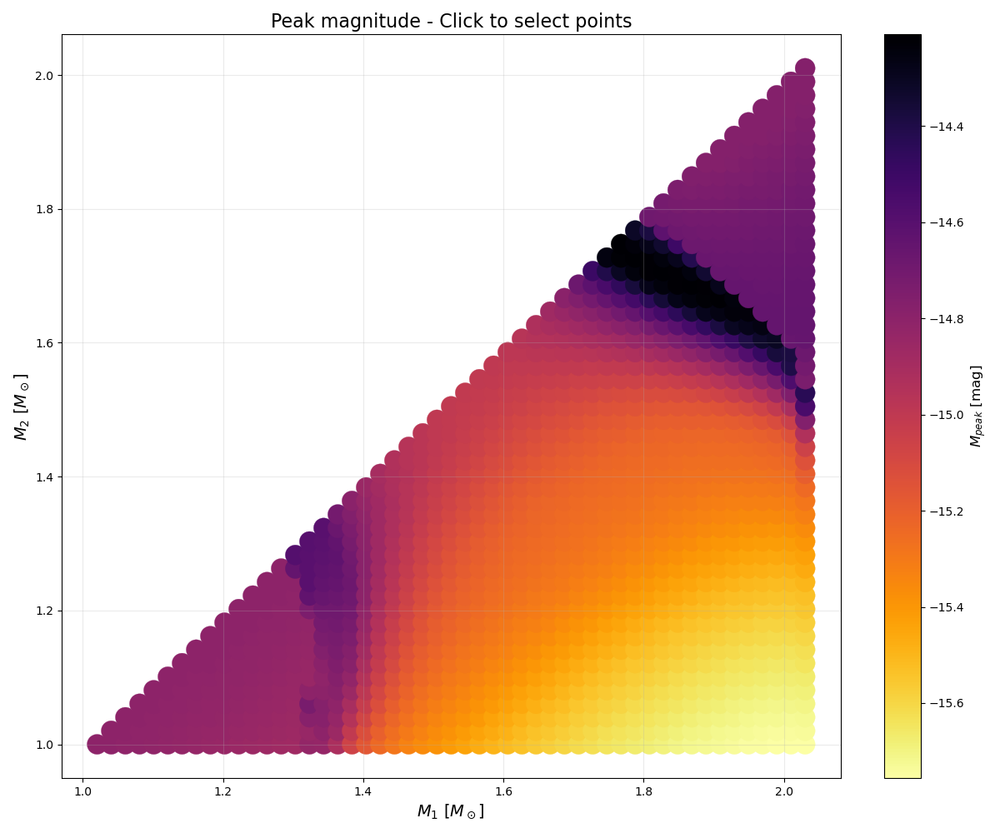

In [48]:
test_dic = ejecta_plot_v2(eos_name='H4', model_name='Bu2019lm', model_param={'KNphi': 90, 'KNtheta': 30, 'luminosity_distance': 0}, filters=['bessellr', 'besselli', 'bessellv'], plot=False)
indices_list = get_indices(test_dic)

Selected point (index 777):
  M1: 1.788 M☉
  M2: 1.727 M☉
  Magnitude: -14.21
  M_dyn: 0.0020 M☉
  M_wind: 0.0081 M☉

Selected point (index 855):
  M1: 1.828 M☉
  M2: 1.707 M☉
  Magnitude: -14.21
  M_dyn: 0.0018 M☉
  M_wind: 0.0080 M☉

Selected point (index 979):
  M1: 1.889 M☉
  M2: 1.667 M☉
  Magnitude: -14.22
  M_dyn: 0.0018 M☉
  M_wind: 0.0103 M☉

Selected point (index 1026):
  M1: 1.909 M☉
  M2: 1.727 M☉
  Magnitude: -14.67
  M_dyn: 0.0000 M☉
  M_wind: 0.0031 M☉

Selected point (index 736):
  M1: 1.768 M☉
  M2: 1.667 M☉
  Magnitude: -14.59
  M_dyn: 0.0037 M☉
  M_wind: 0.0240 M☉

Selected point (index 849):
  M1: 1.828 M☉
  M2: 1.586 M☉
  Magnitude: -14.89
  M_dyn: 0.0053 M☉
  M_wind: 0.0389 M☉

Loaded filter bessellr
Loaded filter besselli
Loaded filter bessellv


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


⚠ No file found for these parameters:
  mejdyn=0.002023787662859961, mejwind=0.002441030742406156, phi=90, theta=30, dMpc=0
Using closest match: nph1.0e+06_mejdyn0.001_mejwind0.010_phi75_theta25.84_dMpc0.dat with params {'nph': '1.0e+06', 'mejdyn': 0.001, 'mejwind': 0.01, 'phi': 75.0, 'theta': 25.84, 'dMpc': 0.0}
⚠ No file found for these parameters:
  mejdyn=0.0017689543332140337, mejwind=0.0023863914878195867, phi=90, theta=30, dMpc=0
Using closest match: nph1.0e+06_mejdyn0.001_mejwind0.010_phi75_theta25.84_dMpc0.dat with params {'nph': '1.0e+06', 'mejdyn': 0.001, 'mejwind': 0.01, 'phi': 75.0, 'theta': 25.84, 'dMpc': 0.0}
⚠ No file found for these parameters:
  mejdyn=0.0017861757980801008, mejwind=0.0030754482248203153, phi=90, theta=30, dMpc=0
Using closest match: nph1.0e+06_mejdyn0.001_mejwind0.010_phi75_theta25.84_dMpc0.dat with params {'nph': '1.0e+06', 'mejdyn': 0.001, 'mejwind': 0.01, 'phi': 75.0, 'theta': 25.84, 'dMpc': 0.0}
⚠ No file found for these parameters:
  mejdyn=1e-0

/tmp/ipykernel_440718/3147093484.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


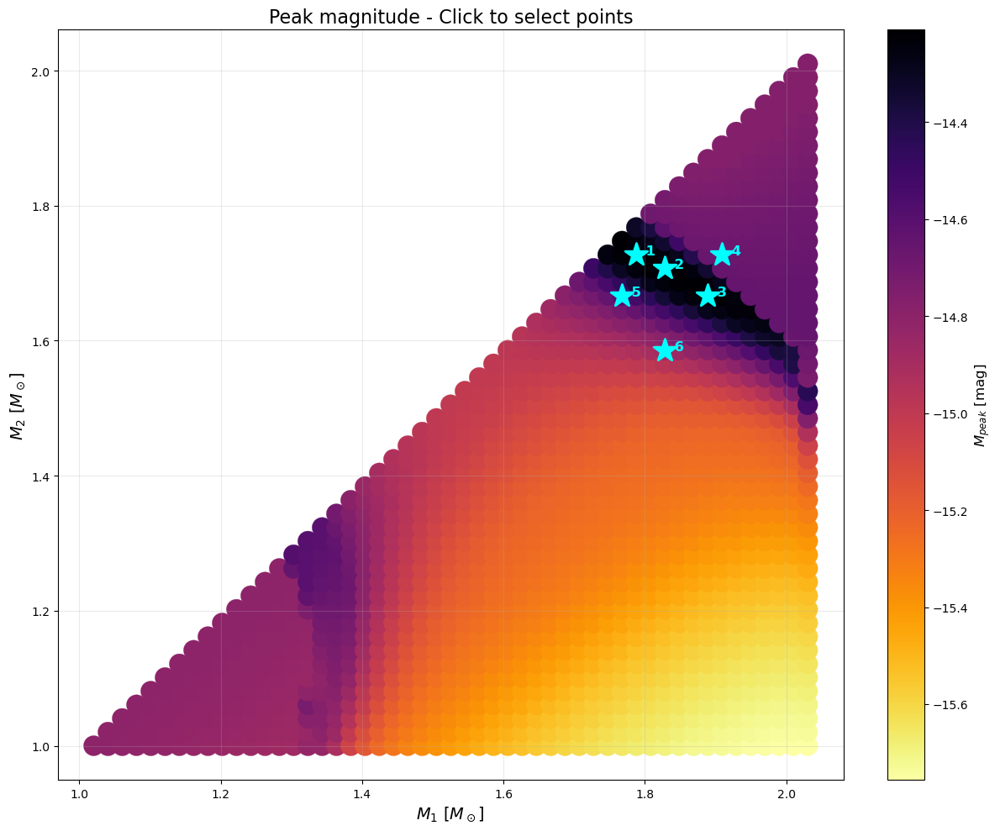

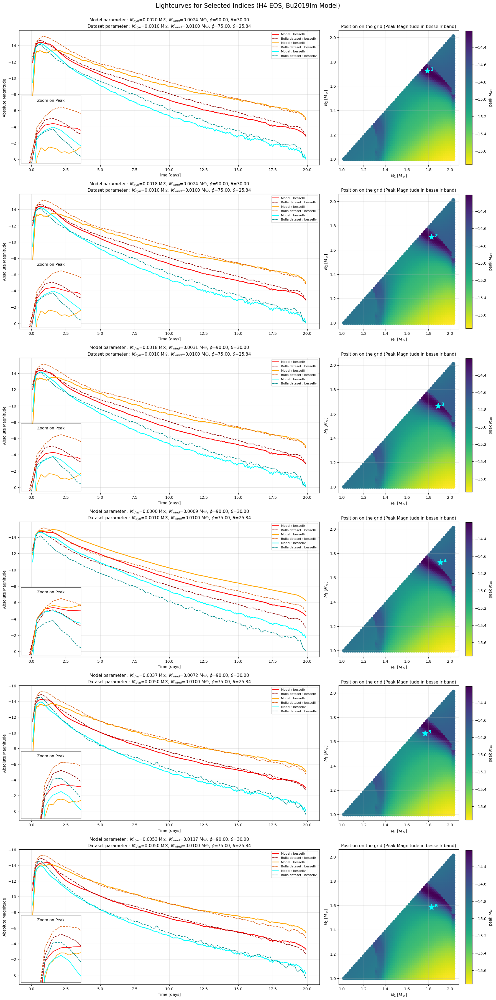

In [49]:
plot_lc_for_indices_v3(indices_list, test_dic, title='Lightcurves for Selected Indices (H4 EOS, Bu2019lm Model)', filters_band=['bessellr', 'besselli', 'bessellv'], model_name='Bu2019lm')

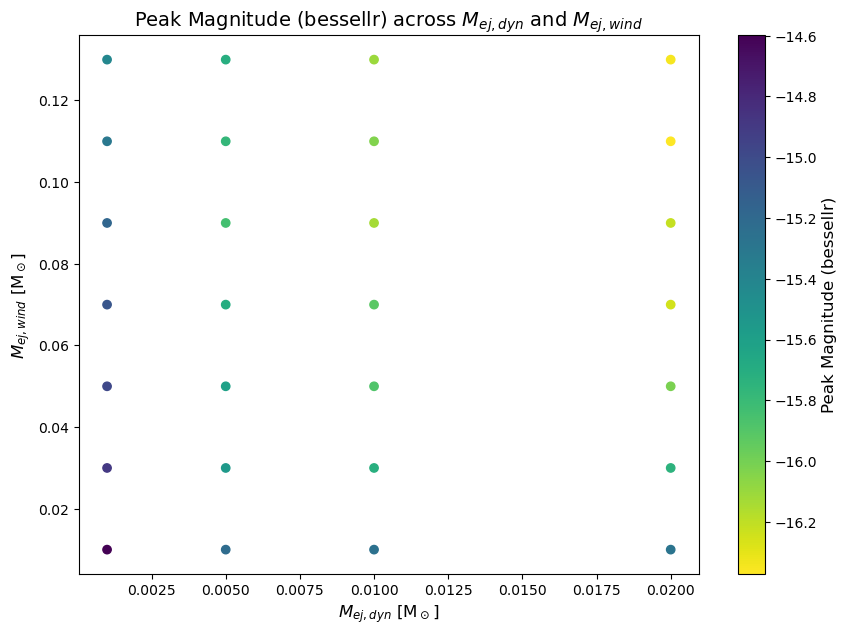

Selected point (index 777):
  M1: 1.788 M☉
  M2: 1.727 M☉
  Magnitude: -14.66
Selected point (index 896):
  M1: 1.848 M☉
  M2: 1.707 M☉
  Magnitude: -14.56
Selected point (index 856):
  M1: 1.828 M☉
  M2: 1.727 M☉
  Magnitude: -14.52
Selected point (index 1024):
  M1: 1.909 M☉
  M2: 1.687 M☉
  Magnitude: -14.49
Selected point (index 937):
  M1: 1.869 M☉
  M2: 1.687 M☉
  Magnitude: -14.61
Selected point (index 779):
  M1: 1.788 M☉
  M2: 1.768 M☉
  Magnitude: -14.52


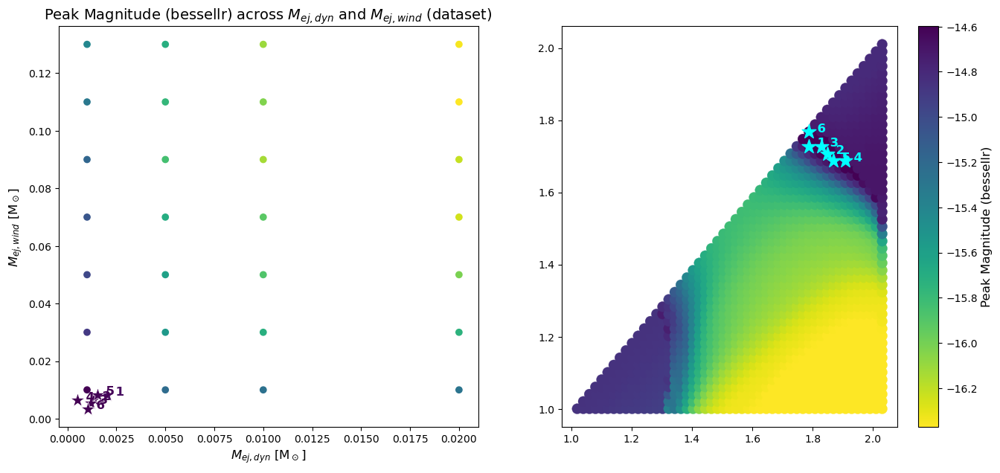

In [45]:
# Scatter plot of peak magnitude (mdyn vs mwind) but in bessellr this time
mejdyn_values = bulla_dataset.param_ranges['mejdyn']['unique']
mejwind_values = bulla_dataset.param_ranges['mejwind']['unique']
peak_magnitudes = np.full((len(mejdyn_values), len(mejwind_values)), np.nan)
for i, mejdyn in enumerate(mejdyn_values):
    for j, mejwind in enumerate(mejwind_values):
        file_info = bulla_dataset.get_file(mejdyn=mejdyn, mejwind=mejwind, phi=benchmark_file['params']['phi'], theta=benchmark_file['params']['theta'], dMpc=0, load_data=True)
        if file_info:
            if file_info['data'] is None:
                file_info['data'] = np.loadtxt(file_info['filepath'])
                file_info['filters'] = bulla_dataset._extract_filters(file_info['filepath'])
            data = file_info['data']
            if 'bessellr' in file_info['filters']:
                filter_idx = file_info['filters'].index('bessellr')
                magnitudes = data[:, filter_idx + 1]
                peak_magnitudes[i, j] = np.min(magnitudes)

# Compact the arrays for plotting with meshgrid
X, Y = np.meshgrid(mejdyn_values, mejwind_values)
Z = peak_magnitudes.T

# Plot
fig, ax = plt.subplots(figsize=(10, 7))
sc = ax.scatter(
    X,
    Y,
    c=Z,
    cmap='viridis_r',
)
ax.set_xlabel('$M_{ej,dyn}$ [M$_\odot$]', fontsize=12)
ax.set_ylabel('$M_{ej,wind}$ [M$_\odot$]', fontsize=12)
ax.set_title('Peak Magnitude (bessellr) across $M_{ej,dyn}$ and $M_{ej,wind}$', fontsize=14)
cbar = plt.colorbar(sc, ax=ax)
cbar.set_label('Peak Magnitude (bessellr)', fontsize=12)
plt.show()

# Plot but smooth
fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(16, 7))
sc = ax[0].scatter(
    X,
    Y,
    c=Z,
    cmap='viridis_r',
)
ax[0].set_xlabel('$M_{ej,dyn}$ [M$_\odot$]', fontsize=12)
ax[0].set_ylabel('$M_{ej,wind}$ [M$_\odot$]', fontsize=12)
ax[0].set_title('Peak Magnitude (bessellr) across $M_{ej,dyn}$ and $M_{ej,wind}$ (dataset)', fontsize=14)
cbar = plt.colorbar(sc, ax=ax[1])
cbar.set_label('Peak Magnitude (bessellr)', fontsize=12)

# add the faulty point
dic = test_dic
vmin, vmax = np.nanmin(Z), np.nanmax(Z)
norm = plt.Normalize(vmin, vmax)
mags = dic['magnitude']
ax[1].scatter(dic['pair_array'][:, 0], dic['pair_array'][:, 1], c=mags, cmap='viridis_r',
                            s=100, edgecolors=None, linewidths=0.2, norm=norm)

for i, idx in enumerate(selected_indices):
    rgba = plt.cm.viridis_r(norm(float(dic['magnitude'][idx])))
    print(f"Selected point (index {idx}):")
    print(f"  M1: {dic['pair_array'][idx, 0]:.3f} M☉")
    print(f"  M2: {dic['pair_array'][idx, 1]:.3f} M☉")
    print(f"  Magnitude: {dic['magnitude'][idx]:.2f}")
    ax[0].scatter(dic['fit_masses'][idx], dic['wind_linear'][idx], color=rgba, s=200, label='Selected Point', marker='*', edgecolors='white', linewidths=0.5)
    ax[0].text(dic['fit_masses'][idx], dic['wind_linear'][idx], f'  {i+1}', fontsize=12, fontweight='bold', color=rgba)

    # Plot position on grid mass
    ax[1].scatter(dic['pair_array'][idx, 0], dic['pair_array'][idx, 1], color='cyan', s=200, label='Selected Point', marker='*')
    ax[1].text(dic['pair_array'][idx, 0], dic['pair_array'][idx, 1], f'  {i+1}', fontsize=12, fontweight='bold', color='cyan')
plt.show()

Processing EOS: H4
Loaded filter bessellr
Loaded filter besselli
Loaded filter bessellv


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


✓ SVD model 'Bu2019lm' successfully loaded
  Filters: <class 'filter'>
  Times: 21 points


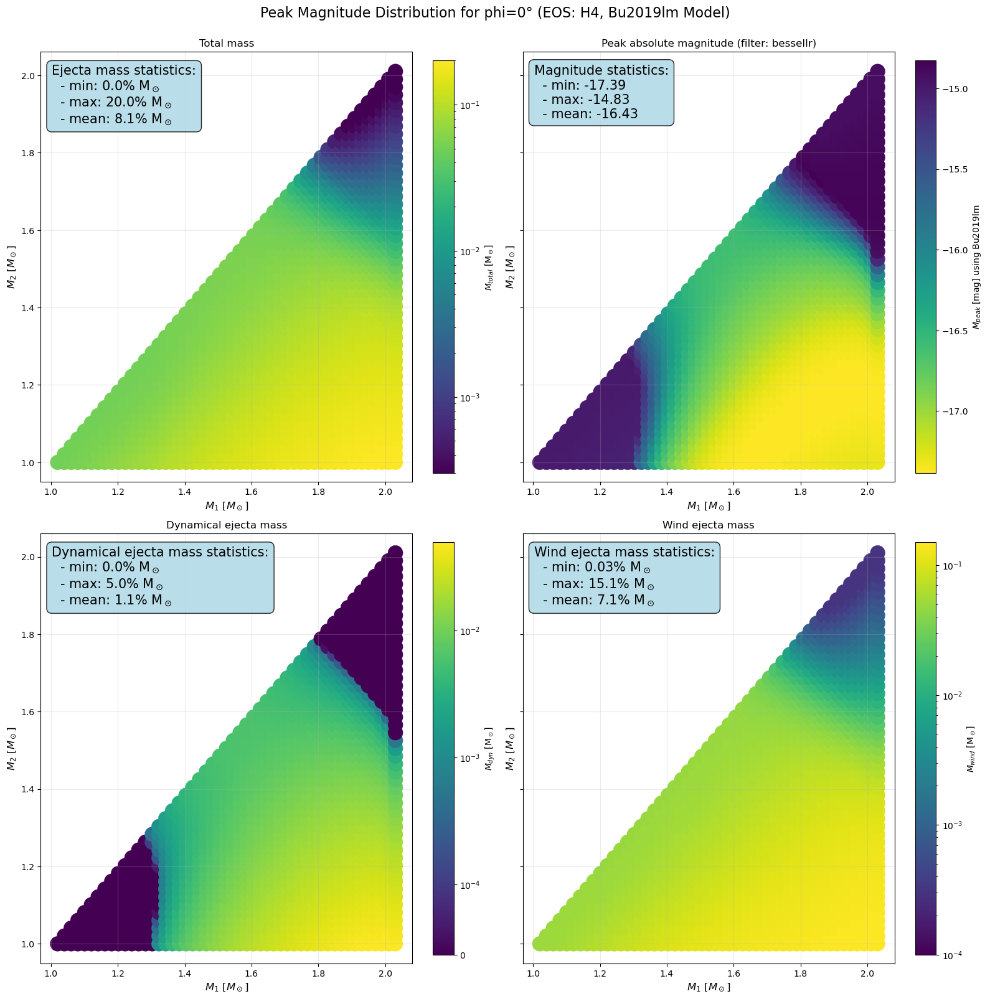

Processing EOS: H4
Loaded filter bessellr
Loaded filter besselli
Loaded filter bessellv
✓ SVD model 'Bu2019lm' successfully loaded
  Filters: <class 'filter'>
  Times: 21 points


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


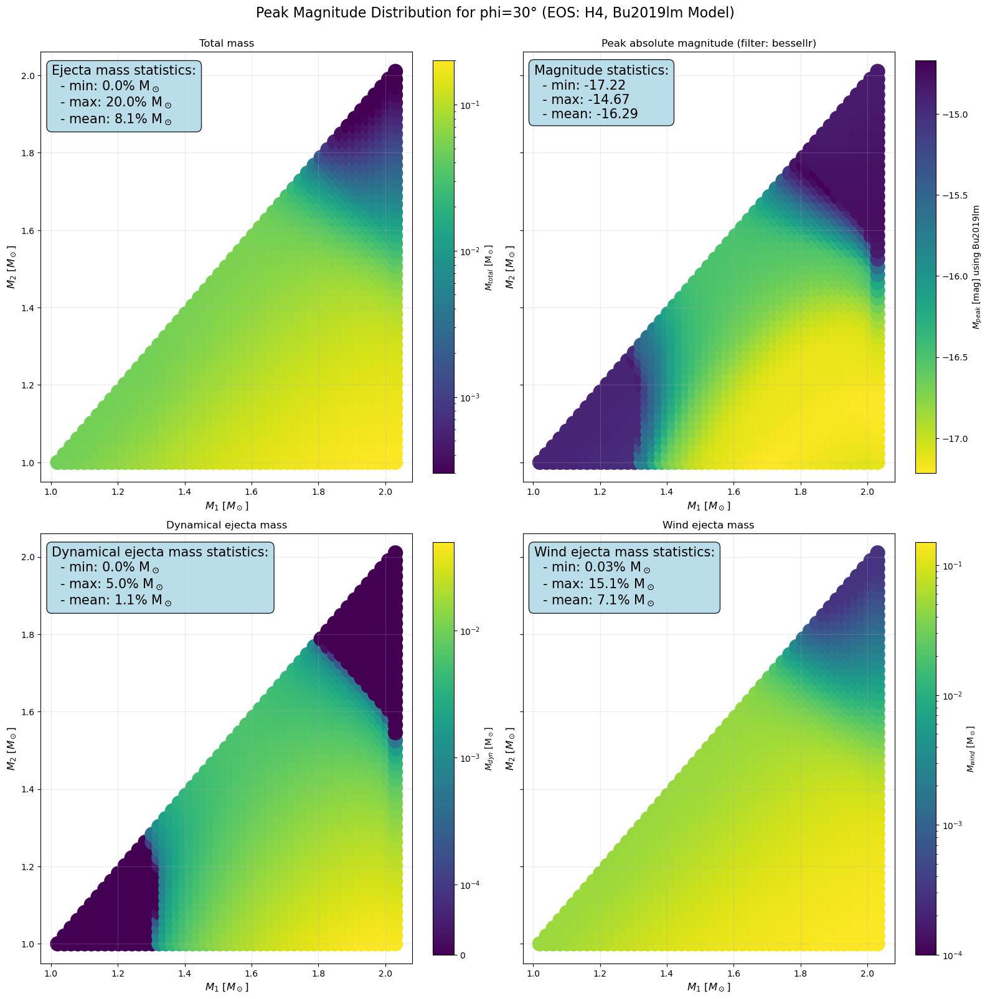

Processing EOS: H4
Loaded filter bessellr
Loaded filter besselli
Loaded filter bessellv
✓ SVD model 'Bu2019lm' successfully loaded
  Filters: <class 'filter'>
  Times: 21 points


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


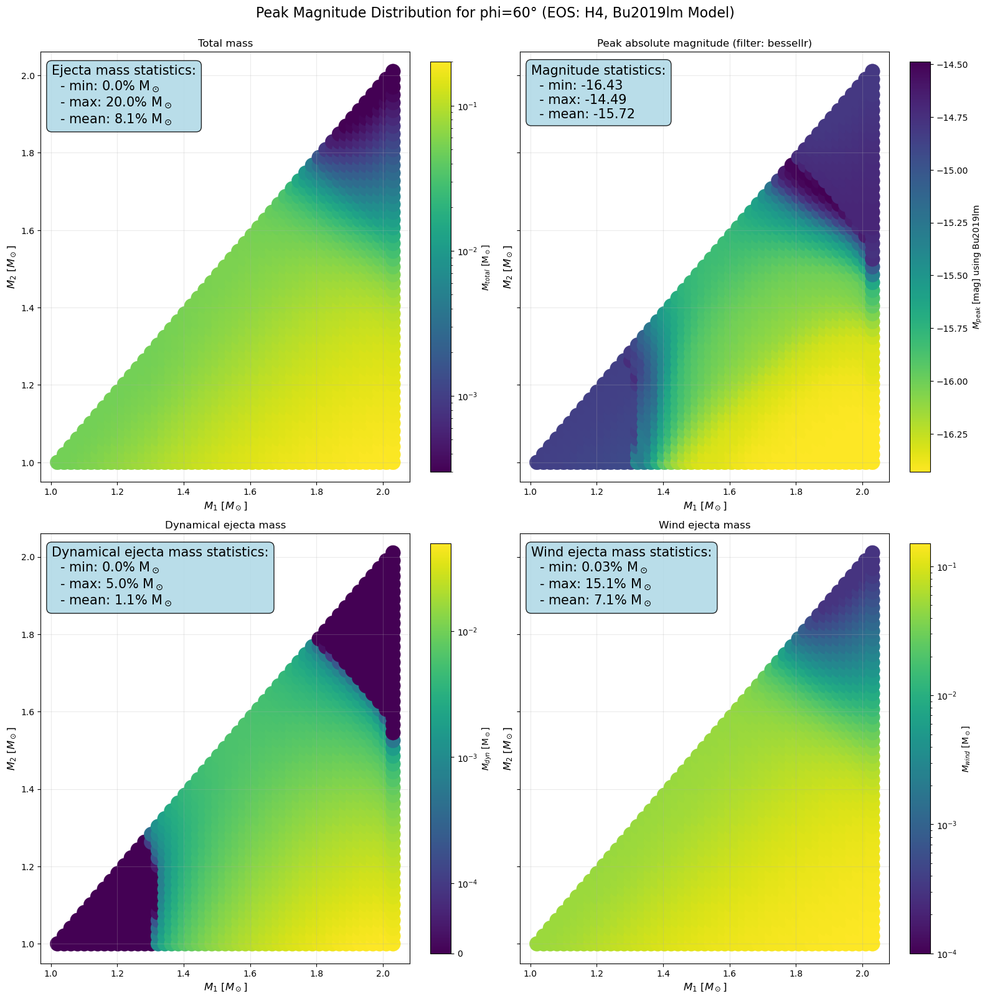

Processing EOS: H4
Loaded filter bessellr
Loaded filter besselli
Loaded filter bessellv
✓ SVD model 'Bu2019lm' successfully loaded
  Filters: <class 'filter'>
  Times: 21 points


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


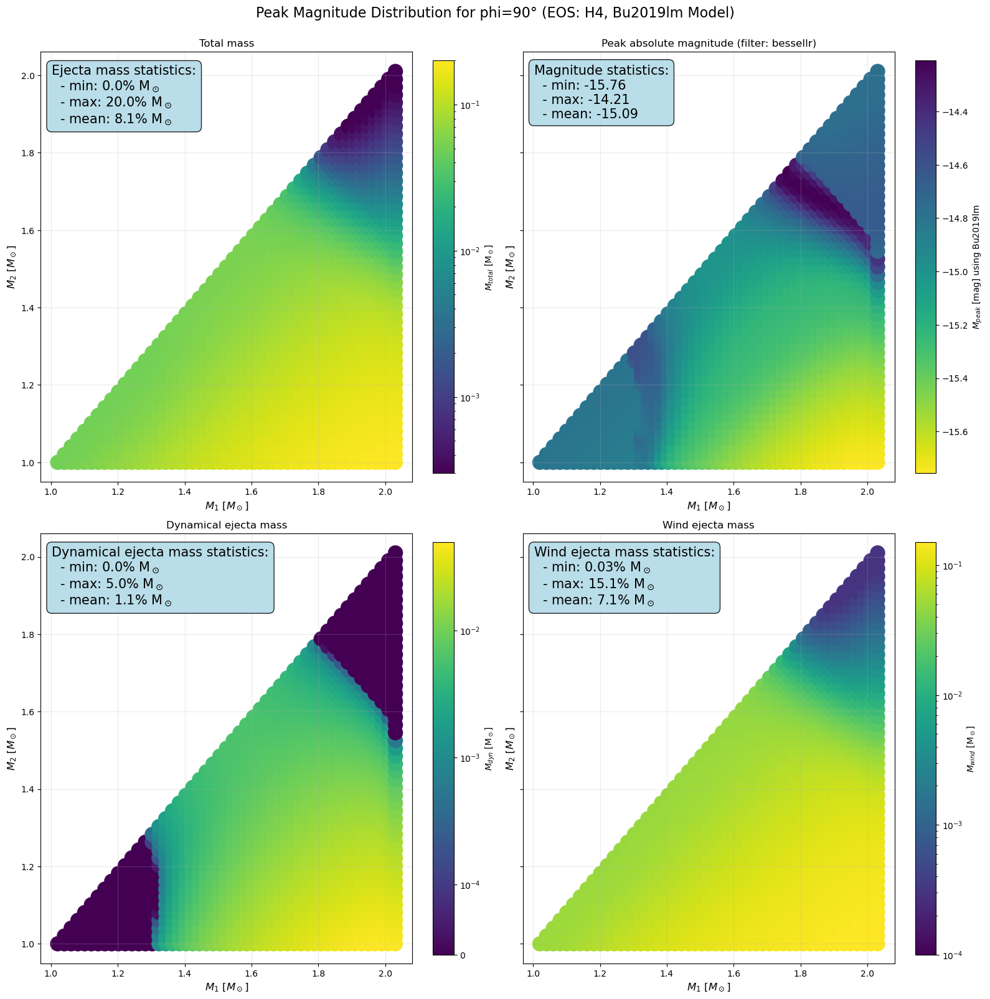

: 

In [ ]:
for phi in [0, 30, 60, 90]:
    ejecta_plot_v2(eos_name='H4', model_name='Bu2019lm', model_param={'KNphi': phi, 'KNtheta': 30, 'luminosity_distance': 0}, filters=['bessellr', 'besselli', 'bessellv'], plot=True, title=f'Peak Magnitude Distribution for phi={phi}° (EOS: H4, Bu2019lm Model)')


In [12]:
# V3 of the function returns fig, ax 
import matplotlib.colors as colors
import matplotlib.pyplot as plt

def ejecta_plot_v3(eos_name, model_name='Bu2019lm', model_param={"luminosity_distance": 40.0, "KNphi": 30.0, "KNtheta": 30.0}, filters=['ztfr', 'ztfi', 'ztfg'], plot=True, title=None, get_fig=False):
    '''Plot the ejecta properties for a given EOS model.
    Parameters
    ----------
    eos_name : str
        Name of the equation of state (EOS) to be used.
    title : str
        Title for the plots.
    model_name : str, optional
        Name of the SVD model to be used (default is 'Bu2019lm'). Attention: : the model must have parameters "log10_mej_dyn" and "log10_mej_wind".
    model_param : dict, optional
        Parameters for the SVD model (default is {"luminosity_distance": 40.0, "KNphi": 30.0, "KNtheta": 30.0}).
    filters : list, optional
        Filters to be used for the light curve.
    plot : bool, optional
        Whether to display the plots (default is True).
    get_fig : bool, optional
        Whether to return the figure and axes objects (default is False).
    -----------
    Returns a dictionary with ejecta masses and magnitudes and optionally the figure and axes objects.
    -----------
    '''
    d = Compactness_dic[eos_name]
    name = eos_name
    print(f"Processing EOS: {name}")
    
    # Create mass pairs
    Mr = d['mass_solar']
    Rr = d['radius_km']

    pair_mass = []
    for i, m1 in enumerate(Mr):
        for j, m2 in enumerate(Mr):
            if m1 > m2:
                pair_mass.append((m1,m2))
    pair_array = np.array(pair_mass)
    n_pairs = pair_array.shape[0]

    # Prepare arrays to store results
    fit_masses = np.zeros(n_pairs)
    wind_log = np.zeros(n_pairs)

    # Retrieve the radius for 1.6 M_solar NS
    target_mass = 1.6
    try:
        masses_eos = d['mass_solar']
        idx_eos = int(np.argmin(np.abs(masses_eos - target_mass)))
        mass_eos = masses_eos[idx_eos]
        radius16 = d['radius_km'][idx_eos]
    except Exception as e:
        print(f"  - {name}: erreur ->", e)

    # Compute ejecta masses for each pair
    for idx, (m1, m2) in enumerate(pair_array):
        idx1 = np.argmin(np.abs(Mr - m1))
        idx2 = np.argmin(np.abs(Mr - m2))
        R1 = Rr[idx1]
        R2 = Rr[idx2]
        fit_masses[idx] = dyn_ej(M1=m1, R1=R1, M2=m2, R2=R2)
        wind_log[idx] = wind_ej(m1, m2, Mtov=Mr.max(), R16=radius16)
    wind_linear = 0.3 * 10 ** (wind_log)
    total_mass = fit_masses +  wind_linear

    # Setup SVD model
    svd_path = '/home/liteul/memoir_code/NMMA/svdmodels'
    tmin_svd, tmax_svd, dt_svd = 0.1, 10.0, 0.5
    sample_times_svd = np.arange(tmin_svd, tmax_svd + dt_svd, dt_svd)
    svd_model = SVDLightCurveModel(
        model=model_name,
        sample_times=sample_times_svd,
        svd_path=svd_path,
        mag_ncoeff=10,
        lbol_ncoeff=10,
        filters=filters
    )
    print(f"✓ SVD model '{model_name}' successfully loaded")
    print(f"  Filters: {filter}")
    print(f"  Times: {len(sample_times_svd)} points")

    # Plotting

    # Convert to log scale for plotting and lightcurve calculation
    log_10wind = np.log10(0.3) + wind_log
    log_10dyn = np.zeros(n_pairs)
    for i, m in enumerate(fit_masses):
        if m > 0:
            log_10dyn[i] = np.log10(m)
        else:
            log_10dyn[i] = -5  
    log_10total = np.log10(total_mass)

    
    # Compute magnitude using SVD model
    mags= np.zeros(n_pairs)
    for idx, param in enumerate(zip(log_10dyn, log_10wind)):
        model_param.update({
            "log10_mej_dyn": param[0],              # log10(Masse éjectée dynamique en M☉)
            "log10_mej_wind": param[1],              # log10(Masse éjectée par vent en M☉)
        })
        _, mag_svd = svd_model.generate_lightcurve(sample_times_svd, model_param)
        mag = np.min(mag_svd[filters[0]])
        mags[idx] = mag

    if plot:
        if title is None:
            title = f'Ejecta properties for EOS: {eos_name}'

        fig, axes = plt.subplots(2, 2, figsize=(16, 16), sharey=True)

        # Top left: ejecta mass
        norm_ejecta = colors.LogNorm(vmin=total_mass.min(), vmax=total_mass.max())
        sc0 = axes[0,0].scatter(pair_array[:, 0], pair_array[:, 1], c=total_mass, cmap='viridis', s=300, edgecolors=None, linewidths=0.2, norm=norm_ejecta)
        axes[0,0].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=12)
        axes[0,0].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
        axes[0,0].set_title('Total mass')
        axes[0,0].grid(True, alpha=0.25)
        cbar0 = fig.colorbar(sc0, ax=axes[0,0], orientation='vertical', fraction=0.05)
        cbar0.set_label('$M_{total}$ [M$_\\odot$]')

        # text box for ejecta stats
        ejecta_stats = (f'Ejecta mass statistics:\n'
                    f'  - min: {total_mass.min():.1%} M$_\\odot$\n'
                    f'  - max: {total_mass.max():.1%} M$_\\odot$\n'
                    f'  - mean: {total_mass.mean():.1%} M$_\\odot$')
        axes[0,0].text(0.03, 0.97, ejecta_stats, transform=axes[0,0].transAxes,
                    fontsize=15, va='top', ha='left',
                    bbox=dict(boxstyle='round,pad=0.4', facecolor='lightblue', alpha=0.85, edgecolor='0'))

        # Top right: peak magnitude
        norm_mag = colors.Normalize(vmin=mags.min(), vmax=mags.max())
        sc1 = axes[0,1].scatter(pair_array[:, 0], pair_array[:, 1], c=mags, cmap='viridis_r', s=300, edgecolors=None, linewidths=0.2, norm=norm_mag)
        axes[0,1].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=12)
        axes[0,1].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
        axes[0,1].set_title(f'Peak absolute magnitude (filter: {filters[0]})')
        axes[0,1].grid(True, alpha=0.25)
        cbar1 = fig.colorbar(sc1, ax=axes[0,1], orientation='vertical', fraction=0.05)
        cbar1.set_label(f'$M_{{peak}}$ [mag] using {model_name}')

        # text box for mag
        mag_stats = (f'Magnitude statistics:\n'
                    f'  - min: {mags.min():.2f}\n'
                    f'  - max: {mags.max():.2f}\n'
                    f'  - mean: {mags.mean():.2f}')
        axes[0,1].text(0.03, 0.97, mag_stats, transform=axes[0,1].transAxes,
                    fontsize=15, va='top', ha='left',
                    bbox=dict(boxstyle='round,pad=0.4', facecolor='lightblue', alpha=0.85, edgecolor='0'))

        # Bottom left: dyn ejecta mass
        norm_dyn = colors.SymLogNorm(vmin=0, vmax=fit_masses.max(), linthresh=1e-4, linscale=0.5)
        sc2 = axes[1,0].scatter(pair_array[:, 0], pair_array[:, 1], c=fit_masses, cmap='viridis', s=300, edgecolors=None, linewidths=0.2, norm=norm_dyn)
        axes[1,0].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=12) 
        axes[1,0].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
        axes[1,0].set_title('Dynamical ejecta mass')
        axes[1,0].grid(True, alpha=0.25)
        cbar2 = fig.colorbar(sc2, ax=axes[1,0], orientation='vertical', fraction=0.05)
        cbar2.set_label('$M_{dyn}$ [M$_\\odot$]')

        # text box for dyn ejecta stats
        dyn_stats = (f'Dynamical ejecta mass statistics:\n'
                    f'  - min: {fit_masses.min():.1%} M$_\\odot$\n'
                    f'  - max: {fit_masses.max():.1%} M$_\\odot$\n'
                    f'  - mean: {fit_masses.mean():.1%} M$_\\odot$')
        axes[1,0].text(0.03, 0.97, dyn_stats, transform=axes[1,0].transAxes,
                    fontsize=15, va='top', ha='left',
                    bbox=dict(boxstyle='round,pad=0.4', facecolor='lightblue', alpha=0.85, edgecolor='0'))

        # Bottom right: wind ejecta mass
        norm_wind = colors.LogNorm(vmin=10e-5, vmax=wind_linear.max())
        sc3 = axes[1,1].scatter(pair_array[:, 0], pair_array[:, 1], c=wind_linear, cmap='viridis', s=300, edgecolors=None, linewidths=0.2, norm=norm_wind)
        axes[1,1].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=12) 
        axes[1,1].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
        axes[1,1].set_title('Wind ejecta mass')
        axes[1,1].grid(True, alpha=0.25)
        cbar3 = fig.colorbar(sc3, ax=axes[1,1], orientation='vertical', fraction=0.05)
        cbar3.set_label('$M_{wind}$ [M$_\\odot$]')
        
        # text box for wind ejecta stats
        wind_stats = (f'Wind ejecta mass statistics:\n'
                    f'  - min: {wind_linear.min():.2%} M$_\\odot$\n'
                    f'  - max: {wind_linear.max():.1%} M$_\\odot$\n'
                    f'  - mean: {wind_linear.mean():.1%} M$_\\odot$')
        axes[1,1].text(0.03, 0.97, wind_stats, transform=axes[1,1].transAxes,
                    fontsize=15, va='top', ha='left',
                    bbox=dict(boxstyle='round,pad=0.4', facecolor='lightblue', alpha=0.85, edgecolor='0'))
        
        plt.suptitle(title, fontsize=16, y=1.0002)

        plt.tight_layout()
        plt.show()

    if get_fig:
        return fig, axes, {
        "model_param": model_param,
        "magnitude": mags,
        "fit_masses": fit_masses,
        "wind_linear": wind_linear,
        "pair_array": pair_array,
        "filter": filters
        }
    else:
        return {
        "model_param": model_param,
        "magnitude": mags,
        "fit_masses": fit_masses,
        "wind_linear": wind_linear,
        "pair_array": pair_array,
        "filter": filters
        }

Processing EOS: H4
Loaded filter ztfr
Loaded filter ztfi


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Loaded filter ztfg
✓ SVD model 'Bu2019lm' successfully loaded
  Filters: <class 'filter'>
  Times: 21 points


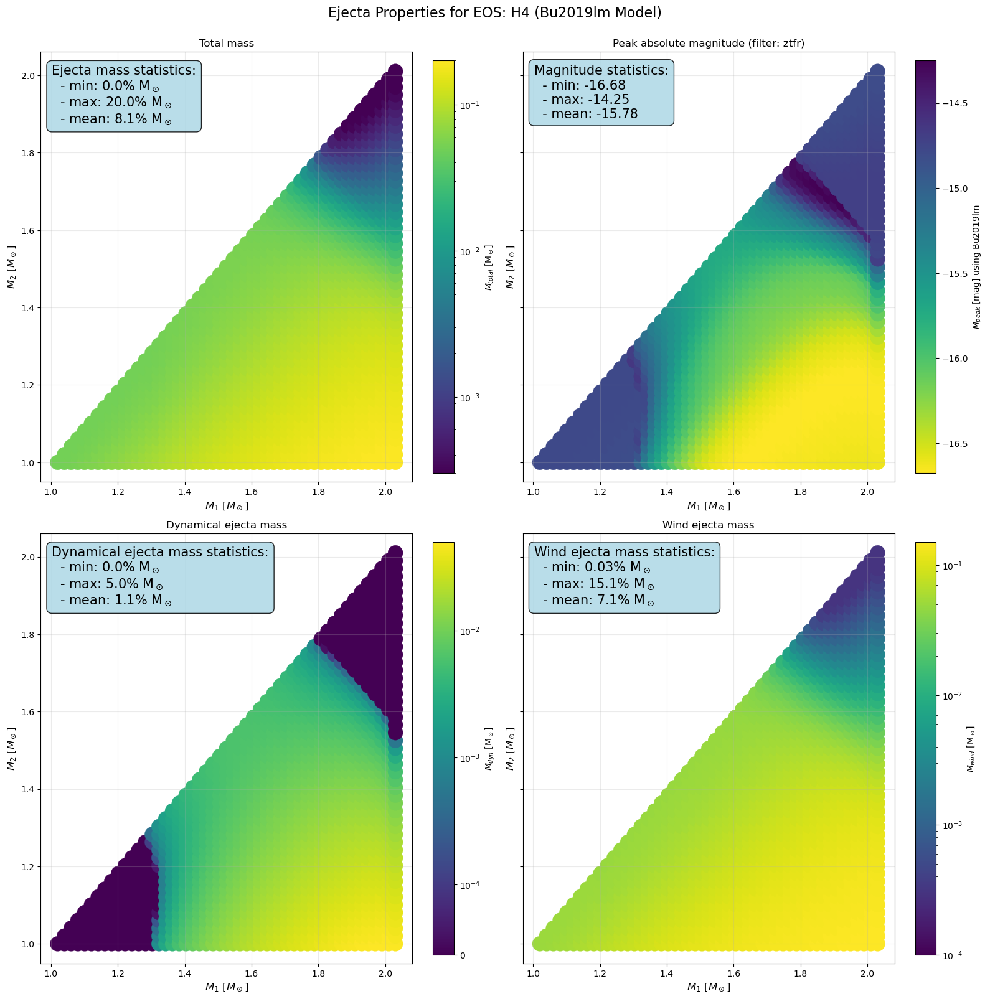

{'model_param': {'KNphi': 60,
  'KNtheta': 30,
  'luminosity_distance': 0,
  'log10_mej_dyn': -5.0,
  'log10_mej_wind': -3.5228787452803374},
 'magnitude': array([-14.78308333, -14.78415393, -14.78306558, ..., -14.80223517,
        -14.80223517, -14.80223517]),
 'fit_masses': array([0., 0., 0., ..., 0., 0., 0.]),
 'wind_linear': array([0.04964745, 0.05051604, 0.04963314, ..., 0.0003    , 0.0003    ,
        0.0003    ]),
 'pair_array': array([[1.02020202, 1.        ],
        [1.04040404, 1.        ],
        [1.04040404, 1.02020202],
        ...,
        [2.03030303, 1.96969697],
        [2.03030303, 1.98989899],
        [2.03030303, 2.01010101]]),
 'filter': ['ztfr', 'ztfi', 'ztfg']}

In [13]:
ejecta_plot_v3(eos_name='H4', model_name='Bu2019lm', model_param={'KNphi': 60, 'KNtheta': 30, 'luminosity_distance': 0}, filters=['ztfr', 'ztfi', 'ztfg'], plot=True, title='Ejecta Properties for EOS: H4 (Bu2019lm Model)', get_fig=False)